# IMPORTS

In [27]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator

#sklearn
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
#from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import PolynomialFeatures
#from sklearn import set_config
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
from sklearn.base import clone
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import MultiTaskLasso
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor


# feature engine
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.timeseries.forecasting import WindowFeatures
from feature_engine.timeseries.forecasting import ExpandingWindowFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.selection import DropFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.creation import CyclicalFeatures


# light GBM
from lightgbm import LGBMRegressor

# sktime
from sktime.transformations.series.time_since import TimeSince


# statsmodels
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import ccf
from statsmodels.tsa.seasonal import STL

# optuna and other optimizatopm
import optuna

In [28]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [29]:
# helper function imports & Class
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from basic_helper_functions import plot_clean_plot

from Feature_Engineering_Multi import GOR_WCUT_Transformer
from Feature_Engineering_Multi import plot_ccf,lag_plot 
from Feature_Engineering_Multi import MultiPhaseLassoSelectedLagFeatureAdder
from Feature_Engineering_Multi import TrendFeatureAdder
from Feature_Engineering_Multi import AddSelectedCalendarFourierFeaturesMultiPhase

from Feature_Engineering_Multi import AddSpecificLag1Features
from Machine_Learning_Multi import recursive_forecast_multiphase
from Machine_Learning_Multi import walk_forward_recursive_forecast_multiphase
from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics
from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics

from Feature_Engineering import AddSelectedCalendarFourierFeatures
from Machine_Learning import plot_train_val_predictions_time
from Machine_Learning import plot_train_val_actual_vs_predicted_crossplot

#from Machine_Learning import create_model_results_table
#from Machine_Learning import add_model_result
#from Machine_Learning import style_model_results_table

# Load data

In [30]:
# load the data
df = pd.read_csv('processed_inputs/df1.csv',index_col='DATEPRD', parse_dates=True)
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df.asfreq('D')
# drop ,'GOR_MSCF_STB', 'WCUT. I calculated this before in my helper function. But i need to calculate as part of a pipeline. so i will need to drop it
df = df.drop(columns=['GOR_MSCF_STB', 'WCUT'])

In [31]:
# Split data

In [32]:
(df.columns,len(df.columns))

(Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
        'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
        'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
        'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'BORE_WI_VOL_STB_D', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
       dtype='object'),
 23)

In [33]:
#target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
#predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       #'DP_CHOKE_SIZE_PSI',
      #'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       #'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       #'BORE_WI_VOL_STB_D', 'AVG_WHT_P']
#predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']
#starting_total_features=len(target_col)+len(predictor_num_col)+len(predictor_cat_cols)
#starting_total_features

# Preprocessing

In the preprocessing I am going to:
1. Remove all columns that have zeros or nan greater than 50% of the data
2. Make negative values zero
3. Then if any columns have nan, prints the column and the nan and then does linear interpolation

how many nans before cleaning
WELL_BORE_CODE                  0
NPD_WELL_BORE_CODE              0
NPD_WELL_BORE_NAME              0
NPD_FIELD_CODE                  0
NPD_FIELD_NAME                  0
NPD_FACILITY_CODE               0
NPD_FACILITY_NAME               0
ON_STREAM_HRS                   0
AVG_CHOKE_SIZE_P                0
AVG_CHOKE_UOM                   0
FLOW_KIND                       0
WELL_TYPE                       0
AVG_DOWNHOLE_PRESSURE_PSI       3
AVG_DOWNHOLE_TEMPERATURE_F      3
AVG_DP_TUBING_PSI               3
AVG_ANNULUS_PRESS_PSI         729
DP_CHOKE_SIZE_PSI               0
AVG_WHP_P_PSI                   0
BORE_WI_VOL_STB_D             746
AVG_WHT_P                       0
BORE_OIL_VOL_STB_D              0
BORE_GAS_VOL_MSCF_D             0
BORE_WAT_VOL_STB_D              0
dtype: int64
Plot before cleaning


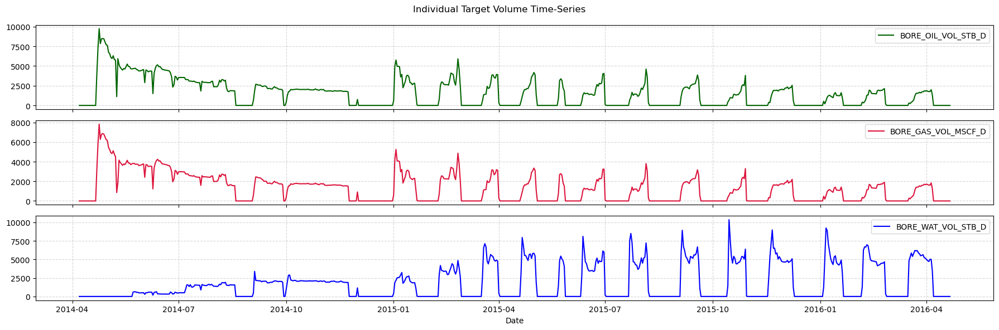

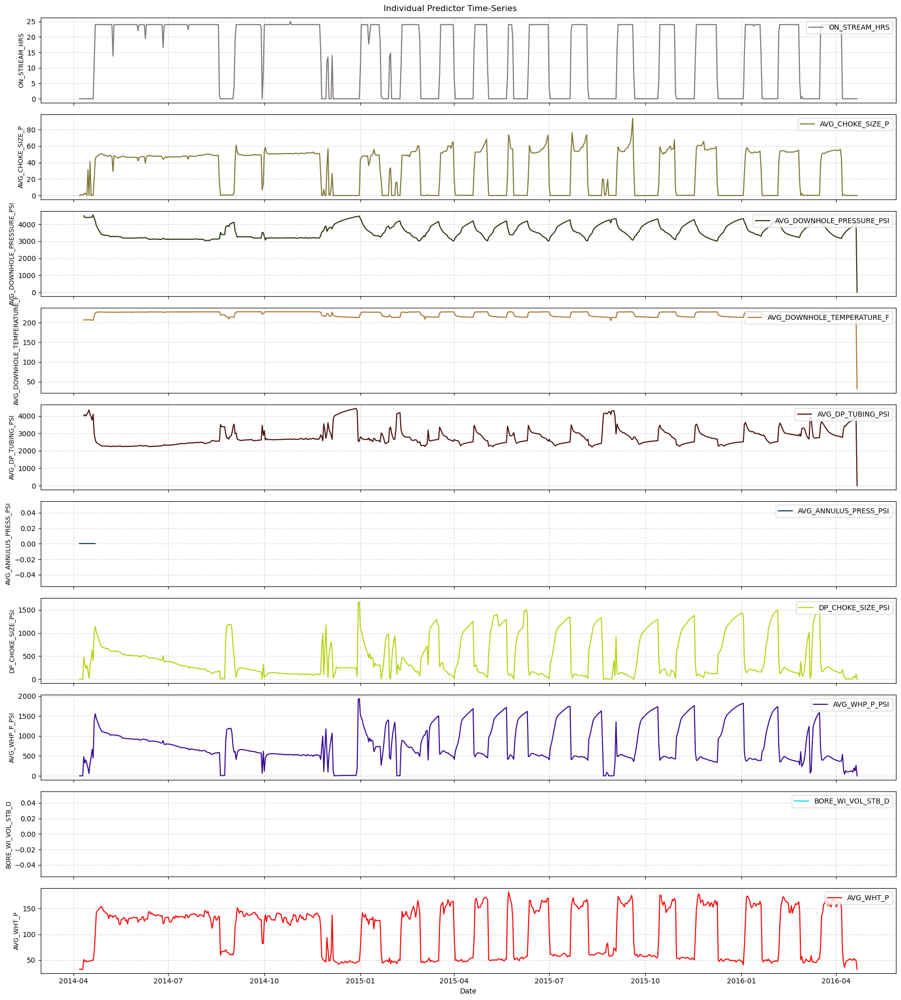

Cleaning data
The length of the dataframe before cleaning is 746
Deleted columns with nan greater than 50% of the total data: ['AVG_ANNULUS_PRESS_PSI', 'BORE_WI_VOL_STB_D']
Deleted columns with zero greater than 50% of the total data: []
Before cleaning, AVG_DOWNHOLE_PRESSURE_PSI has 3 NaNs
Before cleaning, AVG_DOWNHOLE_TEMPERATURE_F has 3 NaNs
Before cleaning, AVG_DP_TUBING_PSI has 3 NaNs
how many nans after cleaning
WELL_BORE_CODE                            0
NPD_WELL_BORE_CODE                        0
NPD_WELL_BORE_NAME                        0
NPD_FIELD_CODE                            0
NPD_FIELD_NAME                            0
NPD_FACILITY_CODE                         0
NPD_FACILITY_NAME                         0
ON_STREAM_HRS                             0
AVG_CHOKE_SIZE_P                          0
AVG_CHOKE_UOM                             0
FLOW_KIND                                 0
WELL_TYPE                                 0
AVG_DOWNHOLE_PRESSURE_PSI                 0
AVG_DO

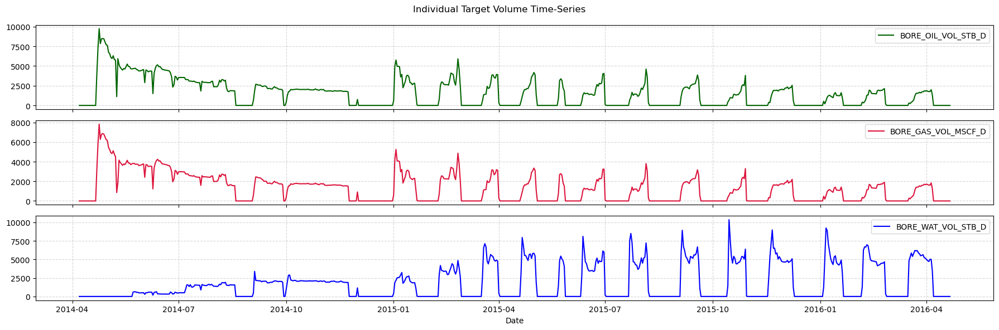

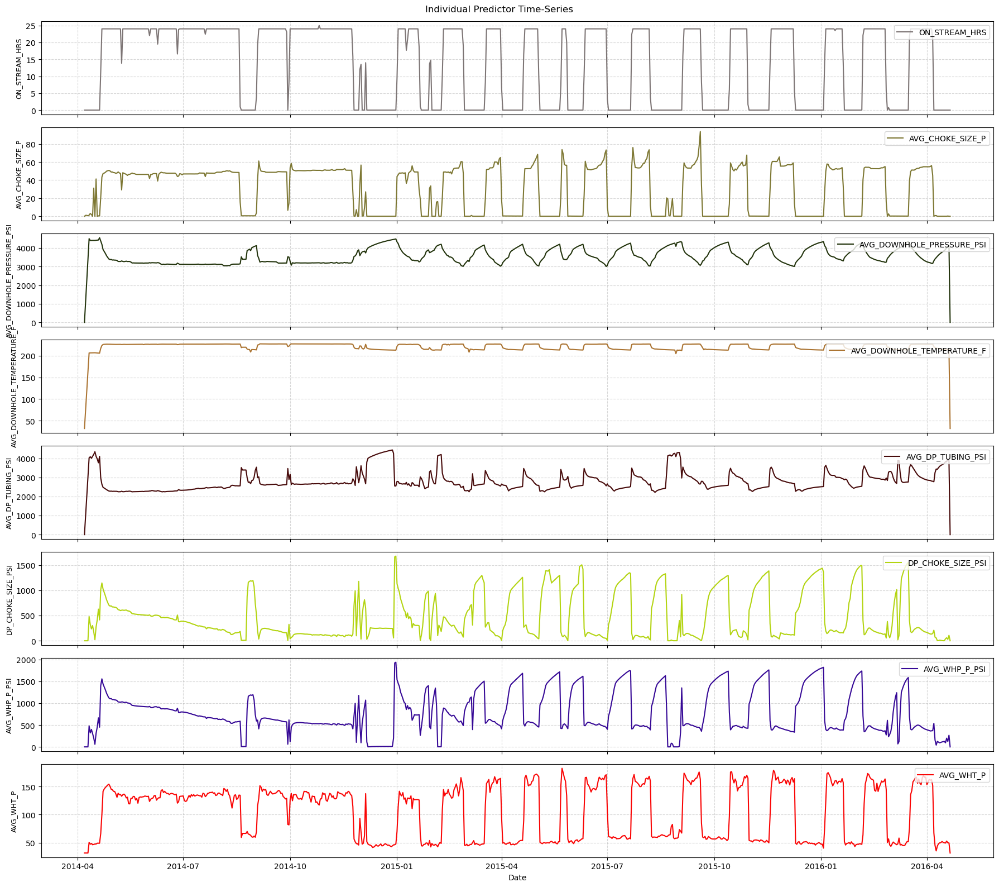

In [9]:
# dropped_nan_cols columns that have nan with more than 50% 
# dropped_zero_cols columns that have zeros with more than 50%
#missing_indicator_cols list of columns that tells us the column nan was changed using linear interpolation
#negative_indicator_cols   #list of columns that tells us the columns with negative values was set to zero

df, dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols=plot_clean_plot(df)

In [10]:
df.columns

Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
       'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
       'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D',
       'AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
       'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
       'AVG_DP_TUBING_PSI_WAS_MISSING'],
      dtype='object')

In [22]:
# just to see the columns that were drops
dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols

(['AVG_ANNULUS_PRESS_PSI', 'BORE_WI_VOL_STB_D'],
 [],
 ['AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
  'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
  'AVG_DP_TUBING_PSI_WAS_MISSING'],
 [])

In [23]:
# drop indicator columns
df = df.drop(columns=missing_indicator_cols,errors='ignore')
df = df.drop(columns=negative_indicator_cols,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0


In [24]:
# drop columns not needed
cols_to_drop = ['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
                'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
                'NPD_FACILITY_NAME',"AVG_CHOKE_UOM",'FLOW_KIND', 'WELL_TYPE']
df = df.drop(columns=cols_to_drop,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0


In [25]:
#df = df.drop(columns=['GOR_MSCF_STB', 'WCUT'])

In [26]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

# Feature Engineering Steps
This steps is for making and testing the pipeline. It uses all the data. Again it is only for making sure the pipepline works

## 1 Calulate GOR and WCUT

In [34]:
GOR_WCUT_feat=GOR_WCUT_Transformer(
        oil_col='BORE_OIL_VOL_STB_D', 
        gas_col='BORE_GAS_VOL_MSCF_D', 
        water_col='BORE_WAT_VOL_STB_D')

In [35]:
# Add the GOR and WCUT to the dataframe.
df = GOR_WCUT_feat.fit_transform(df)

In [36]:
df

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,BORE_WI_VOL_STB_D,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.000000,%,...,0.0,0.000000,0.000000,NaN,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.003059,%,...,0.0,0.000000,0.000000,NaN,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.979008,%,...,0.0,0.000000,0.000000,NaN,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.545759,%,...,0.0,0.000000,0.000000,NaN,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.215987,%,...,0.0,479.668948,480.045032,NaN,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.000000,%,...,NaN,38.366612,94.247723,NaN,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.000000,%,...,NaN,59.755656,198.904678,NaN,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.265188,%,...,NaN,27.068152,124.381543,NaN,50.214308,0.0,0.0,0.0,0.0,0.0


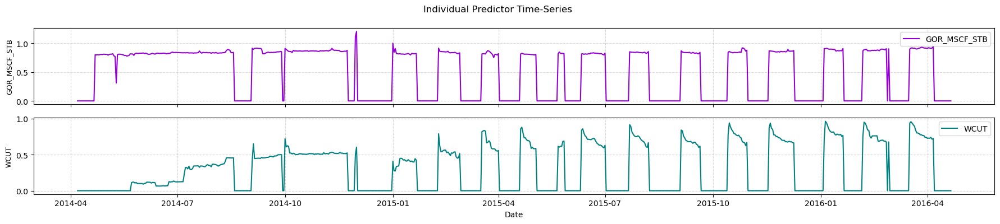

In [37]:
# plot the GOR and WCUT
seperate_predictor_plot(df[["GOR_MSCF_STB","WCUT"]])

In [38]:
df.isnull().sum()

WELL_BORE_CODE                  0
NPD_WELL_BORE_CODE              0
NPD_WELL_BORE_NAME              0
NPD_FIELD_CODE                  0
NPD_FIELD_NAME                  0
NPD_FACILITY_CODE               0
NPD_FACILITY_NAME               0
ON_STREAM_HRS                   0
AVG_CHOKE_SIZE_P                0
AVG_CHOKE_UOM                   0
FLOW_KIND                       0
WELL_TYPE                       0
AVG_DOWNHOLE_PRESSURE_PSI       3
AVG_DOWNHOLE_TEMPERATURE_F      3
AVG_DP_TUBING_PSI               3
AVG_ANNULUS_PRESS_PSI         729
DP_CHOKE_SIZE_PSI               0
AVG_WHP_P_PSI                   0
BORE_WI_VOL_STB_D             746
AVG_WHT_P                       0
BORE_OIL_VOL_STB_D              0
BORE_GAS_VOL_MSCF_D             0
BORE_WAT_VOL_STB_D              0
GOR_MSCF_STB                    0
WCUT                            0
dtype: int64

(df.select_dtypes(include='number') < 0).sum()

## 2 Lag Selection

### 2.1 Seasonal Plots

The selection is just to plot to see what seasonal pattern I see. I going to use this later in 5 where I actually create features for these seasonal patterns

In [40]:
df.columns

Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
       'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
       'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'BORE_WI_VOL_STB_D', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

#### Day of the week seasonal pattern

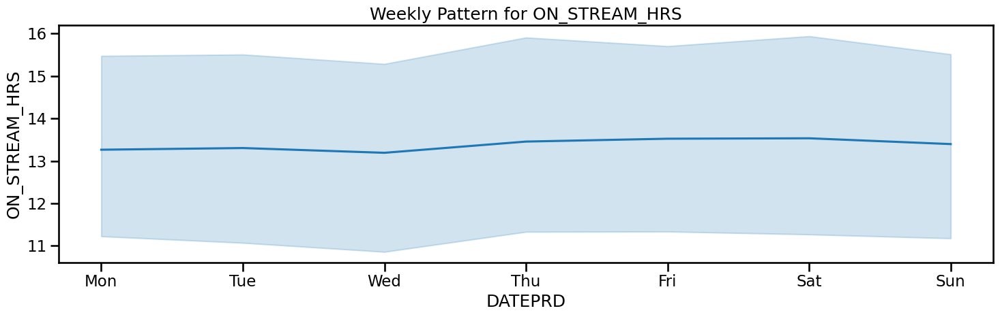

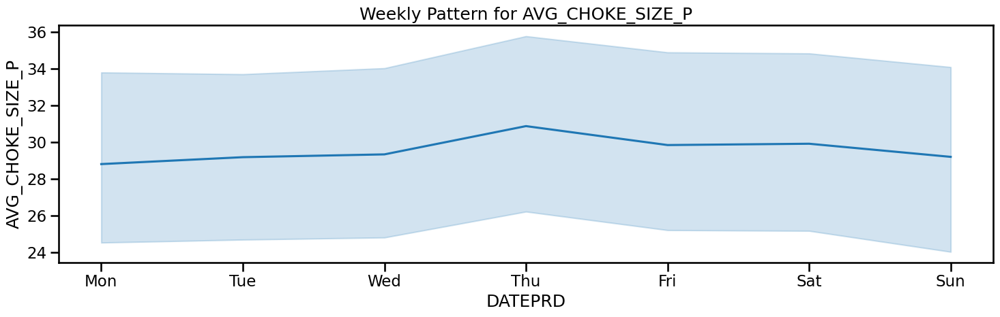

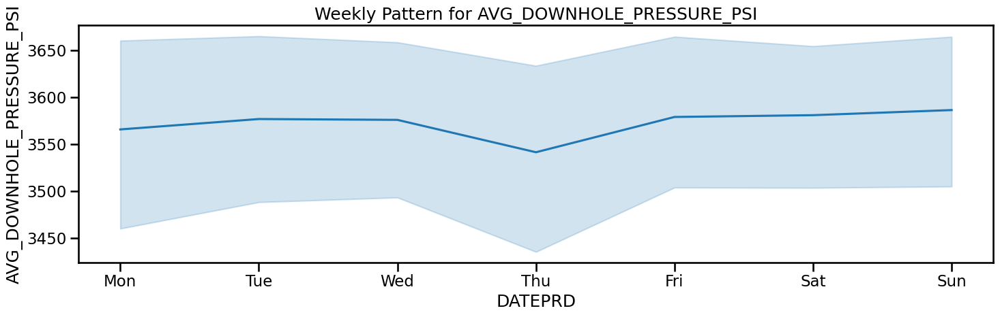

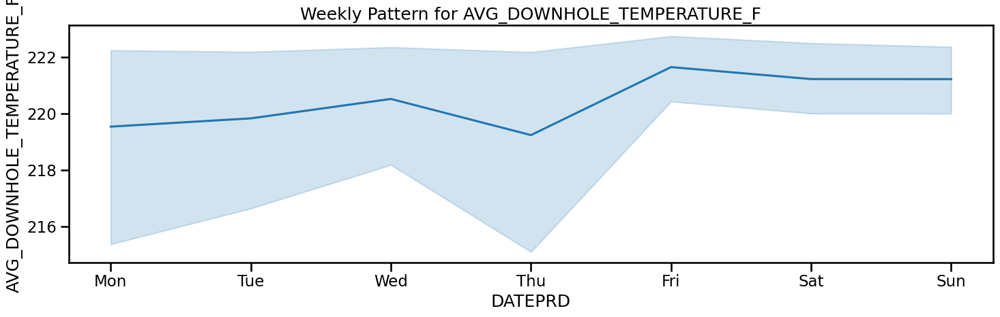

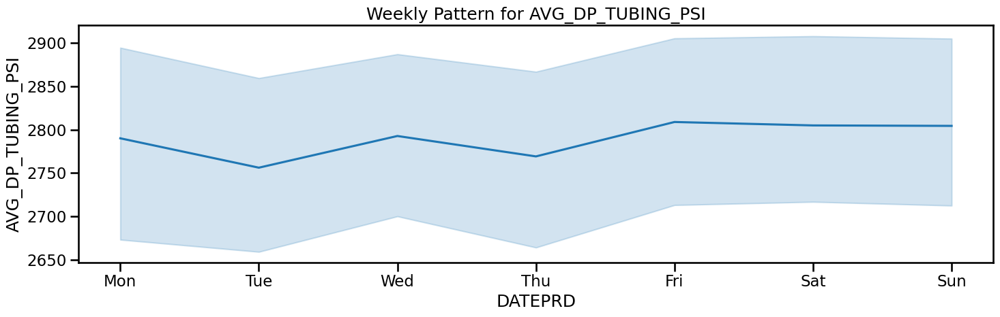

...

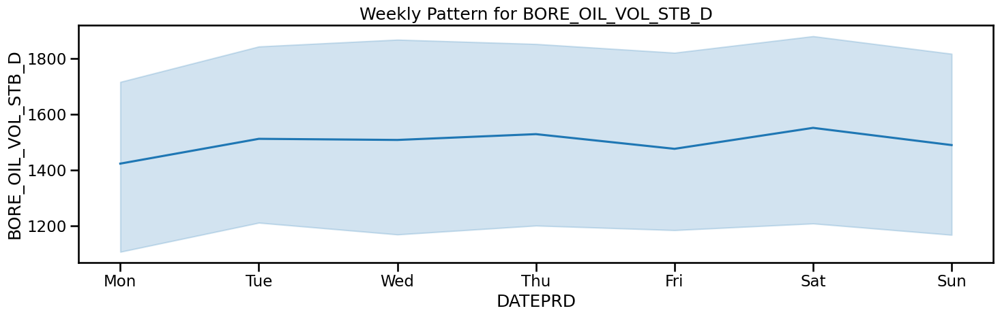

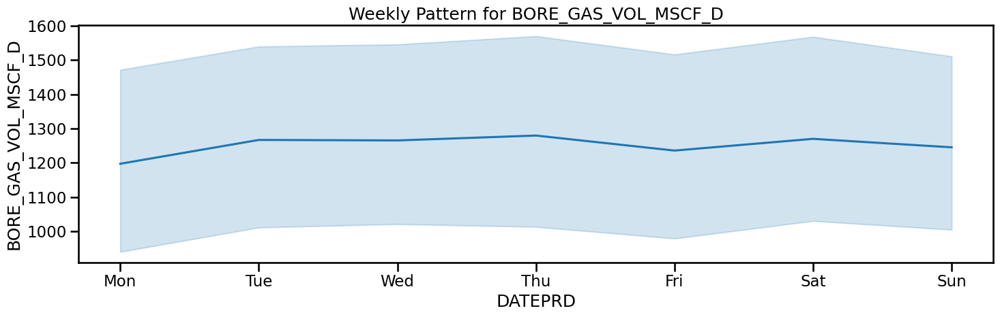

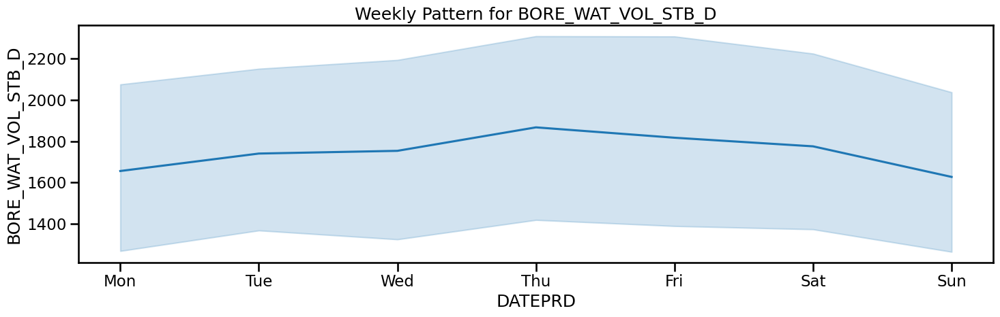

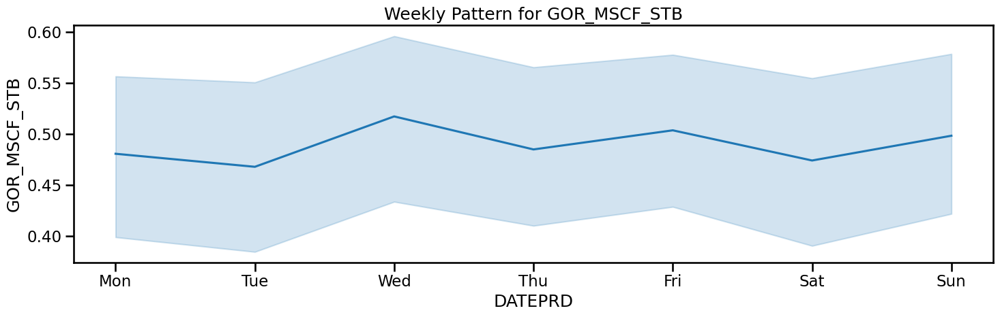

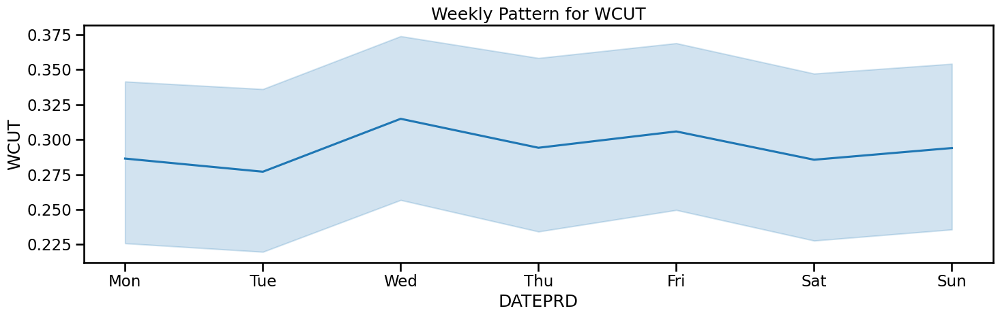

In [38]:
pd.plotting.register_matplotlib_converters()
with sns.plotting_context("talk"):

    for feat in df.columns:
    
        fig, ax = plt.subplots(figsize=[15, 5])
        
        sns.lineplot(x=df.index.dayofweek, y=df[feat], ax=ax)
        ax.set_xticks(range(7))
        ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax.set_title(f"Weekly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()  # Ensures each plot displays sequentially in your loop

I don't think there is a weekly seasonality

####  Month of the year seasonal pattern

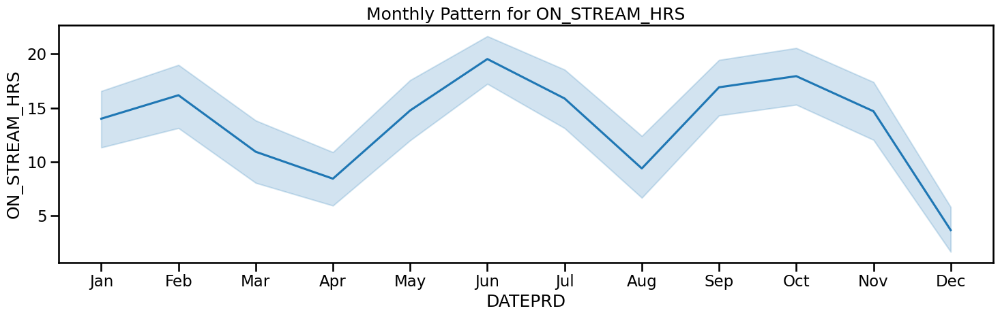

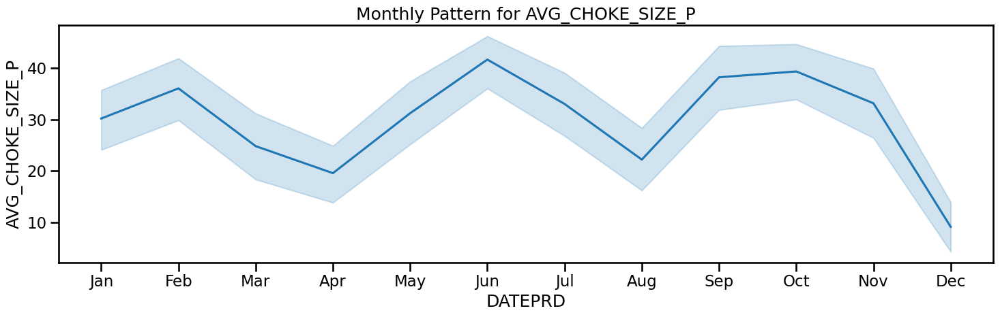

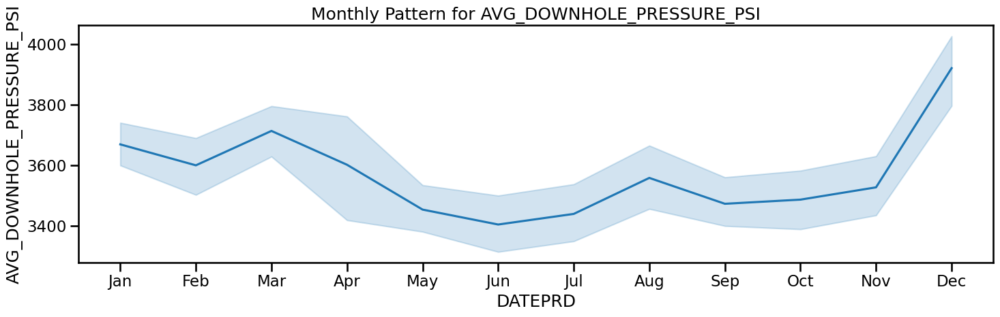

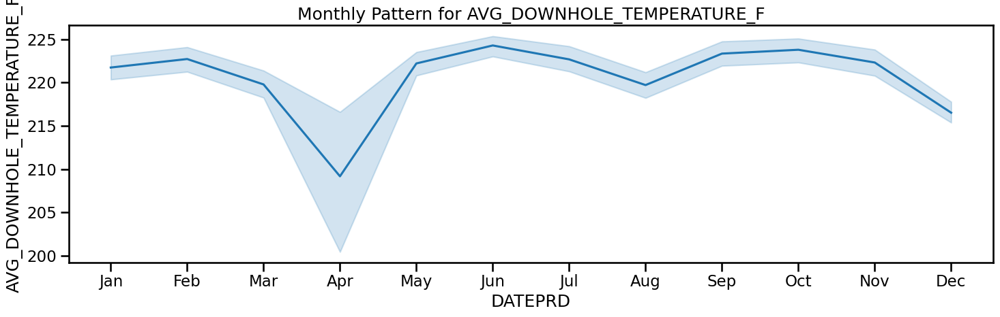

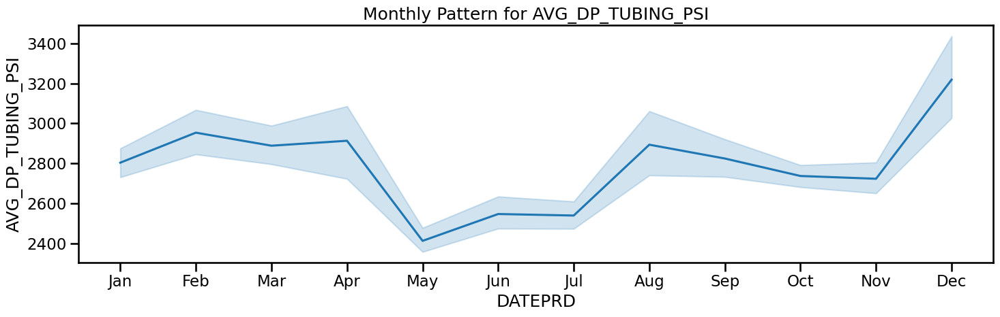

...

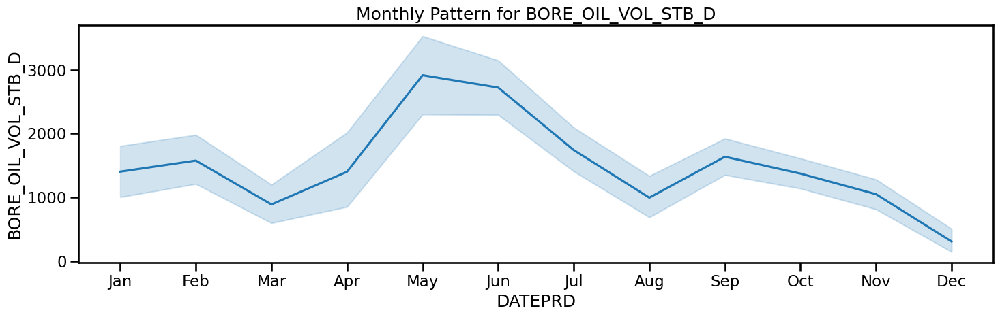

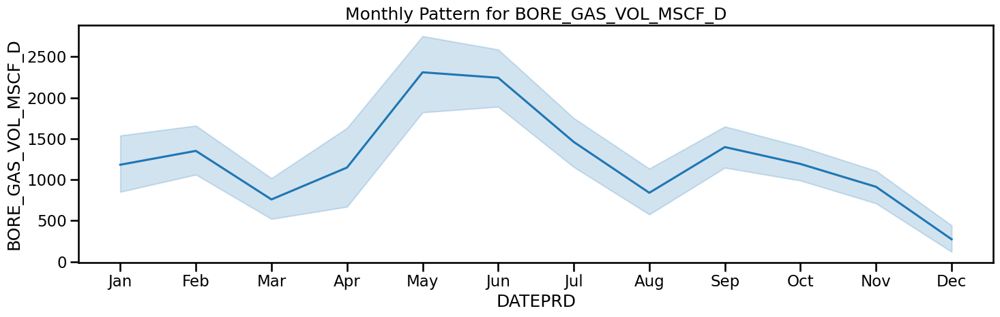

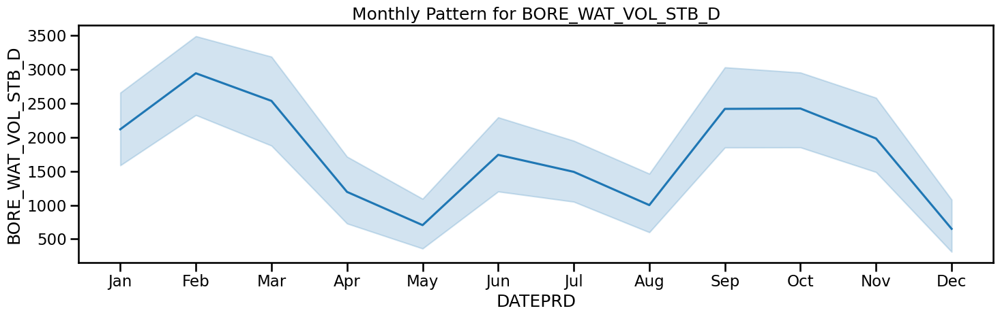

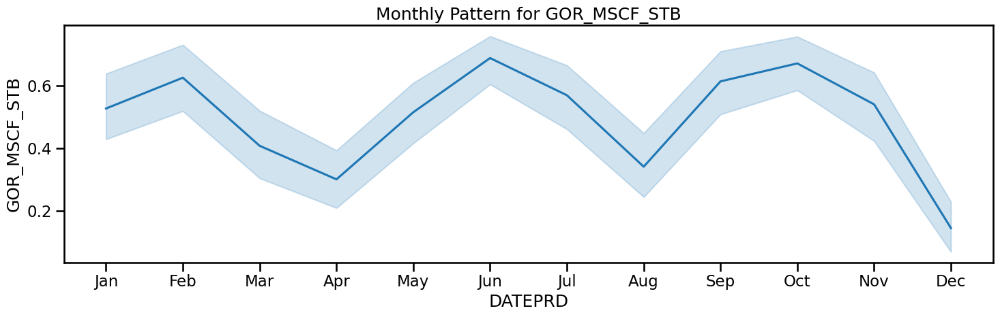

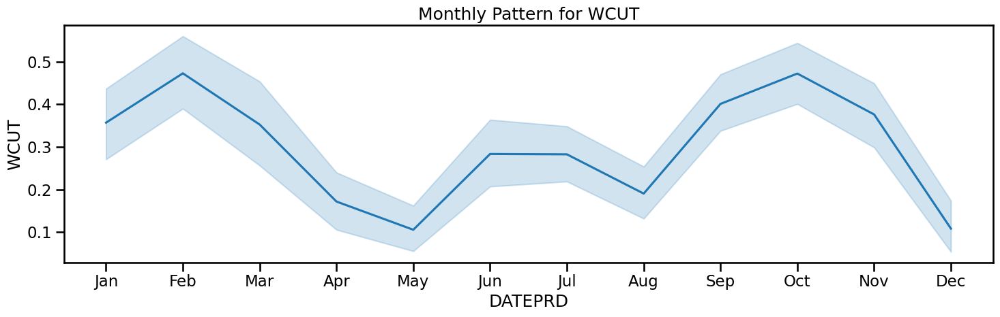

In [22]:
pd.plotting.register_matplotlib_converters()

# Using "talk" context for larger text sizing
with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Change x to df.index.month (values ranging from 1 to 12)
        sns.lineplot(x=df.index.month, y=df[feat], ax=ax)
        
        # 2. Update ticks for 12 months (1 through 12)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        
        # 3. Update the title to reflect the monthly trend
        ax.set_title(f"Monthly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()

There is a monthly seasonal pattern

#### Week of the year seasonal pattern

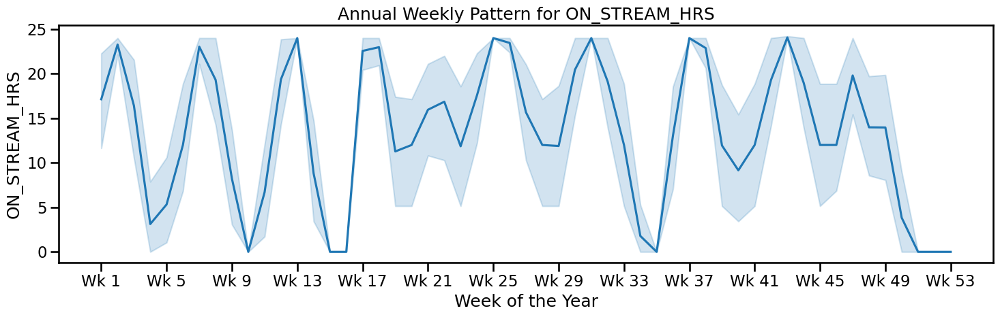

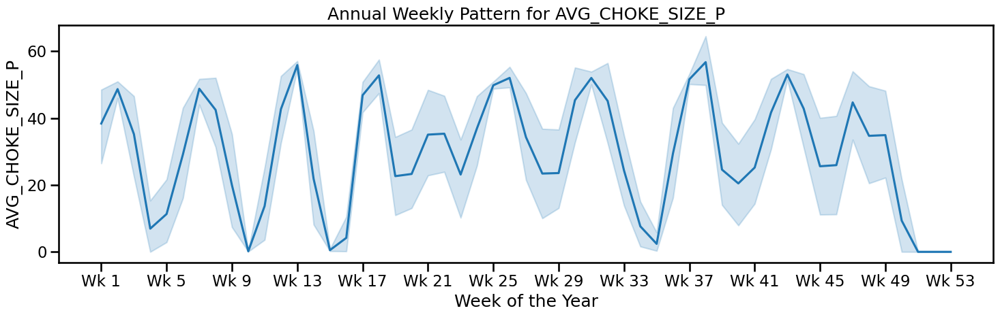

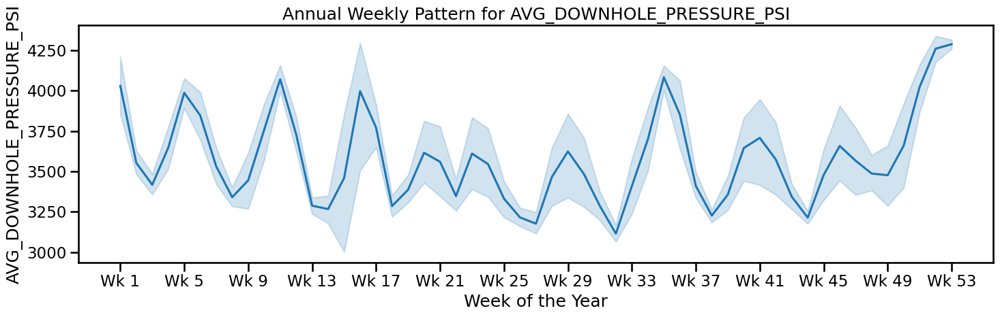

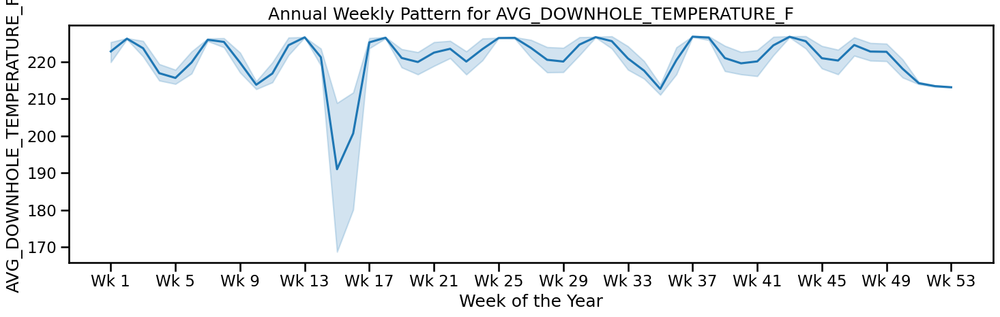

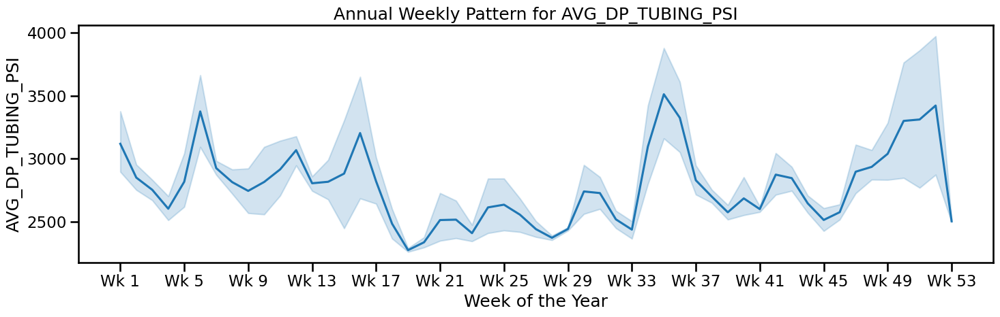

...

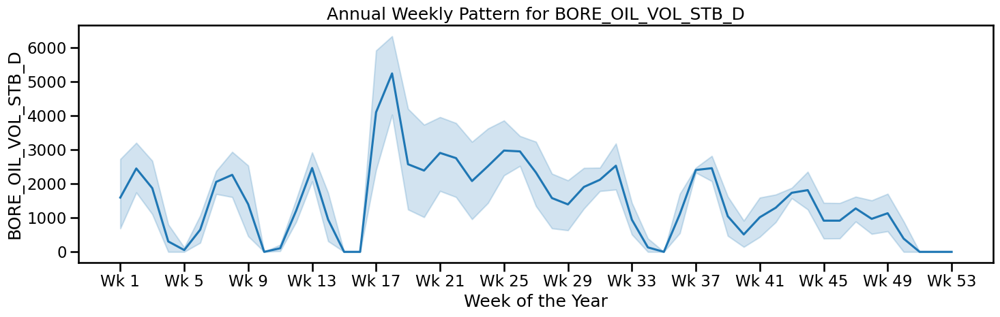

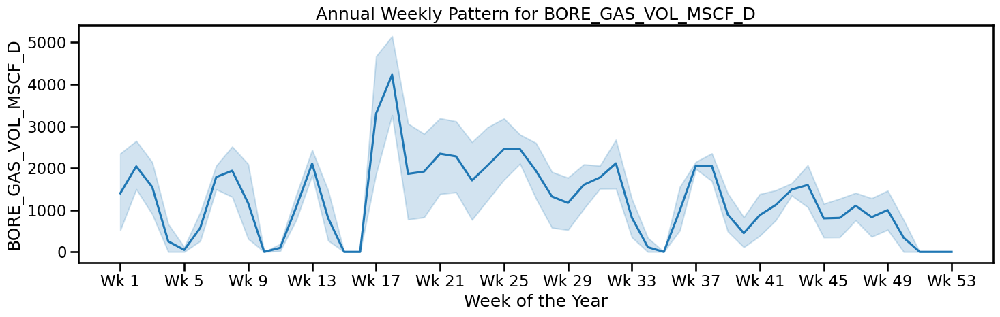

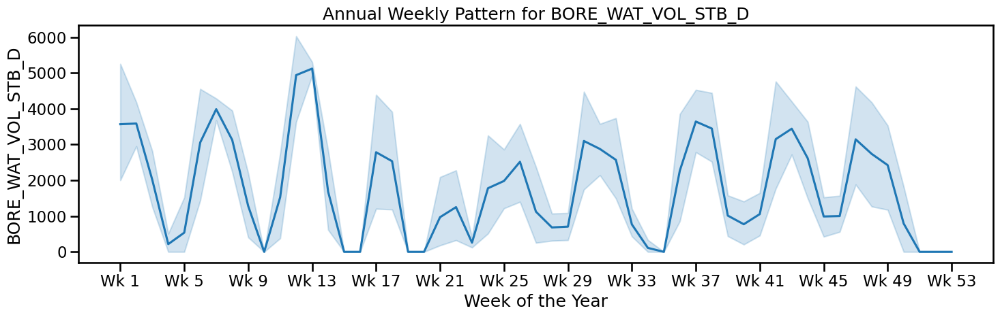

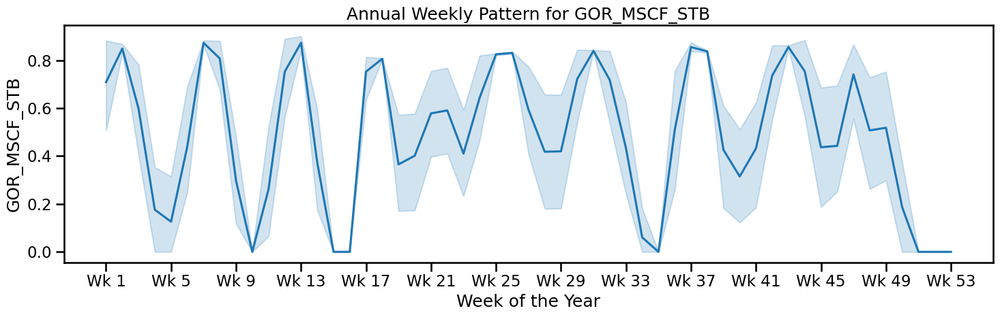

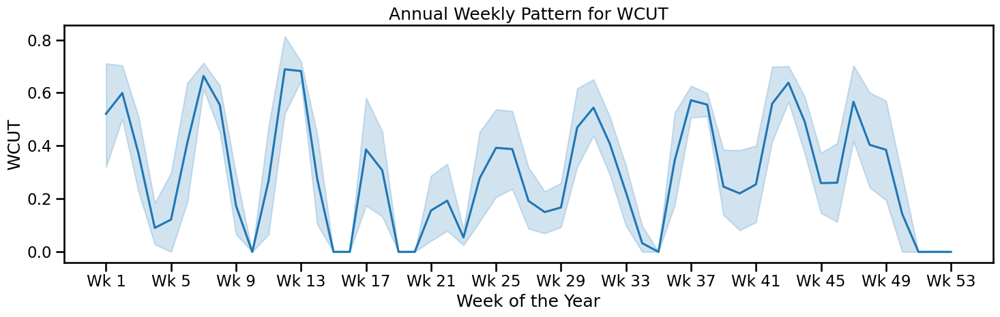

In [23]:
pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use .isocalendar().week to get week numbers (1 to 52/53)
        sns.lineplot(x=df.index.isocalendar().week, y=df[feat], ax=ax)
        
        # 2. Clean up x-axis: label every 4th week so it's readable
        week_ticks = list(range(1, 54, 4))
        ax.set_xticks(week_ticks)
        ax.set_xticklabels([f"Wk {w}" for w in week_ticks])
        
        ax.set_title(f"Annual Weekly Pattern for {feat}")
        ax.set_xlabel("Week of the Year")
        
        plt.tight_layout()
        plt.show()

There is also a weekly seasonal pattern for the year

#### Quater of the year seasonal pattern

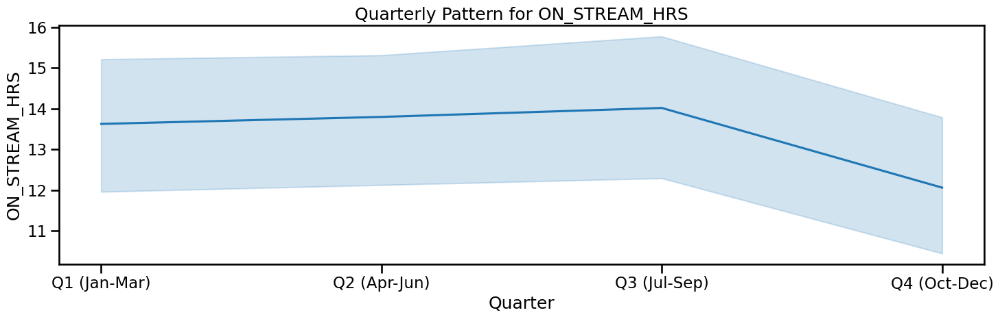

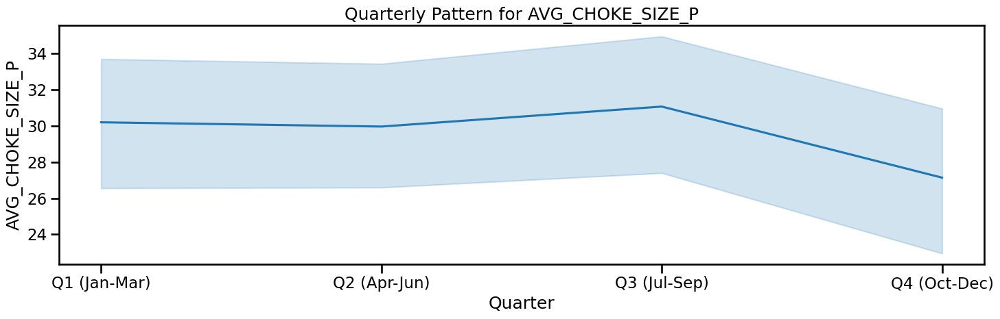

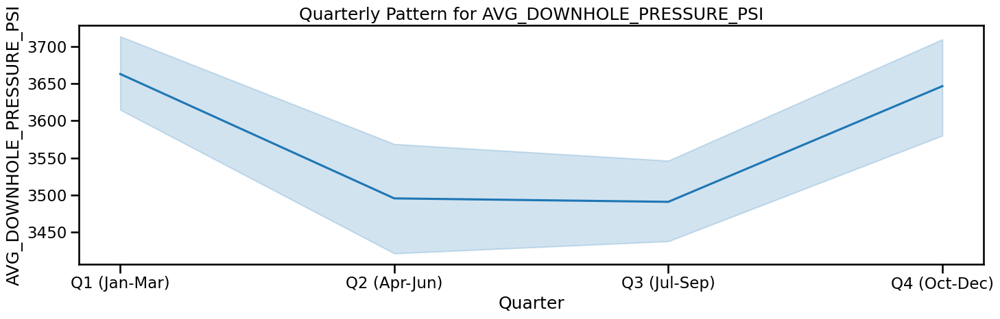

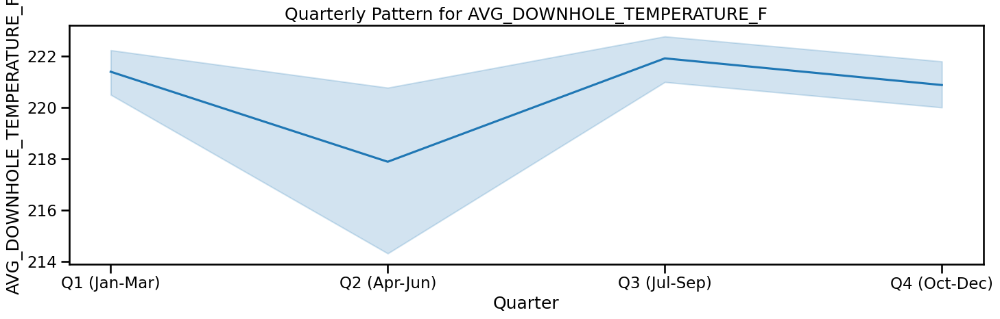

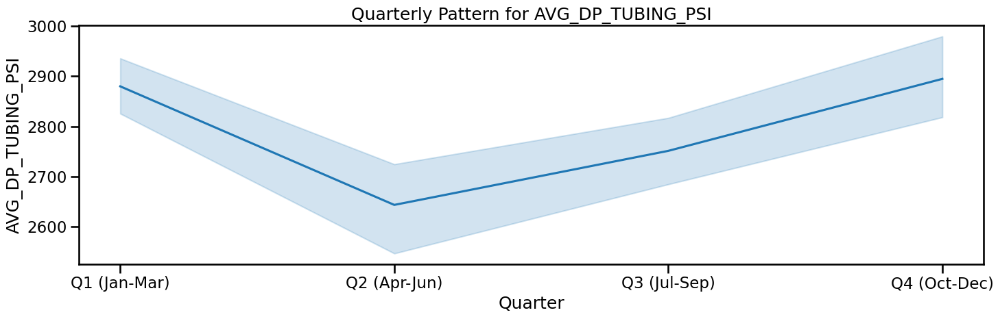

...

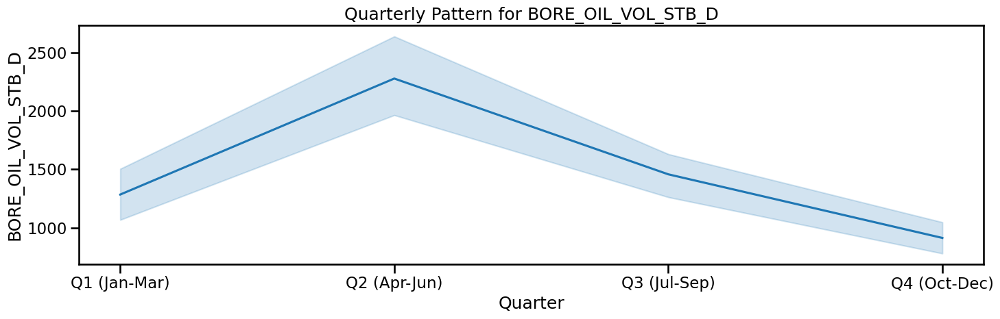

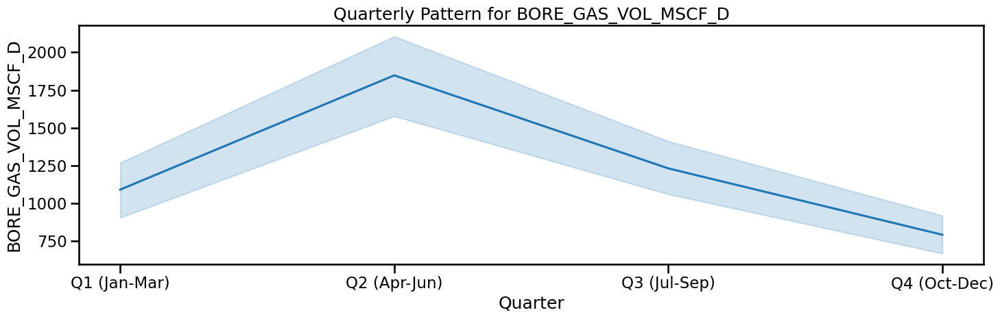

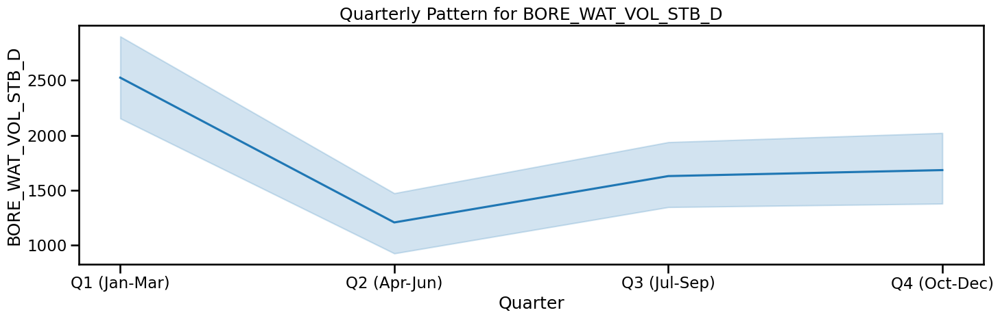

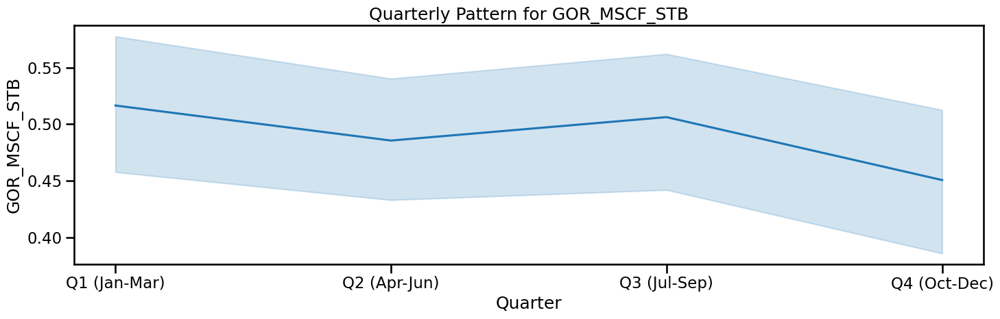

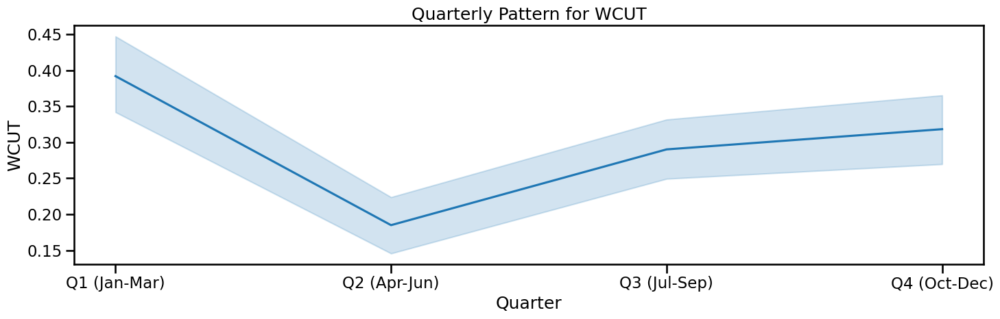

In [24]:

pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use df.index.quarter to group data into 4 chunks
        sns.lineplot(x=df.index.quarter, y=df[feat], ax=ax)
        
        # 2. Set explicit ticks for the 4 quarters
        ax.set_xticks([1, 2, 3, 4])
        ax.set_xticklabels(['Q1 (Jan-Mar)', 'Q2 (Apr-Jun)', 'Q3 (Jul-Sep)', 'Q4 (Oct-Dec)'])
        
        ax.set_title(f"Quarterly Pattern for {feat}")
        ax.set_xlabel("Quarter")
        
        plt.tight_layout()
        plt.show()

A little but not as much

### 2.2 ACF & PACF To pick lags

I am going to use this to plot the ACF anad PACF and manually pick the lags. and force keep these lags in the lasso selector

In [25]:
df_acf_pacf=df.copy()

In [26]:
df_acf_pacf

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0


#### ACF & PACF for oil

##### without removing tend or seasonality

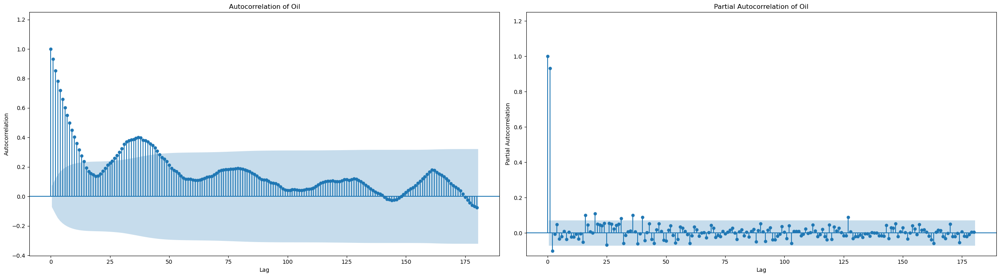

In [27]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Oil")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Oil")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

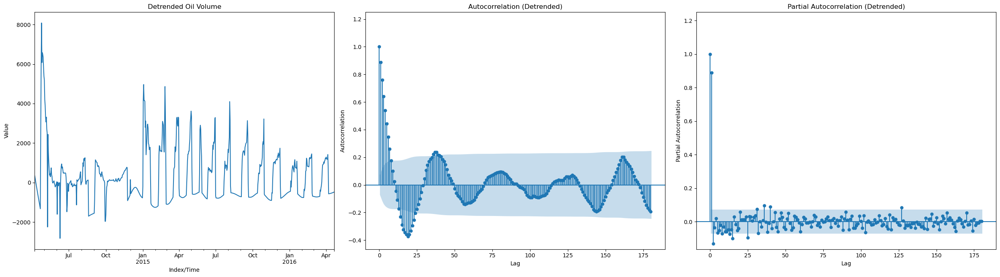

In [28]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_OIL_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_oil"] = res[:, 1]
df_acf_pacf["y_oil_detrend"] = df_acf_pacf["BORE_OIL_VOL_STB_D"] - df_acf_pacf["lowess_oil"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_oil_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Oil Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_oil_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_oil_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason

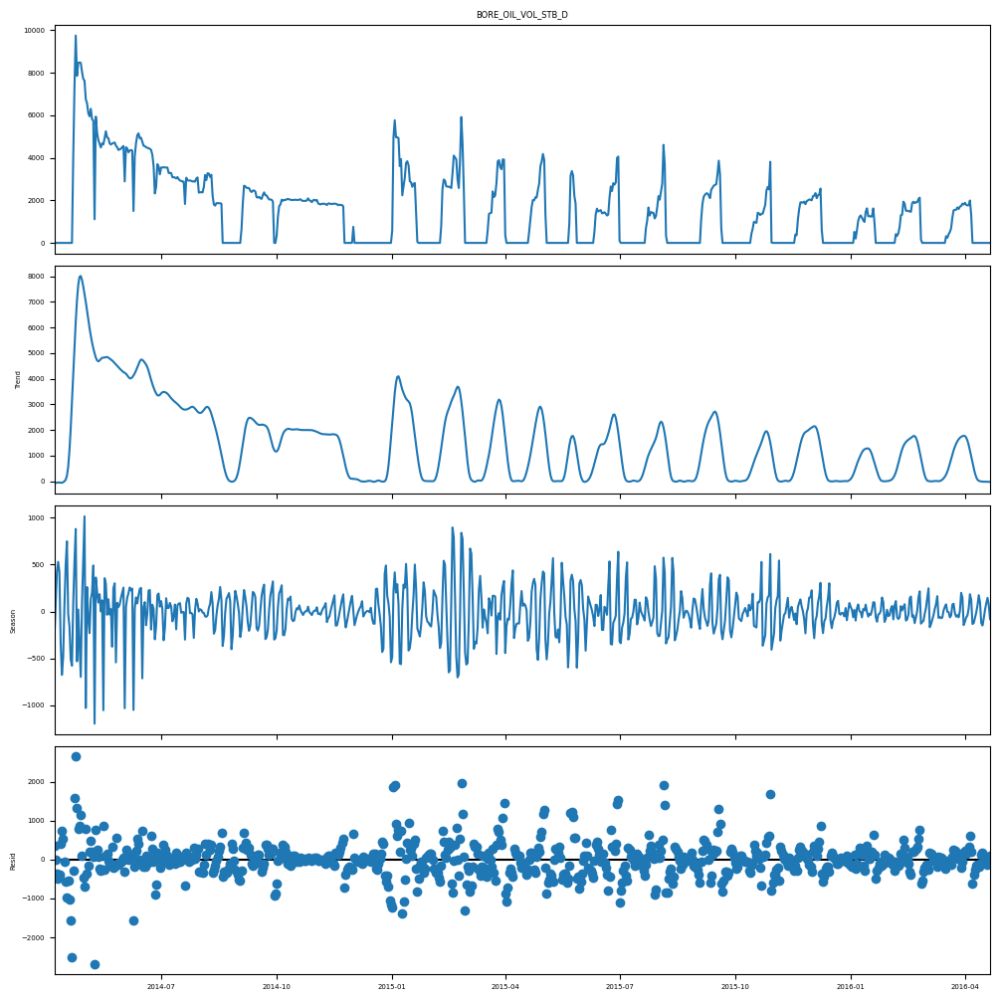

In [29]:
# Break the timeseries into trend, seasonality, and residual components
res_oil = STL(df_acf_pacf["BORE_OIL_VOL_STB_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_oil.plot();

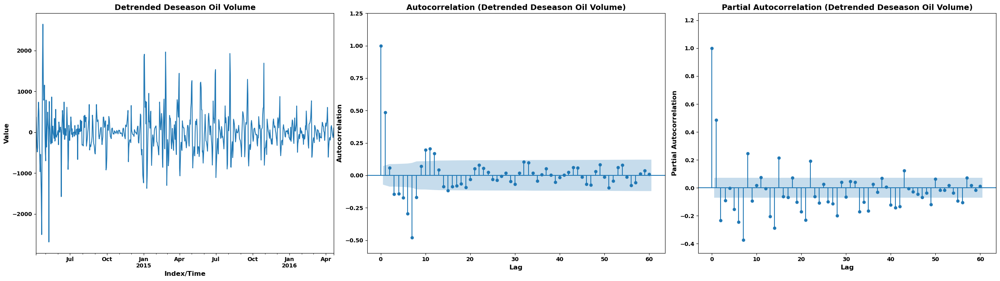

In [30]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Oil Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_oil.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_oil.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season, i should use a Lag of 1,2,6,7

#### ACF & PACF for gas

##### without removing tend or seasonality

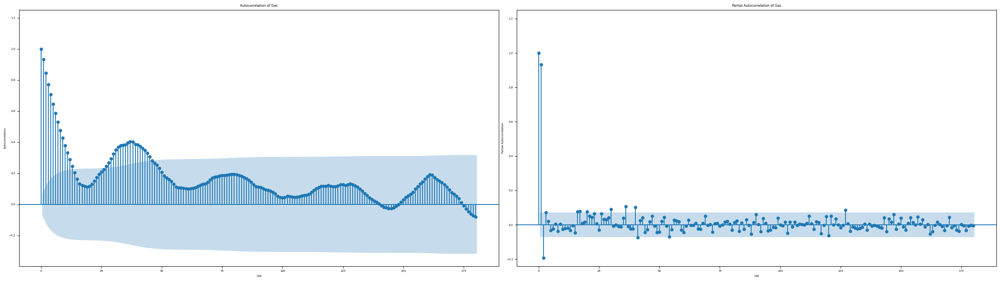

In [31]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Gas")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Gas")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

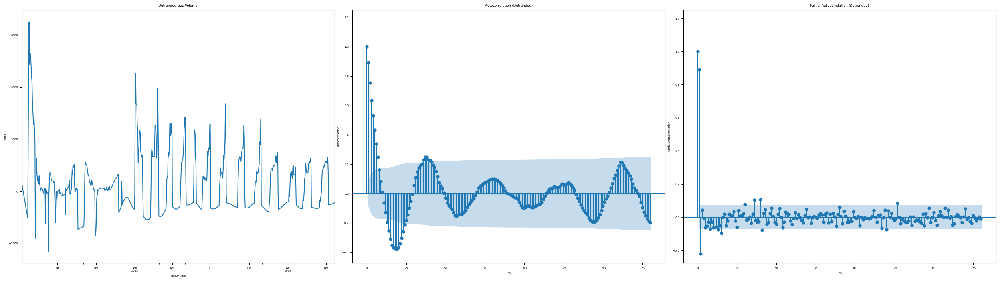

In [32]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_GAS_VOL_MSCF_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_gas"] = res[:, 1]
df_acf_pacf["y_gas_detrend"] = df_acf_pacf["BORE_GAS_VOL_MSCF_D"] - df_acf_pacf["lowess_gas"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_gas_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Gas Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_gas_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_gas_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason

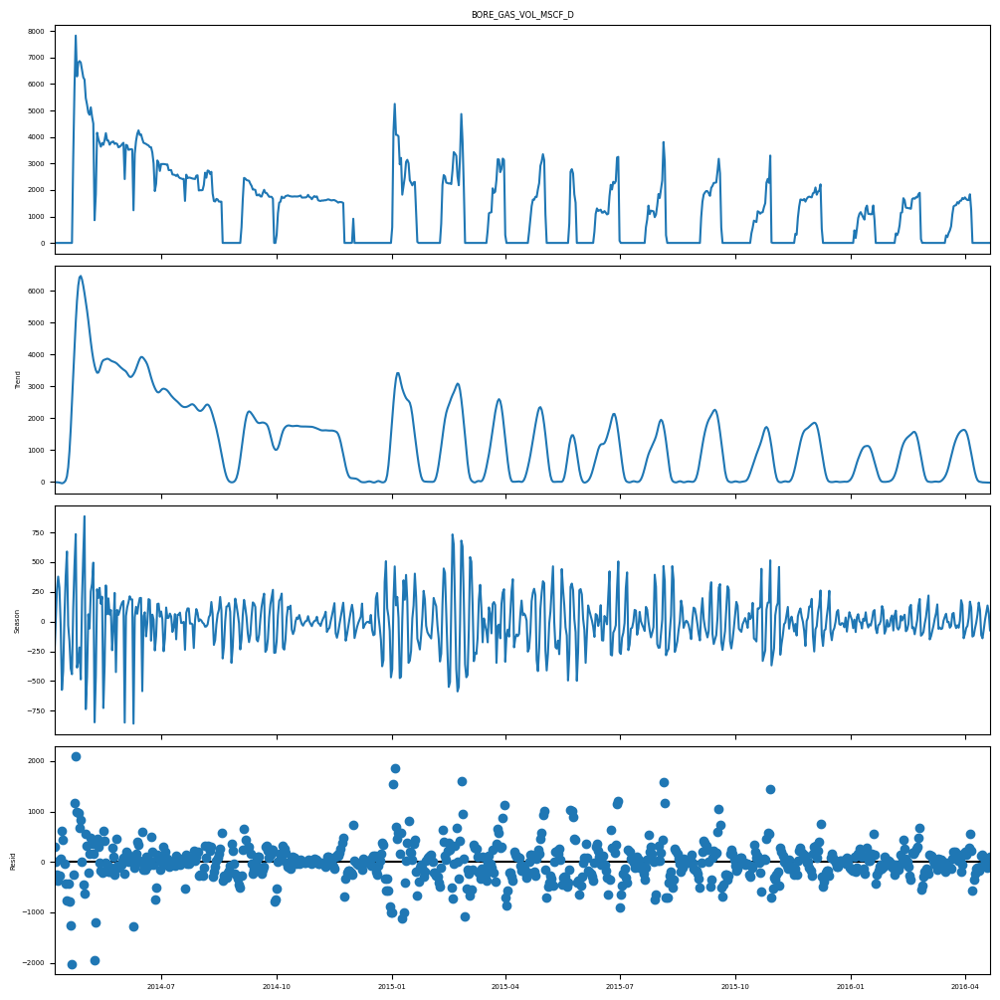

In [33]:
# Break the timeseries into trend, seasonality, and residual components
res_gas = STL(df_acf_pacf["BORE_GAS_VOL_MSCF_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_gas.plot();

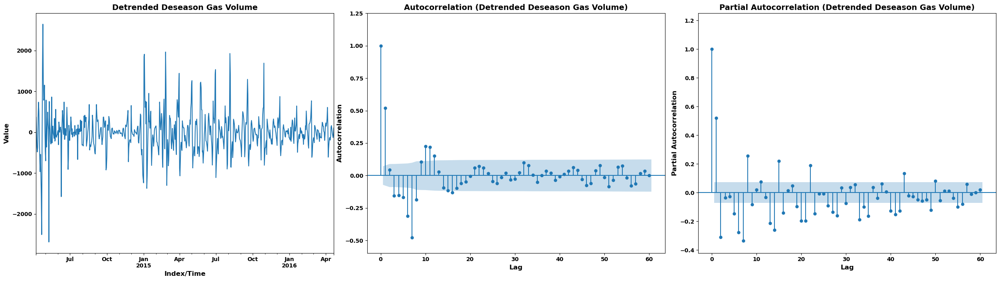

In [34]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Gas Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_gas.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_gas.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season, i should use a Lag of 1,2,6,7

#### ACF & PACF for water

##### without removing tend or seasonality

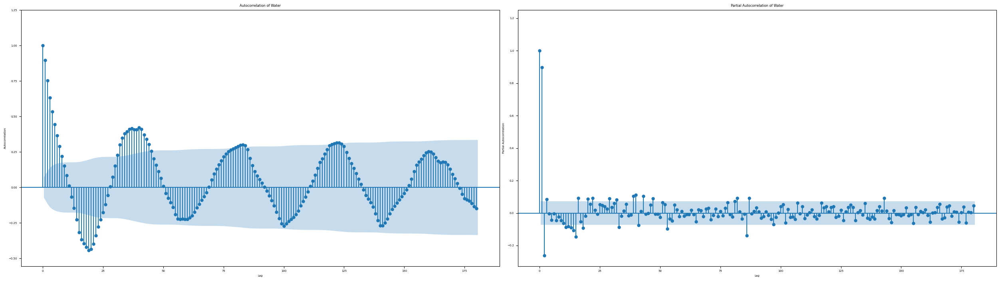

In [35]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Water")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Water")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

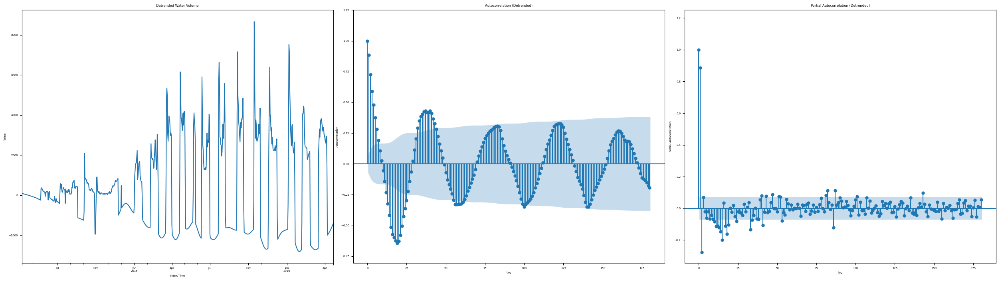

In [36]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_WAT_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_water"] = res[:, 1]
df_acf_pacf["y_water_detrend"] = df_acf_pacf["BORE_WAT_VOL_STB_D"] - df_acf_pacf["lowess_water"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_water_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Water Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_water_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_water_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason

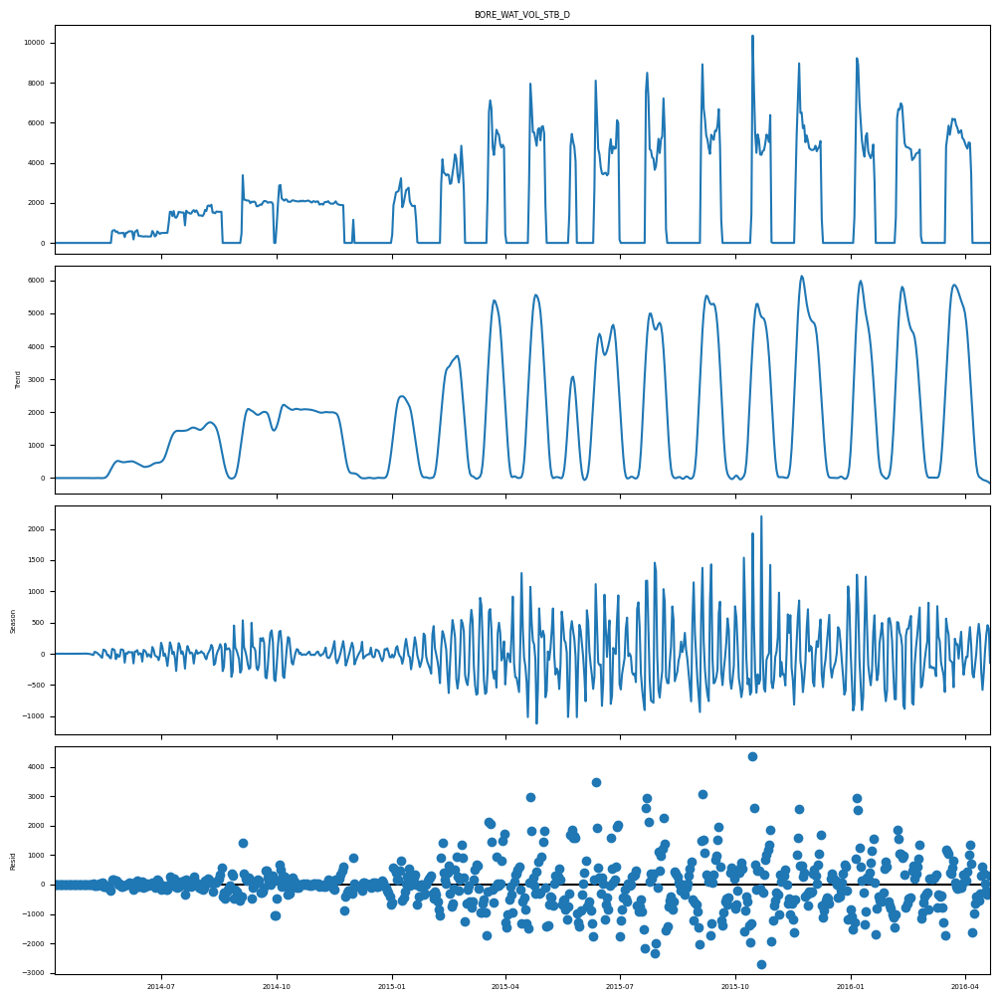

In [37]:
# Break the timeseries into trend, seasonality, and residual components
res_water = STL(df_acf_pacf["BORE_WAT_VOL_STB_D"]).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_water.plot();

In [38]:
# Looking at this there is definitely an issue with the variance

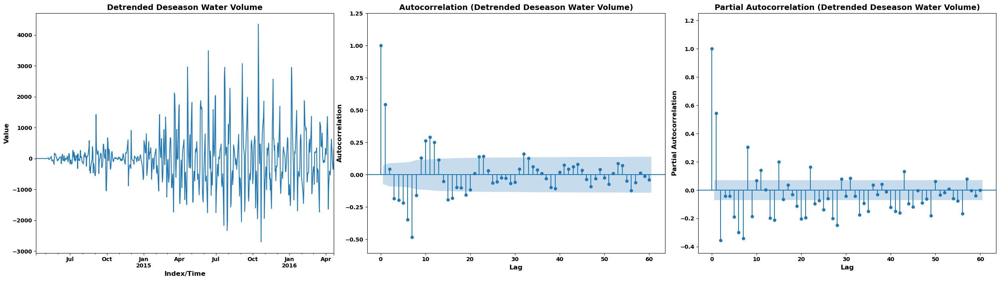

In [39]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_water.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Water Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_water.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_water.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

Looking at all the plots, there is an issue with the variance. I might stabalize the variance in another notebook. Also I am only going to use water lag 1 and 2

### 2.3 Cross Correlation plot

I am going to use this to plot  manually pick the lags. and force keep these lags in the lasso selector

In [40]:
df_ccf=df.copy()

In [41]:
stl_results = {}

for col in df_ccf:
    # Store the result in the dictionary using a dynamic key
    stl_results[f"res_{col}"] = STL(df_ccf[col]).fit()

#### CCF for oil

In [42]:
# target
res_oil = STL(df_ccf["BORE_OIL_VOL_STB_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


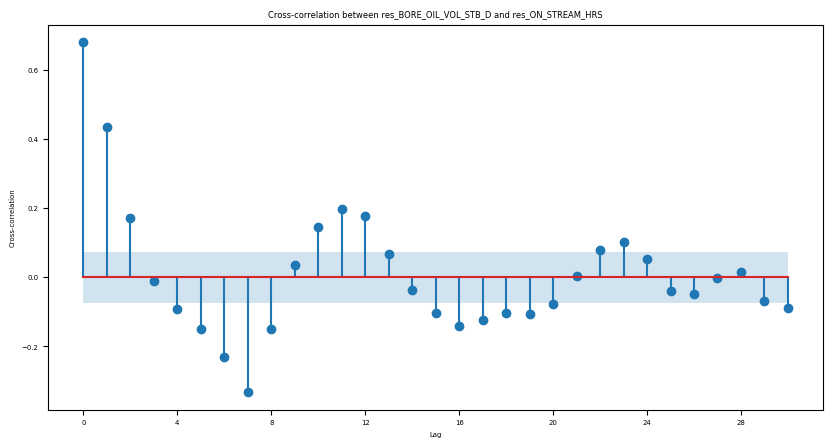

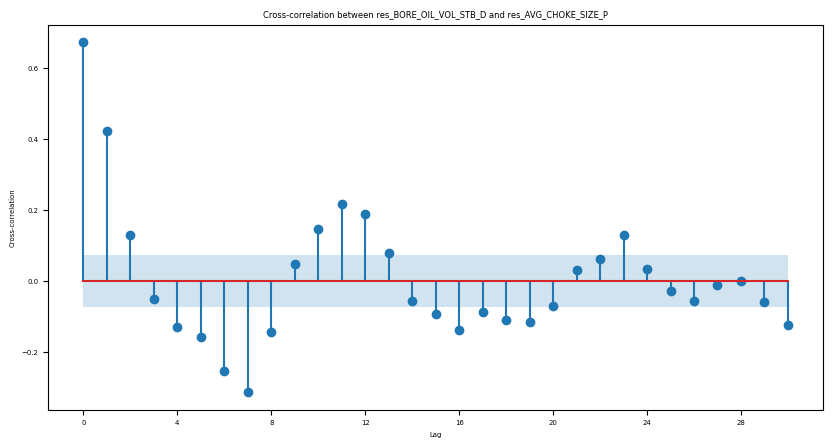

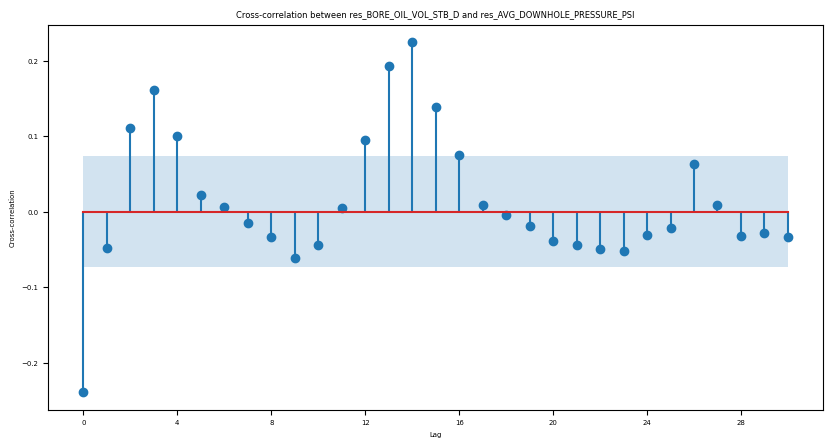

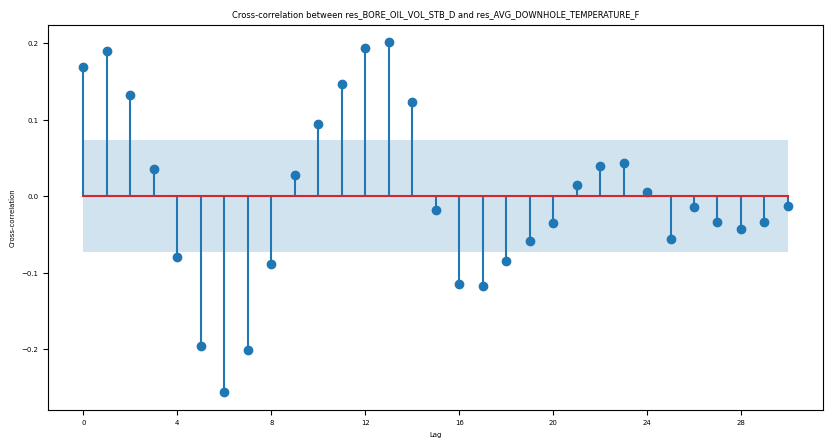

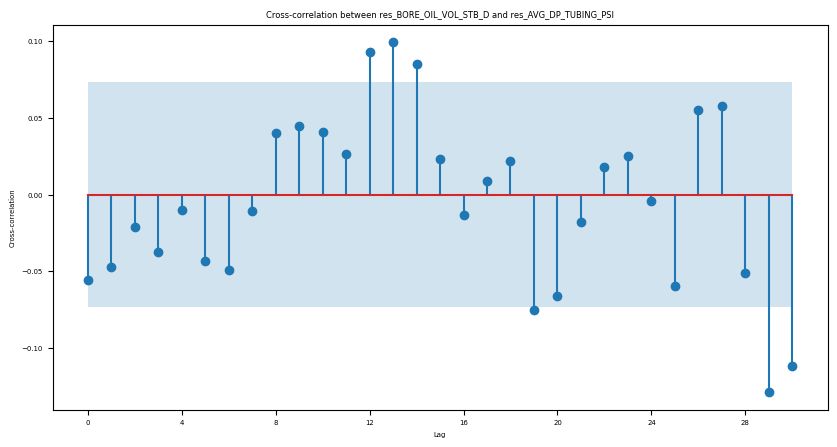

...

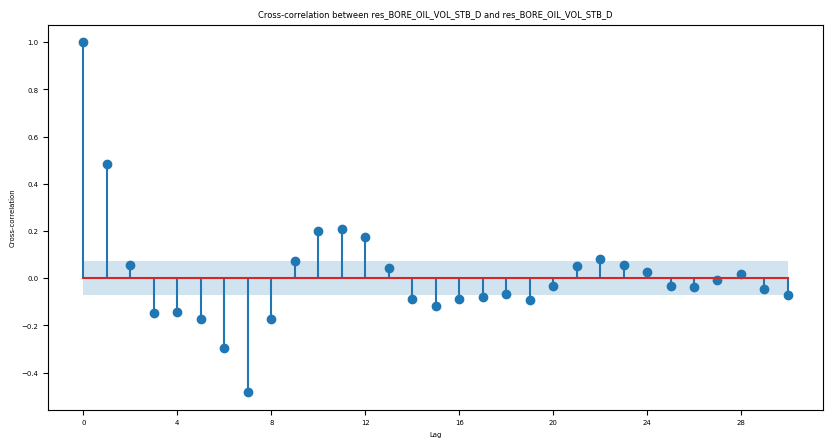

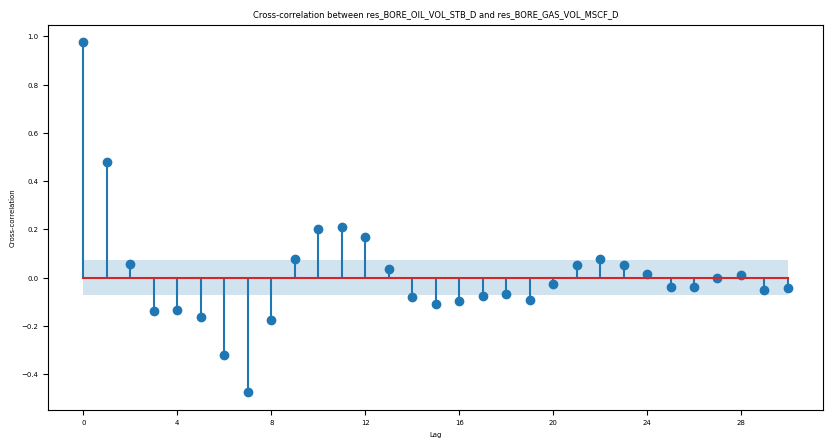

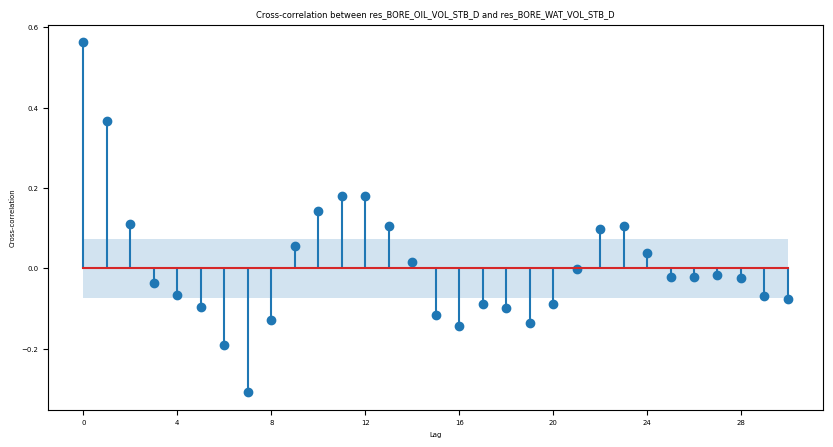

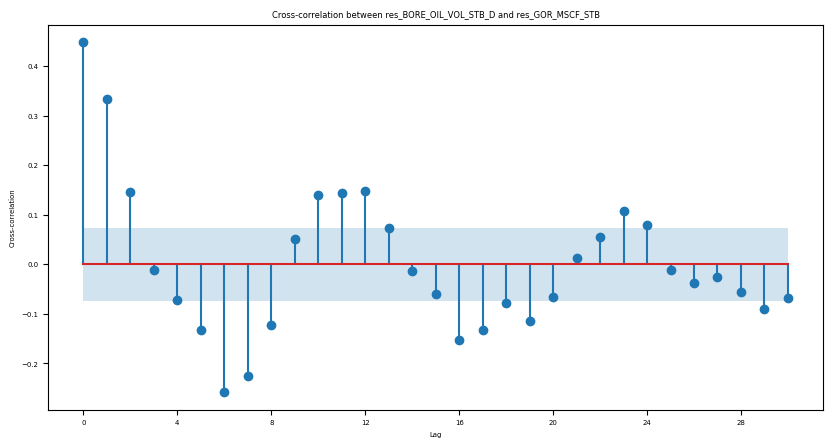

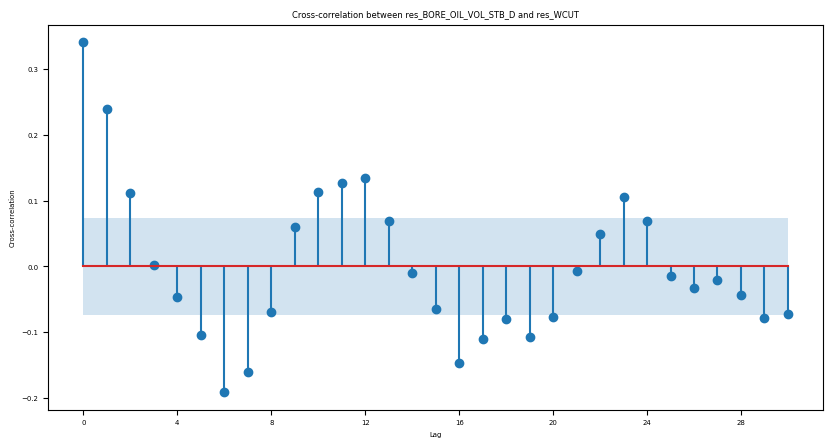

In [43]:
for key, res in stl_results.items():
    print(f"Analyzing components for: {key}")
    ax = plot_ccf(stl_results["res_BORE_OIL_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
    ax.set_title(f"Cross-correlation between res_BORE_OIL_VOL_STB_D and {key}")
    ax.set_ylabel("Cross-correlation")
    ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
on_stream: 0,1
avg choke, 0,1
avg wht_P: 0,1
bore_oil_vol: 1
gas:1


#### CCF for gas

In [44]:
# target
res_gas = STL(df_ccf["BORE_GAS_VOL_MSCF_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


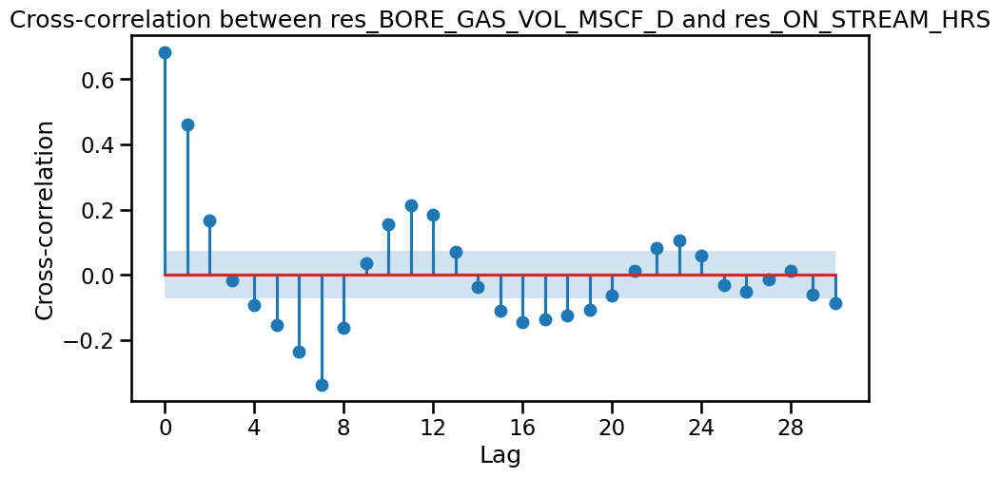

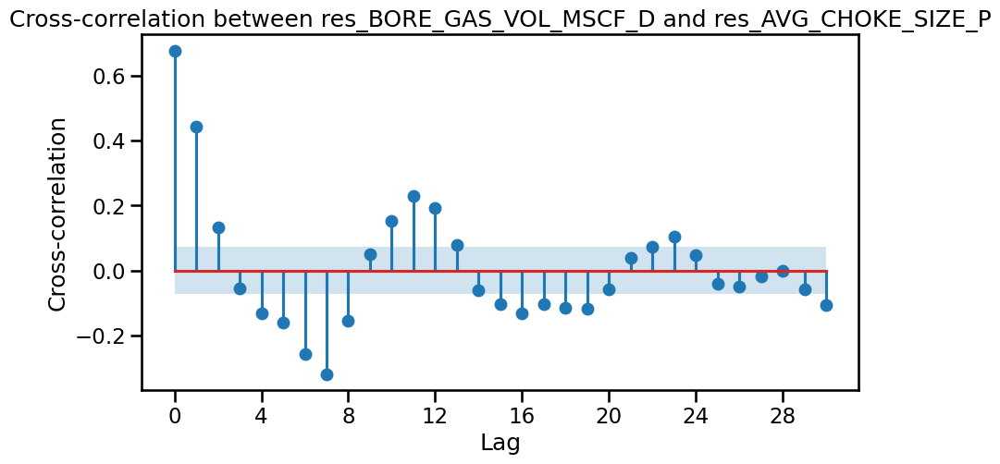

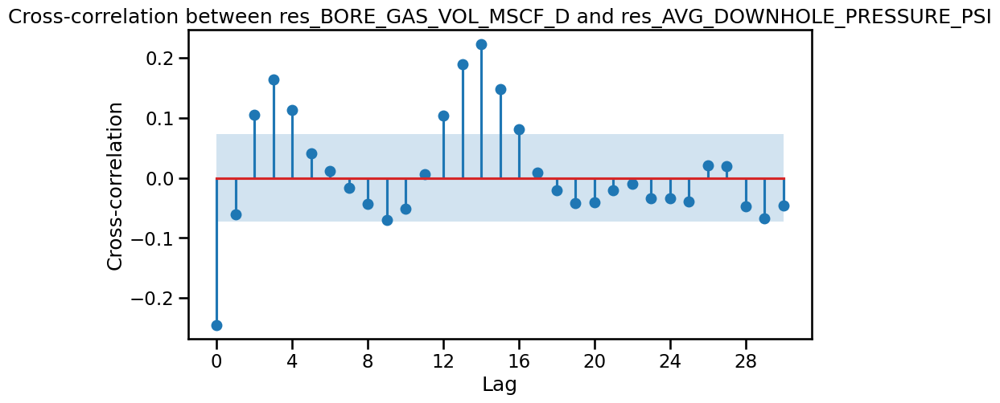

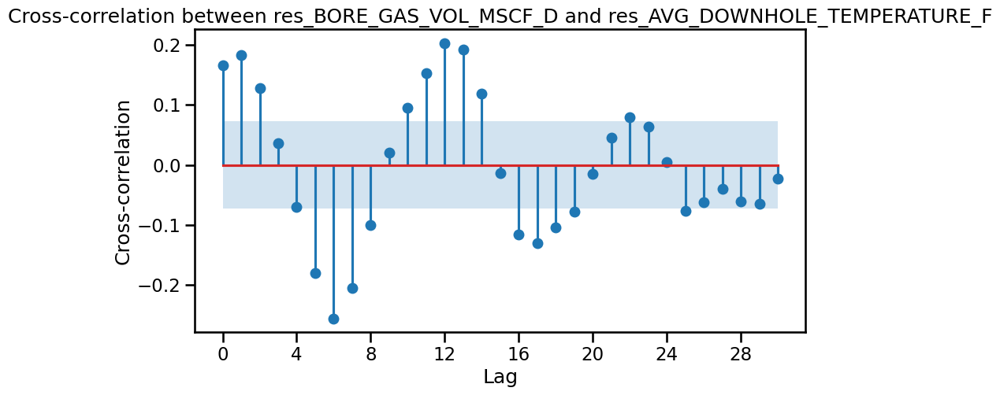

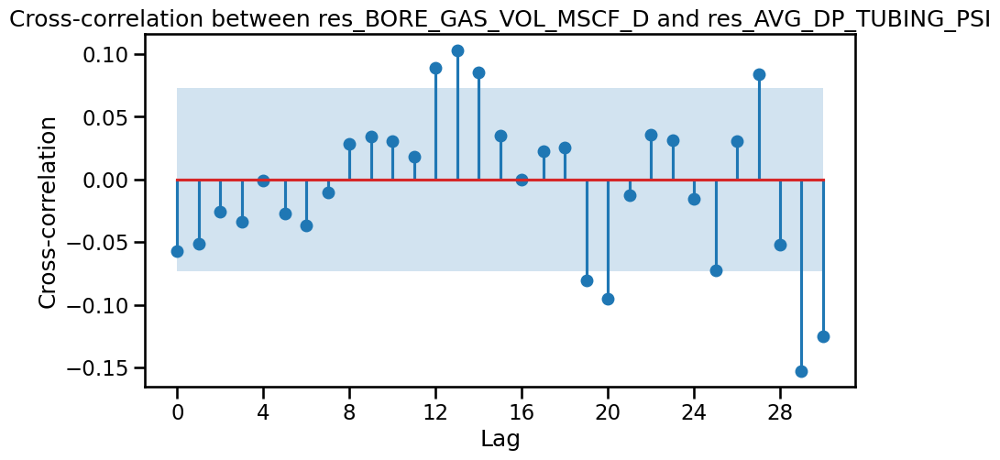

...

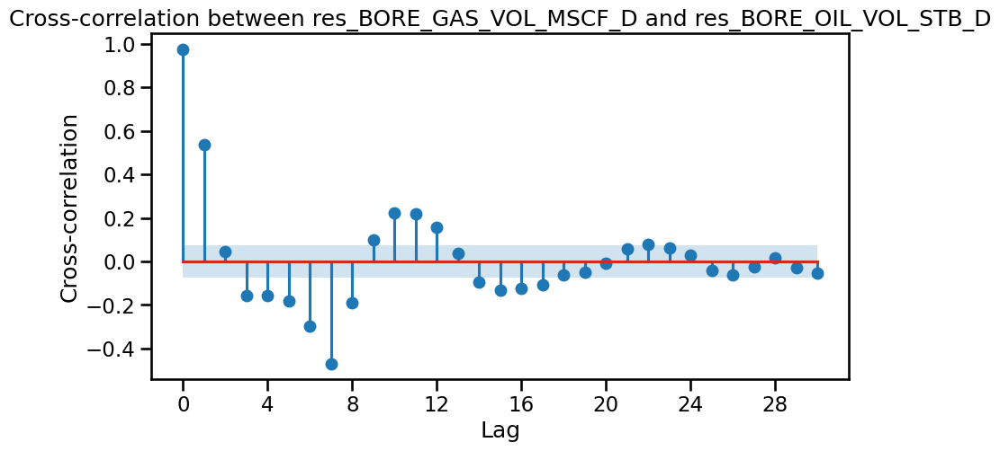

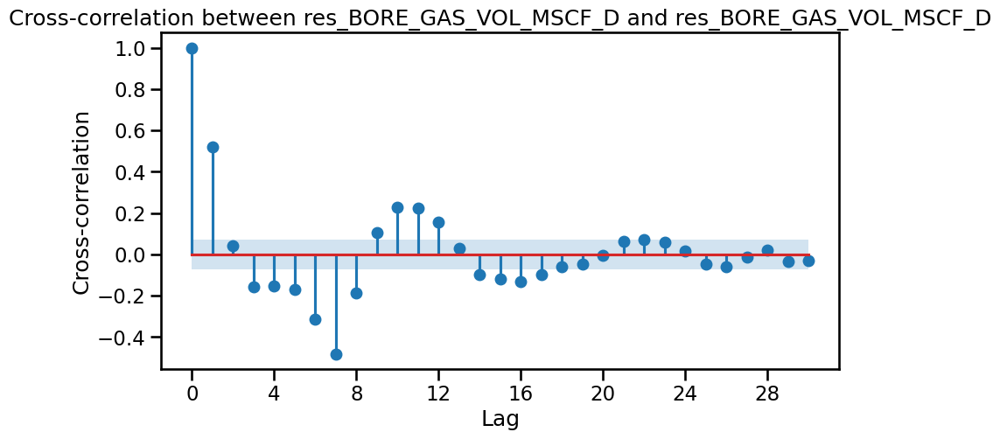

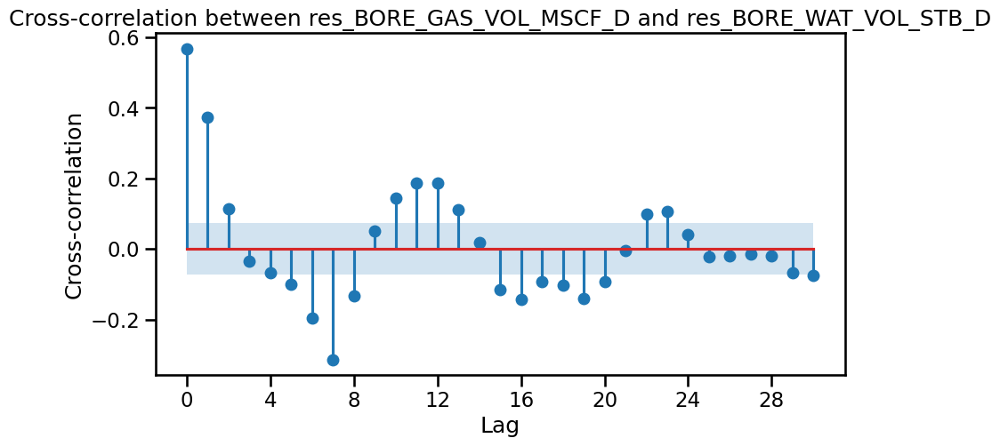

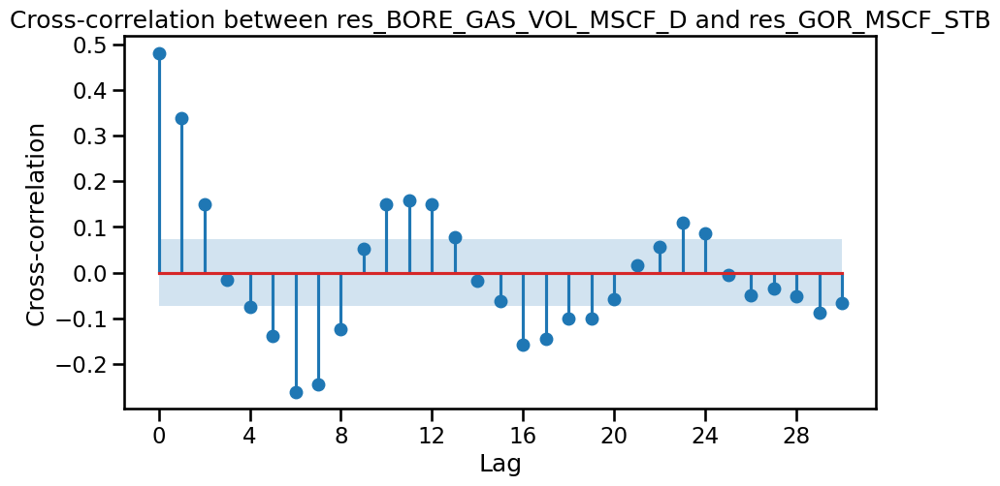

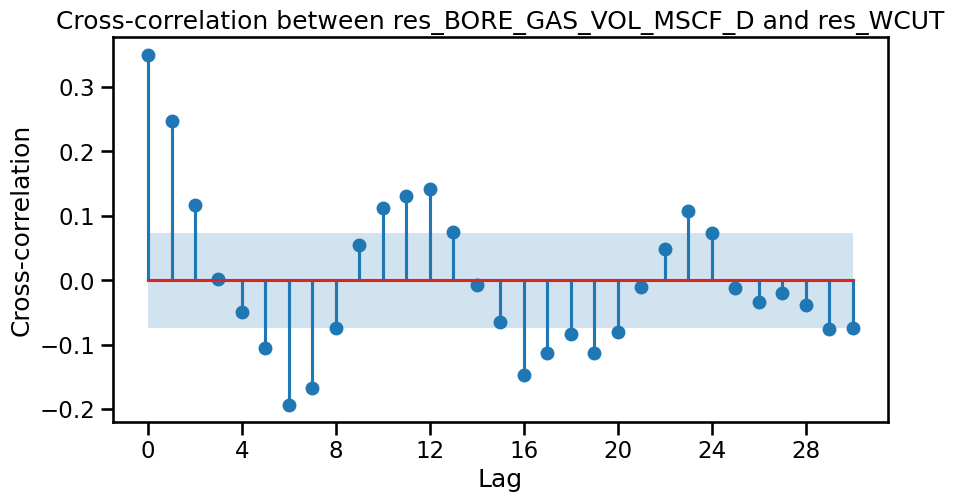

In [45]:
with sns.plotting_context("talk"):
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_GAS_VOL_MSCF_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_GAS_VOL_MSCF_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot 
on_stream: 0,1 
avg choke, 0,1 
avg wht_P: 0,1 
BORE_GAS_VOL_MSCF_D: 1 
oil:1

#### CCF for water

In [46]:
# target
res_water = STL(df_ccf["BORE_WAT_VOL_STB_D"]).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


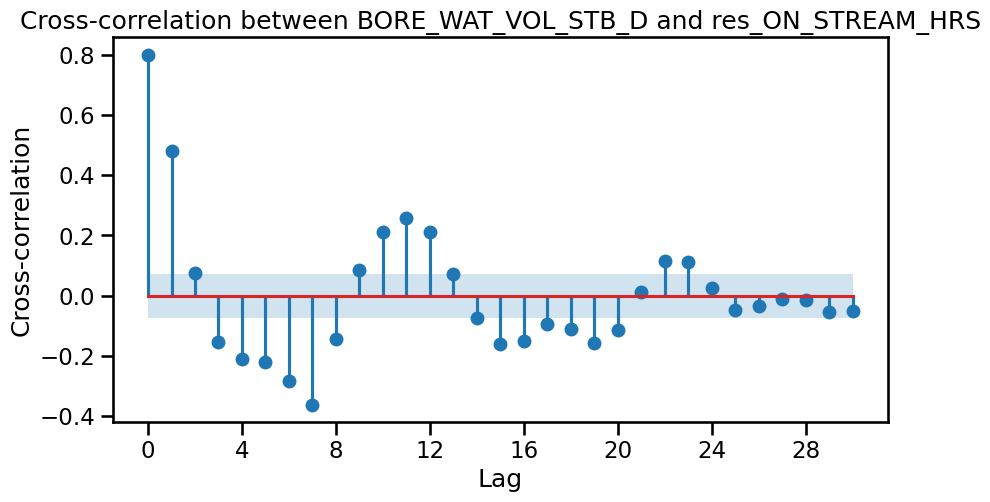

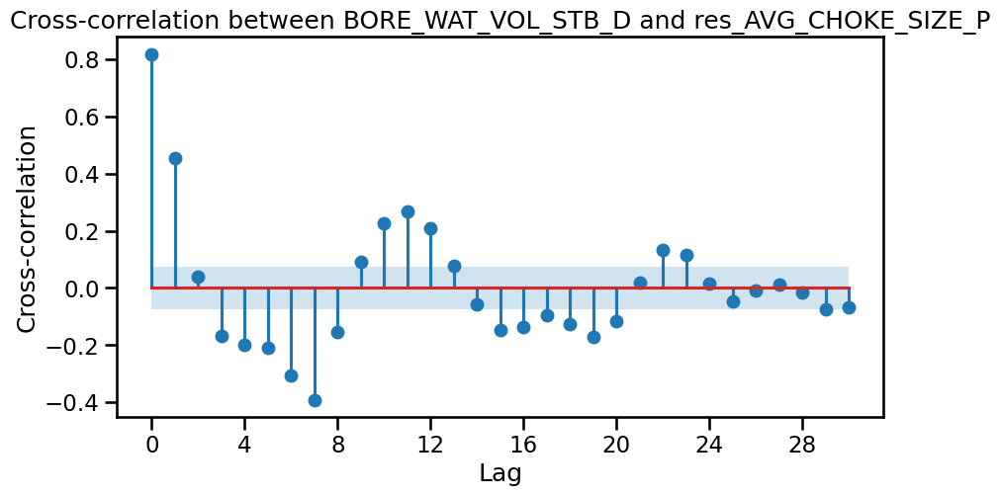

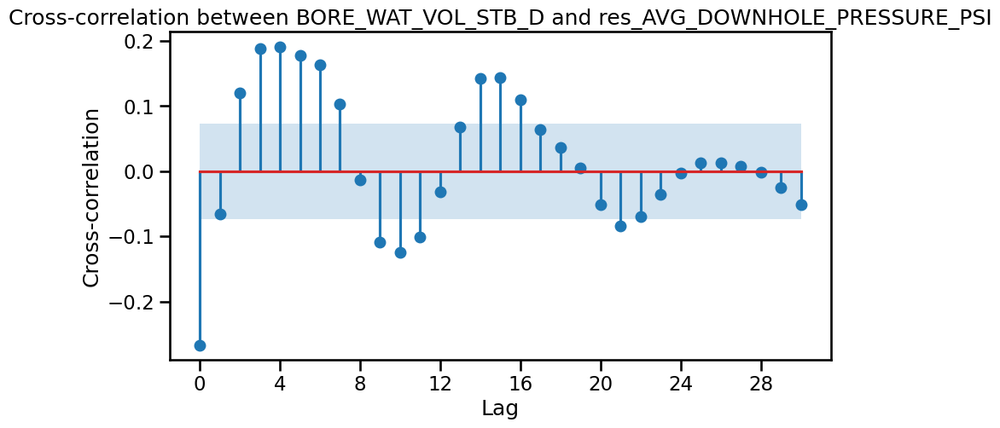

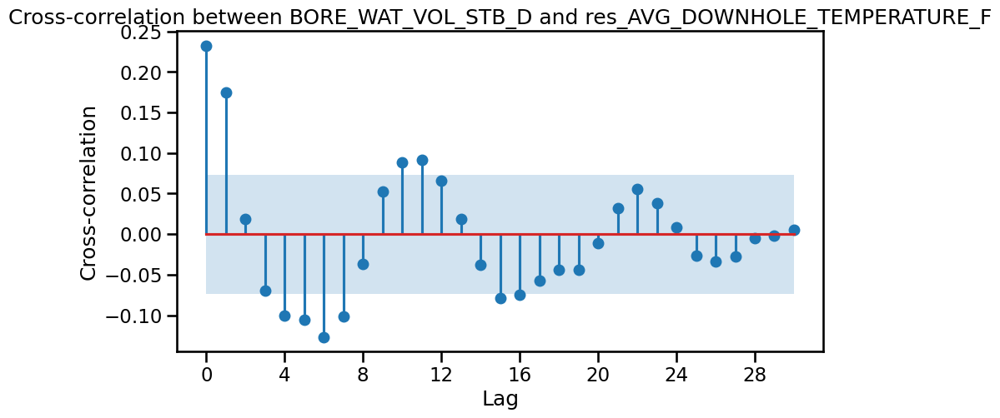

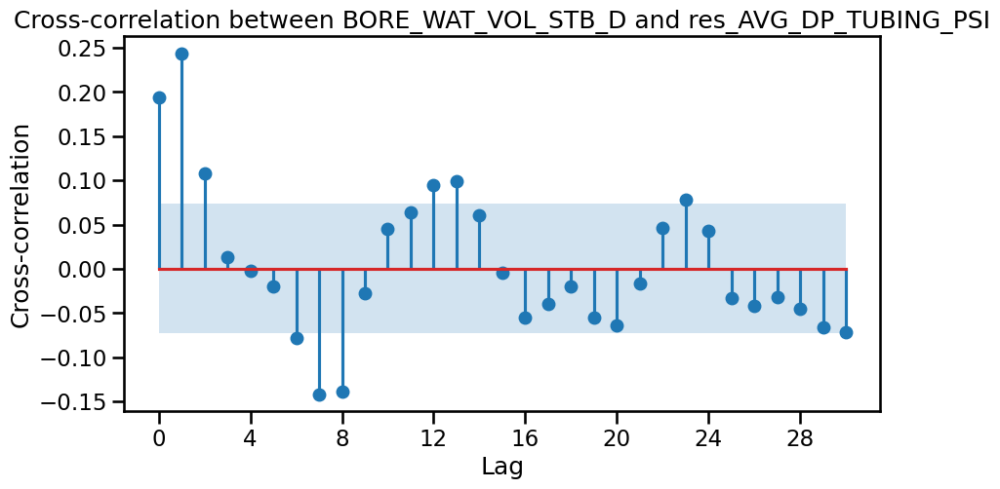

...

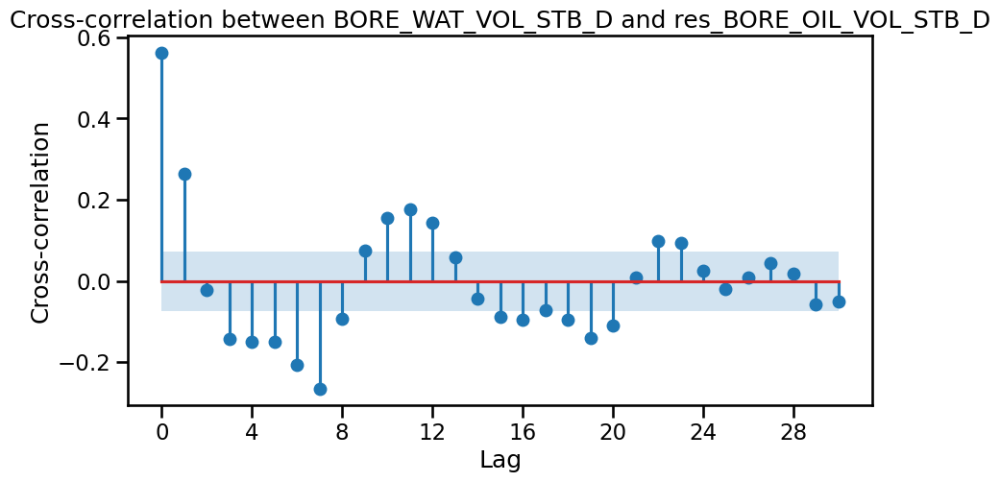

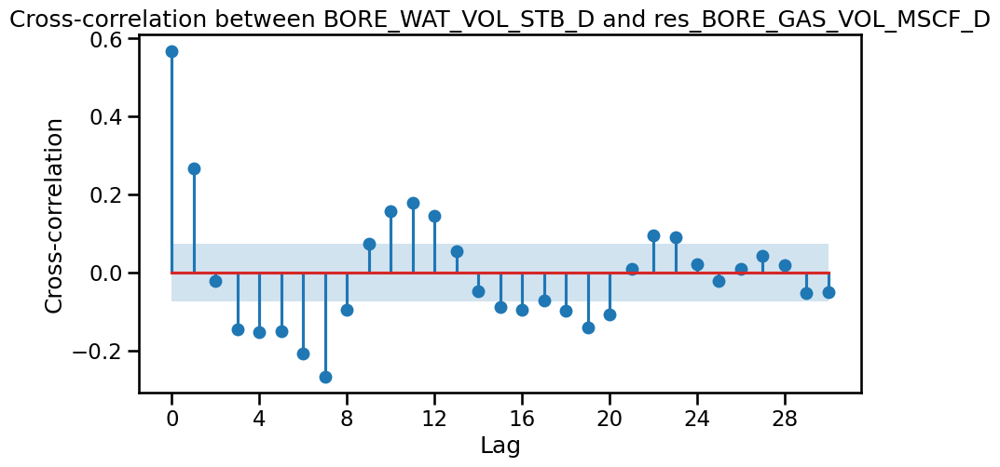

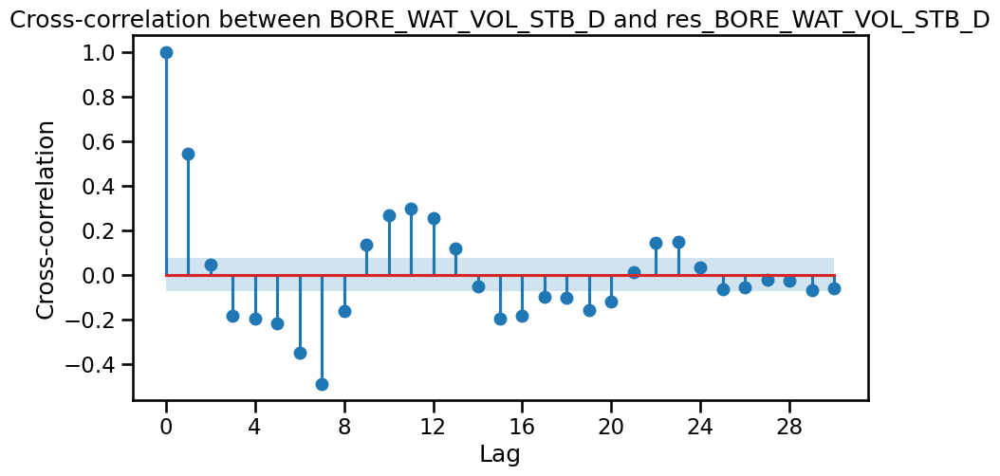

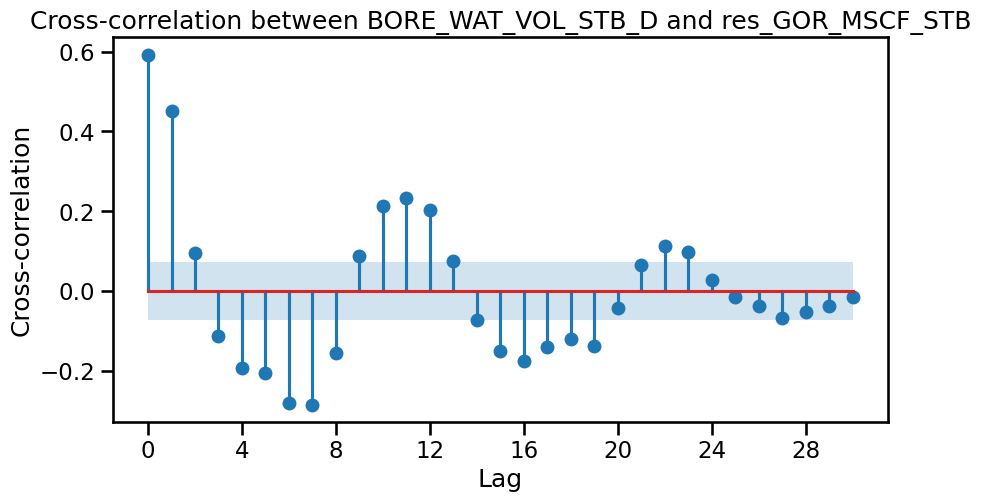

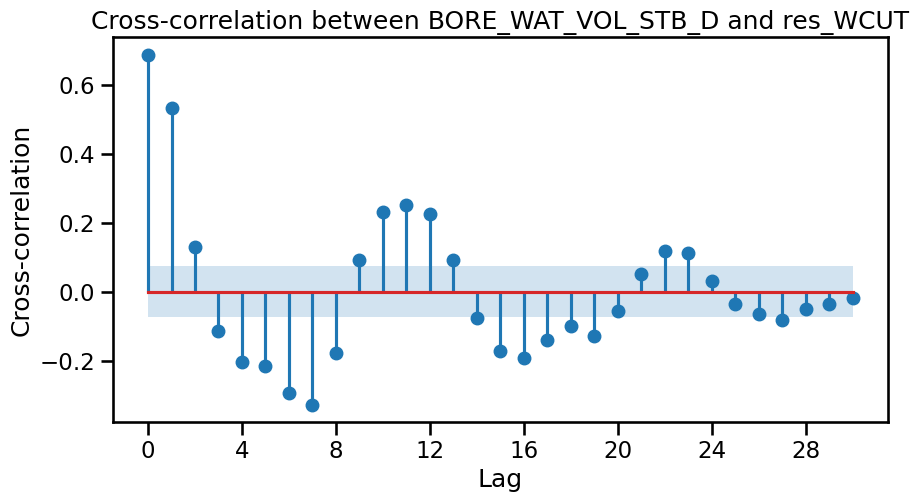

In [47]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_WAT_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between BORE_WAT_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
on_stream: [0,1] <br>
avg choke, [0,1]<br>
avg wht_P: [0,1]<br>
water: [1]<br>
GOR:[1]<br>
WCUT:[1]<br>


### 2.4 Lasso for feature selection for Lags to use

In [20]:
phase_selected_lag_lasso_adder =MultiPhaseLassoSelectedLagFeatureAdder(
    target_cols=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D",],
    variables=None,
    max_lag_days=45,

    # IMPORTANT!!!!! these are user specified lags that should be kept no matter what. gotten from the PACF or CCF
    force_keep_lag_map={
        "BORE_OIL_VOL_STB_D": [1, 2, 6, 7], # from pacf
        "AVG_CHOKE_SIZE_P": [0,1], # from ccf
        "AVG_WHT_P": [0,1],  # from cff
        "BORE_GAS_VOL_MSCF_D": [1, 2, 6, 7], # from pacf
        "BORE_WAT_VOL_STB_D": [1, 2,6,7,14,30], # from pacf & also to get a better match for water
        "ON_STREAM_HRS": [0,1], # from ccf
        "GOR_MSCF_STB": [1],  # from cff
        "WCUT": [1],  # from cff
        "WCUT": [2,3,7,14,30],  # to get better match for the recussive water forecast
        "ON_STREAM_HRS": [2, 7],  # to get better match for the recussive water forecast
        "GOR_MSCF_STB": [2,3,7,14,30],  # to get better match for the recussive water forecast
        #"BORE_WAT_VOL_STB_D": [5,7,14,30]  # to get better match for the recussive water forecast
    },
    
    alphas=np.logspace(-2, 1, 100),
    n_splits=5,
    min_features=5,
    #drop_na=True,
    verbose=True,
)

In [21]:
phase_selected_lag_lasso_adder.fit_transform(df).columns

MultiPhaseLassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 13
MultiPhaseLassoSelectedLagFeatureAdder__All lag features created: 572
MultiPhaseLassoSelectedLagFeatureAdder__Candidate lag features used by MultiTaskLasso: 572
MultiPhaseLassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 702
MultiPhaseLassoSelectedLagFeatureAdder__Best alpha: 0.08697490026177834
MultiPhaseLassoSelectedLagFeatureAdder__Lasso-selected lag features: 15
MultiPhaseLassoSelectedLagFeatureAdder__Force-kept lag features: 28
MultiPhaseLassoSelectedLagFeatureAdder__Final selected lag features: 39
MultiPhaseLassoSelectedLagFeatureAdder__Final dataframe columns returned: 52
Missing force-keep lag features:
['AVG_CHOKE_SIZE_P_lag_0D', 'AVG_WHT_P_lag_0D']


Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT',
       'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_OIL_VOL_STB_D_lag_2D',
       'BORE_OIL_VOL_STB_D_lag_6D', 'BORE_OIL_VOL_STB_D_lag_7D',
       'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_WHT_P_lag_1D',
       'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_2D',
       'BORE_GAS_VOL_MSCF_D_lag_6D', 'BORE_GAS_VOL_MSCF_D_lag_7D',
       'BORE_WAT_VOL_STB_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_2D',
       'BORE_WAT_VOL_STB_D_lag_6D', 'BORE_WAT_VOL_STB_D_lag_7D',
       'BORE_WAT_VOL_STB_D_lag_14D', 'BORE_WAT_VOL_STB_D_lag_30D',
       'ON_STREAM_HRS_lag_2D', 'ON_STREAM_HRS_lag_7D', 'GOR_MSCF_STB_lag_2D',
       'GOR_MSCF_STB_lag_3D', 'GOR_MSCF_STB_lag_7D', 'GOR_MSCF_STB_lag_14D',
       'GOR_MSCF_STB_lag_30D', 'WCUT_lag_2D

## 3. Window Feature

In [22]:
df_win=df.copy()
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0


### Rolling features

In [23]:
# rolling features
phase_rolling_feat = WindowFeatures(
    variables=["BORE_OIL_VOL_STB_D", "BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D", "GOR_MSCF_STB", "WCUT", "AVG_WHT_P"],
    functions=["mean", "std"],
    window=[7],
    periods=1,
    freq="1D",
    missing_values="ignore",
    drop_original=False,
    drop_na=False,
)

df_win = phase_rolling_feat.fit_transform(df_win)
df_win.head(10)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,BORE_GAS_VOL_MSCF_D_window_7_mean,BORE_GAS_VOL_MSCF_D_window_7_std,BORE_WAT_VOL_STB_D_window_7_mean,BORE_WAT_VOL_STB_D_window_7_std,GOR_MSCF_STB_window_7_mean,GOR_MSCF_STB_window_7_std,WCUT_window_7_mean,WCUT_window_7_std,AVG_WHT_P_window_7_mean,AVG_WHT_P_window_7_std
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-12,0.0,3.087015,4401.914613,206.462102,4082.057380,319.857233,319.857233,47.667722,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-13,0.0,1.962365,4402.408177,206.525930,4003.512922,234.428690,398.895256,48.961670,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-04-14,0.0,0.000000,4405.997433,206.543714,4101.482610,300.767041,304.514823,46.636466,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39.356178,9.221599
2014-04-15,0.0,31.141856,4407.098706,206.638448,4205.241490,176.678475,201.857217,47.296994,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41.447102,8.930405


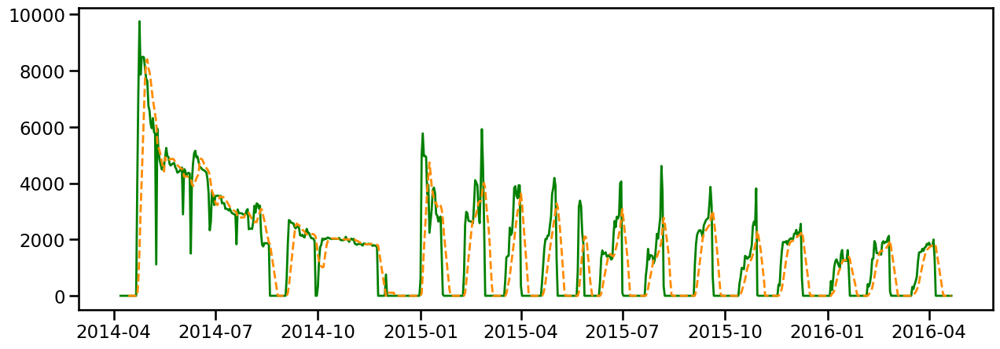

In [24]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_window_7_mean"],label="BORE_OIL_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)


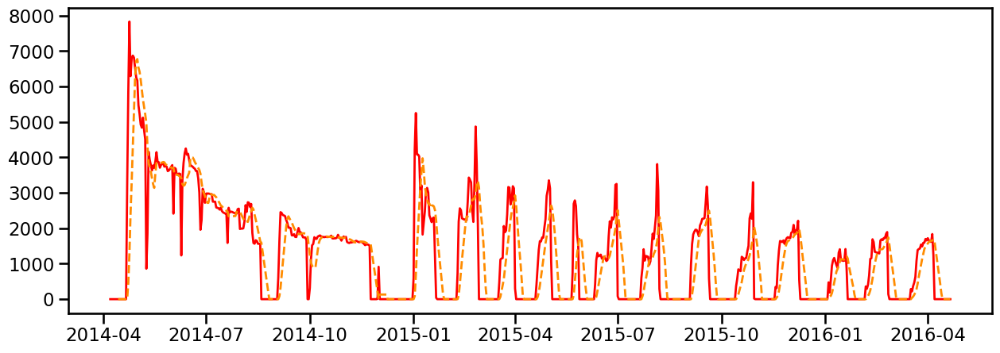

In [25]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_GAS_VOL_MSCF_D"], label="BORE_GAS_VOL_MSCF_D", color="red", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_GAS_VOL_MSCF_D_window_7_mean"],label="BORE_GAS_VOL_MSCF_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)

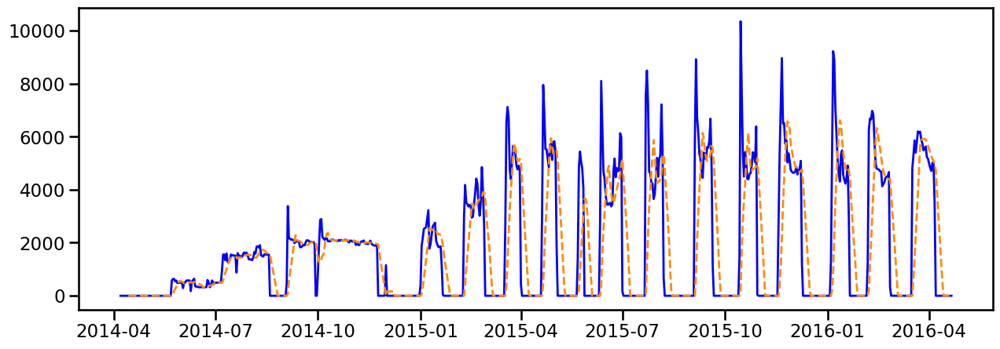

In [26]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_WAT_VOL_STB_D"], label="BORE_WAT_VOL_STB_D", color="blue", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_WAT_VOL_STB_D_window_7_mean"],label="BORE_WAT_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)


### Expanding features

In [1]:
# expanding window
expanding_feat = ExpandingWindowFeatures(
    variables=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"], 
    functions=["sum"], 
    freq="1d" ,# Shift results back by 1 day to avoid data leakage.
    periods=1,
    missing_values="ignore",
    drop_original=False,
    drop_na=False,
)  

df_win = expanding_feat.fit_transform(df_win)
df_win.head()

NameError: name 'ExpandingWindowFeatures' is not defined

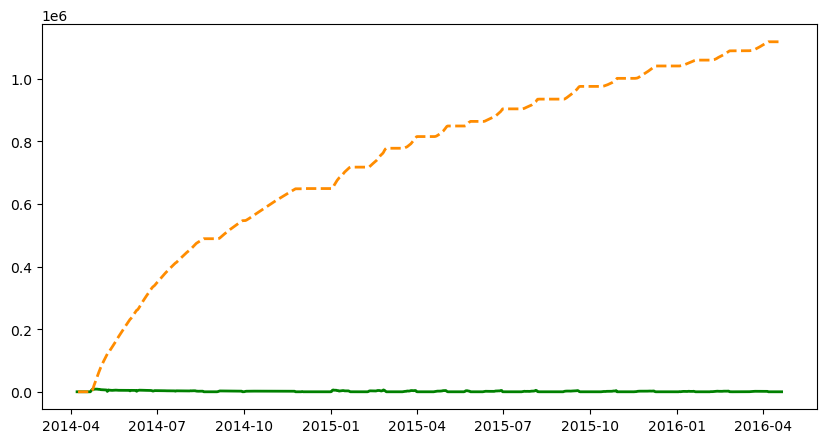

In [28]:
# I am just going to make one plot for oil
plt.figure(figsize=(10, 5))
plt.plot(df_win.index, df_win["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_expanding_sum"],label="BORE_OIL_VOL_STB_D_expanding_mean_y",color="darkorange",linewidth=2,linestyle="--",)


## 4. Trend feature

In [29]:
trend_adder = TrendFeatureAdder(
    freq="d",
    degree=2,
    include_bias=False,
    prefix="time_since",
    overwrite=True,
    verbose=True,
)

In [30]:
trend_adder.fit_transform(df)

Trend features added: ['time_since_d', 'time_since_d_power_2']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,time_since_d,time_since_d_power_2
DATEPRD,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,2.0,4.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,3.0,9.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,4.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,741.0,549081.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,742.0,550564.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,743.0,552049.0


## 5. Seasonality

There are 3 main main to model seasonality. I will take monthly seasonality as an example
1. Integer to represent the month [1,2,3...] This is good for tree based model, but not for linear models
2. Dummies to represent the month. This is good for linear models but not for tree based models because it is sparse.
3. Fourier series. good for linear models and give u less features.
4. Can just only use sine or consine transformation

In [31]:
df_season=df.copy()
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0


### 5.1 Fourier series 

I have 4 transformation here. 3 for the 3 different phases and 1 for multiphase. When you build the pipeline you can comment out what you don't want to use. For now, run all the transformation. Yes it takes time

#### Multiphase Fourier. All 3 phases all together

In [32]:
fourier_alpha_grid = np.logspace(-4, 1, 100)

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

phase_calendar_fourier_selector = AddSelectedCalendarFourierFeaturesMultiPhase(
    target_cols=["BORE_OIL_VOL_STB_D", "BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"],
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
)

In [33]:
phase_calendar_fourier_selector.fit_transform(df_season)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:2712: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.269e+00, tolerance: 3.780e-03
  ) = cd_fast.enet_coordinate_descent_multi_task(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:2712: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.500e+00, tolerance: 3.780e-03
  ) = cd_fast.enet_coordinate_descent_multi_task(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:2712: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features 

AddSelectedCalendarFourierFeaturesMultiPhase__Best seasonality: monthly
AddSelectedCalendarFourierFeaturesMultiPhase__Best K: 1
AddSelectedCalendarFourierFeaturesMultiPhase__Best alpha: 0.2420128264794381
AddSelectedCalendarFourierFeaturesMultiPhase__Best CV score: -1.717738100872077
AddSelectedCalendarFourierFeaturesMultiPhase__Candidate Fourier features: 2
AddSelectedCalendarFourierFeaturesMultiPhase__Selected Fourier features: 1
AddSelectedCalendarFourierFeaturesMultiPhase__Final dataframe columns returned: 14


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,month_cos_1
DATEPRD,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,-0.5
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,-0.5
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,-0.5


#### Oil

In [161]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

oil_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_OIL_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="oil",
)

In [162]:
oil_calendar_fourier_selector.fit_transform(df_season)

Best seasonality: monthly
Best K: 2
Best alpha: 100
Best CV score: -1811.8209082304468
Candidate Fourier features: 4
Selected Fourier features: 3
Final dataframe columns returned: 16


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,oil_month_cos_1,oil_month_cos_2,oil_month_sin_2
DATEPRD,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5,-0.866025


#### Gas

In [163]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

gas_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_GAS_VOL_MSCF_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="gas",
)

In [164]:
gas_calendar_fourier_selector.fit_transform(df_season)

Best seasonality: monthly
Best K: 2
Best alpha: 100
Best CV score: -1469.8932071154475
Candidate Fourier features: 4
Selected Fourier features: 2
Final dataframe columns returned: 15


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,gas_month_cos_1,gas_month_cos_2
DATEPRD,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,-0.5,-0.5


#### Water

In [165]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

water_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_WAT_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="water",
)

In [166]:
water_calendar_fourier_selector.fit_transform(df_season)


Best seasonality: monthly
Best K: 9
Best alpha: 0.01
Best CV score: -2347.174820817685
Candidate Fourier features: 18
Selected Fourier features: 17
Final dataframe columns returned: 30


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,water_month_sin_5,water_month_sin_4,water_month_sin_1,water_month_cos_4,water_month_sin_7,water_month_cos_8,water_month_cos_9,water_month_cos_7,water_month_sin_9,water_month_sin_8
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,...,-0.866025,0.866025,0.866025,-0.5,0.866025,-0.5,1.0,-0.5,-7.347881e-16,-0.866025


### 5.2 datetime from feature engine
This is just Interger for the week & Month

In [32]:
# Interger for datetime

In [33]:
week_month_of_year_adder = DatetimeFeatures(
    variables="index",
    features_to_extract=["week", "month"],
    drop_original=False
)

In [34]:
df_season = week_month_of_year_adder.fit_transform(df_season)

### 5.3 Sine and Cosine transformation
Use feature engine to do sine and cosine transformation

In [35]:
sin_cos_adder=CyclicalFeatures(
    variables=["week", "month"],
    drop_original=False
)

In [36]:
df_season=sin_cos_adder.fit_transform(df_season)
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,week,month,week_sin,week_cos,month_sin,month_cos
DATEPRD,,,,,,,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.0,0.0,0.0,0.0,0.0,15,4,0.978556,-0.205979,0.866025,-0.5
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.0,0.0,0.0,0.0,0.0,16,4,0.947326,-0.320270,0.866025,-0.5
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.0,0.0,0.0,0.0,0.0,16,4,0.947326,-0.320270,0.866025,-0.5


## 6. Create Final lags columns that I am interested in shifted by 1 day

In [37]:
df_create_1_day=df.copy()

In [38]:
#Based on my domain knowlege these are variables I know that will be strong predictors. So I want these variables to be there, to prevent data leakage, I have shifted by 1 day

specific_lag1_adder = AddSpecificLag1Features(
    variables=['ON_STREAM_HRS', 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
    freq="1D",
    verbose=True,
)

In [39]:
df_create_1_day=specific_lag1_adder.fit_transform(df_create_1_day)
(df_create_1_day.columns, len(df_create_1_day.columns))

AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 0
AddSpecificLag1Features__New lag columns to add: 6
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


(Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
        'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT',
        'ON_STREAM_HRS_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D',
        'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D',
        'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 19)

In [40]:
df_create_1_day_use=df_create_1_day.copy()

## 7.Drop Features

I am going to use this to drop columns that will result in data leakage. I am not too sure about ON_STREAM_HRS for now, but I will remove it for now. For each phase, I will have to keep the target because I need the target when I make the feature engineering

In [41]:
df_create_1_day_use=df_create_1_day.copy()

In [42]:
phase_column_dropper = DropFeatures(
    features_to_drop=[
        "GOR_MSCF_STB",
        "WCUT",
        #"ON_STREAM_HRS"
    ]
)

In [43]:
df_create_1_day_use=phase_column_dropper.fit_transform(df_create_1_day_use)
(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

(Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
        'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'ON_STREAM_HRS_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 17)

# BREAKER

In [44]:
#------------------------------------------------------------------------------------#

# SPLIT DATA
The splitting splits the dataframe into
1. Train: to be used to train the model and also internal cross validation
2. Val: Validation set to be used to select the best model
3. Test: to get the actual perfomance of the best model
4. Keep: This will be save for production. Is to see how the best model will behave in delopyment
Splitting is very tricky as part of the data needed in the val is in the train, and part of the data needed in test is in the val...<br>
The shifting below accounts for this offset

In [45]:
from sarima_helper_functions import sarima_split_train_test_keep

train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df, 0.6,0.15,0.15)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_date=keep_data.index[0]
len(df)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

max_lookback = 45 # largest lag / rolling / expanding history needed
#val
shifted_start_val = pd.Timestamp(start_of_val_date) - pd.offsets.Day(max_lookback)
X_val_shift = df[(df.index >= shifted_start_val) & (df.index < start_of_test_date)]
#test
shifted_start_test = pd.Timestamp(start_of_test_date) - pd.offsets.Day(max_lookback)
X_test_shift = df[(df.index >= shifted_start_test) & (df.index < start_of_keep_date)]
#keep
shifted_start_keep = pd.Timestamp(start_of_keep_date) - pd.offsets.Day(max_lookback)
X_keep_shift = df[(df.index >= shifted_start_keep) ]

#display(train_data, X_val_shift, X_test_shift,X_keep_shift)

In [46]:
train_data.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
       'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

# PIPELINE FOR FEATURE ENGINEERING & MODELS ONE-STEP LOOK AHEAD

## Instantiate Pipeline

In [47]:
# feature engine transformer to drop all nan. Because I am using lag features. The transformers can give NAN
final_nan_dropper = DropMissingData()

In [48]:
feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", GOR_WCUT_feat),
        
        ("added_phase_lag_features", phase_selected_lag_lasso_adder),
        ("added_rolling_window_features", phase_rolling_feat),
        ("added_expanding_window_features", expanding_feat),
        ("added_Time_features", trend_adder),

        #("added_phase_calendar_fourier_selector", phase_calendar_fourier_selector),        
        #abs("added_oil_calendar_fourier_selector", oil_calendar_fourier_selector),
        #("added_gas_calendar_fourier_selector", gas_calendar_fourier_selector),
        #("added_water_calendar_fourier_selector", water_calendar_fourier_selector),
        ("added_week_month_of_year_adder", week_month_of_year_adder),
        ("added_sin_cos_adder", sin_cos_adder),
        ("final_lagged_columns_by_1day", specific_lag1_adder),
        ("final_column_drop", phase_column_dropper), # drop GOR and WCUT & ON_STREAM_HRS at time t
        ("drop_missing_rows_once", final_nan_dropper),
        
    ]
)

## Train Pipeline

In [49]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

train_feat = feature_pipe.fit_transform(train_data)

y_train = train_data[target_cols].loc[train_feat.index]

MultiPhaseLassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 13
MultiPhaseLassoSelectedLagFeatureAdder__All lag features created: 572
MultiPhaseLassoSelectedLagFeatureAdder__Candidate lag features used by MultiTaskLasso: 572
MultiPhaseLassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 404
MultiPhaseLassoSelectedLagFeatureAdder__Best alpha: 0.14174741629268056
MultiPhaseLassoSelectedLagFeatureAdder__Lasso-selected lag features: 10
MultiPhaseLassoSelectedLagFeatureAdder__Force-kept lag features: 28
MultiPhaseLassoSelectedLagFeatureAdder__Final selected lag features: 35
MultiPhaseLassoSelectedLagFeatureAdder__Final dataframe columns returned: 48
Missing force-keep lag features:
['AVG_CHOKE_SIZE_P_lag_0D', 'AVG_WHT_P_lag_0D']
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 5
AddSpecificLag1Features__New lag columns to add: 1
Skipped existing lag c

In [50]:
(train_feat.columns, len(train_feat.columns))

(Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
        'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_OIL_VOL_STB_D_lag_2D',
        'BORE_OIL_VOL_STB_D_lag_6D', 'BORE_OIL_VOL_STB_D_lag_7D',
        'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_WHT_P_lag_1D',
        'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_2D',
        'BORE_GAS_VOL_MSCF_D_lag_6D', 'BORE_GAS_VOL_MSCF_D_lag_7D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_2D',
        'BORE_WAT_VOL_STB_D_lag_6D', 'BORE_WAT_VOL_STB_D_lag_7D',
        'BORE_WAT_VOL_STB_D_lag_14D', 'BORE_WAT_VOL_STB_D_lag_30D',
        'ON_STREAM_HRS_lag_2D', 'ON_STREAM_HRS_lag_7D', 'GOR_MSCF_STB_lag_2D',
        'GOR_MSCF_STB_lag_3D', 'GOR_MSCF_STB_lag_7D', 'GOR_MSCF_STB_lag_14D',
        'GOR_MSCF_STB_lag_30D', 'WCUT_lag_2D', 'WCUT_

In [51]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
val_feat_with_context = feature_pipe.transform(X_val_shift)

# Remove context rows
val_feat = val_feat_with_context[val_feat_with_context.index >= start_of_val_date]

y_val = val_data[target_cols].loc[val_feat.index]

Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']


In [52]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
test_feat_with_context = feature_pipe.transform(X_test_shift)

# Remove context rows
test_feat = test_feat_with_context[test_feat_with_context.index >= start_of_test_date]

y_test = test_data[target_cols].loc[test_feat.index]

Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']


In [53]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
keep_feat_with_context = feature_pipe.transform(X_keep_shift)

# Remove context rows
keep_feat = keep_feat_with_context[keep_feat_with_context.index >= start_of_keep_date]

y_keep = keep_data[target_cols].loc[keep_feat.index]

Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']


In [54]:
train_feat

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,BORE_WAT_VOL_STB_D_expanding_sum,time_since_d,time_since_d_power_2,week,month,week_sin,week_cos,month_sin,month_cos,ON_STREAM_HRS_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-05-15,24.0,46.316444,3276.301077,225.876846,2274.567736,589.588157,1001.733341,119.476624,4678.549372,3769.683190,...,0.000000,38.0,1444.0,20,5,6.631227e-01,-0.748511,5.000000e-01,-0.866025,24.0
2014-05-16,24.0,46.346142,3273.519232,225.878422,2278.662197,582.155555,994.857035,119.079959,4629.866243,3703.241407,...,0.000000,39.0,1521.0,20,5,6.631227e-01,-0.748511,5.000000e-01,-0.866025,24.0
2014-05-17,24.0,47.087211,3243.086091,225.999846,2267.616980,563.325447,975.469111,129.057392,4924.166453,3887.382847,...,0.000000,40.0,1600.0,20,5,6.631227e-01,-0.748511,5.000000e-01,-0.866025,24.0
2014-05-18,24.0,47.769807,3192.314841,226.200253,2243.666810,536.496822,948.648031,128.896724,5249.978611,4145.507171,...,0.000000,41.0,1681.0,20,5,6.631227e-01,-0.748511,5.000000e-01,-0.866025,24.0
2014-05-19,24.0,47.135949,3197.949228,226.148761,2250.643167,535.277980,947.306061,132.356494,4961.402128,3867.573066,...,0.000000,42.0,1764.0,21,5,5.680647e-01,-0.822984,5.000000e-01,-0.866025,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-24,24.0,56.584188,3320.924670,226.803437,2794.197366,125.110567,526.727304,166.484526,2655.683578,2195.201304,...,589596.033825,443.0,196249.0,26,6,1.224647e-16,-1.000000,1.224647e-16,-1.000000,24.0
2015-06-25,24.0,56.562100,3280.979710,226.705080,2776.178105,103.514989,504.801604,163.821664,2440.005993,2017.348353,...,594770.975002,444.0,197136.0,26,6,1.224647e-16,-1.000000,1.224647e-16,-1.000000,24.0
2015-06-26,24.0,58.214131,3251.842204,226.691844,2761.935340,86.426280,489.906864,162.178477,2809.154942,2308.021883,...,599241.205868,445.0,198025.0,26,6,1.224647e-16,-1.000000,1.224647e-16,-1.000000,24.0


In [55]:
val_feat

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,BORE_WAT_VOL_STB_D_expanding_sum,time_since_d,time_since_d_power_2,week,month,week_sin,week_cos,month_sin,month_cos,ON_STREAM_HRS_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-06-29,24.00000,69.608817,3101.059152,226.916734,2637.796824,52.256276,463.262328,168.753620,3995.979191,3224.779135,...,105025.045947,448.0,200704.0,27,6,-0.120537,-0.992709,1.224647e-16,-1.000000,24.00000
2015-06-30,24.00000,73.330771,3005.462588,226.975864,2557.923503,45.302541,447.539085,170.831877,4058.814393,3249.193246,...,111150.503211,449.0,201601.0,27,6,-0.120537,-0.992709,1.224647e-16,-1.000000,24.00000
2015-07-01,3.29167,10.210002,3062.055307,225.528340,2660.506633,7.130528,401.548674,106.169924,97.680749,81.128813,...,117130.980355,450.0,202500.0,27,7,-0.120537,-0.992709,-5.000000e-01,-0.866025,24.00000
2015-07-02,0.00000,0.000000,3248.802322,218.497964,2548.121279,315.822856,700.681044,61.444004,0.000000,0.000000,...,117296.842645,451.0,203401.0,27,7,-0.120537,-0.992709,-5.000000e-01,-0.866025,3.29167
2015-07-03,0.00000,0.000000,3333.885964,217.103540,2534.576325,400.867337,799.309639,60.376874,0.000000,0.000000,...,117296.842645,452.0,204304.0,27,7,-0.120537,-0.992709,-5.000000e-01,-0.866025,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-10-14,6.10819,13.458974,4097.258201,222.079189,3304.098065,461.756856,793.160136,96.597031,430.537494,363.461718,...,296739.083727,555.0,308025.0,42,10,-0.935016,0.354605,-8.660254e-01,0.500000,0.00000
2015-10-15,24.00000,59.009922,3868.577592,226.226106,3479.210188,117.758023,389.367404,175.576736,664.329732,570.225048,...,298192.092736,556.0,309136.0,42,10,-0.935016,0.354605,-8.660254e-01,0.500000,6.10819
2015-10-16,24.00000,55.379709,3739.880144,226.494666,3312.367024,156.009659,427.513120,176.104902,992.783610,841.184147,...,308539.333370,557.0,310249.0,42,10,-0.935016,0.354605,-8.660254e-01,0.500000,24.00000


In [56]:
test_feat

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,BORE_WAT_VOL_STB_D_expanding_sum,time_since_d,time_since_d_power_2,week,month,week_sin,week_cos,month_sin,month_cos,ON_STREAM_HRS_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-10-19,24.000,52.316167,3610.265993,226.566205,3124.998586,213.987104,485.267406,163.179353,1417.974766,1195.208364,...,122327.306887,560.0,313600.0,43,10,-0.885456,0.464723,-0.866025,0.5,24.000
2015-10-20,24.000,51.120816,3552.067891,226.557809,3062.234658,218.890229,489.833233,157.711614,1387.972373,1168.580727,...,127743.839667,561.0,314721.0,43,10,-0.885456,0.464723,-0.866025,0.5,24.000
2015-10-21,24.000,52.894196,3527.494386,226.455727,3050.769540,143.695707,476.724846,142.168522,1309.664238,1102.693032,...,132877.456792,562.0,315844.0,43,10,-0.885456,0.464723,-0.866025,0.5,24.000
2015-10-22,24.000,55.400250,3486.613389,226.525560,3018.653102,89.360924,467.960288,147.780181,1370.486701,1151.197066,...,137290.701979,563.0,316969.0,43,10,-0.885456,0.464723,-0.866025,0.5,24.000
2015-10-23,24.000,56.322305,3456.814121,226.501034,3003.357464,75.530895,453.456657,148.192082,1375.392753,1162.138620,...,141684.448754,564.0,318096.0,43,10,-0.885456,0.464723,-0.866025,0.5,24.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-02-03,0.000,0.000000,4210.587155,213.694088,2516.840643,1468.390384,1693.746512,48.455564,0.000000,0.000000,...,378998.602666,667.0,444889.0,5,2,0.568065,0.822984,0.866025,0.5,0.000
2016-02-04,0.000,0.000000,4244.314147,213.587726,2526.253754,1489.841649,1718.060392,48.068978,0.000000,0.000000,...,378998.602666,668.0,446224.0,5,2,0.568065,0.822984,0.866025,0.5,0.000
2016-02-05,0.000,0.000000,4269.344660,213.486386,2532.273701,1492.316432,1737.070958,47.342030,0.000000,0.000000,...,378998.602666,669.0,447561.0,5,2,0.568065,0.822984,0.866025,0.5,0.000


In [57]:
keep_feat

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,...,BORE_WAT_VOL_STB_D_expanding_sum,time_since_d,time_since_d_power_2,week,month,week_sin,week_cos,month_sin,month_cos,ON_STREAM_HRS_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2016-02-08,24.0,54.219458,3845.507002,226.216888,3483.684413,133.619370,361.822588,154.699867,457.709474,408.254530,...,95800.284804,672.0,451584.0,6,2,0.663123,0.748511,0.866025,0.5,24.0
2016-02-09,24.0,54.167314,3745.661649,226.500052,3337.654127,179.669312,408.007522,163.091560,746.663345,669.451939,...,102480.880700,673.0,452929.0,6,2,0.663123,0.748511,0.866025,0.5,24.0
2016-02-10,24.0,54.142060,3646.995642,226.669064,3191.521144,226.916813,455.474498,172.956485,1303.940511,1135.383850,...,109127.763213,674.0,454276.0,6,2,0.663123,0.748511,0.866025,0.5,24.0
2016-02-11,24.0,54.170093,3562.936818,226.723519,3081.181969,252.792689,481.754849,171.094905,1322.306756,1156.036946,...,116097.187184,675.0,455625.0,6,2,0.663123,0.748511,0.866025,0.5,24.0
2016-02-12,24.0,53.736418,3496.572659,226.681410,3013.533844,250.729750,483.038816,166.077487,1940.091895,1688.458667,...,122932.952692,676.0,456976.0,6,2,0.663123,0.748511,0.866025,0.5,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-17,0.0,0.000000,3919.920125,214.156526,3825.672402,38.366612,94.247723,49.644446,0.000000,0.000000,...,300866.960234,741.0,549081.0,15,4,0.970942,-0.239316,0.866025,-0.5,0.0
2016-04-18,0.0,0.000000,4015.651877,214.215836,3816.747199,59.755656,198.904678,53.136032,0.000000,0.000000,...,300866.960234,742.0,550564.0,16,4,0.935016,-0.354605,0.866025,-0.5,0.0
2016-04-19,0.0,0.265188,4091.600010,214.119572,3967.218467,27.068152,124.381543,50.214308,0.000000,0.000000,...,300866.960234,743.0,552049.0,16,4,0.935016,-0.354605,0.866025,-0.5,0.0


In [58]:
# drop the target from the feat dataframe to make the final dataframe to use
X_train = train_feat.drop(columns=target_cols)
#y_train = train_feat[target_col]

X_val = val_feat.drop(columns=target_cols)
#y_val = val_feat[target_col]

X_test = test_feat.drop(columns=target_cols)
#y_test = test_feat[target_col]

X_keep = keep_feat.drop(columns=target_cols)
#y_keep = keep_feat[target_col]

In [59]:
assert X_train.index.max() < X_val.index.min()
assert X_val.index.max() < X_test.index.min()
assert X_test.index.max() < X_keep.index.min()

In [60]:
X_train.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'DP_CHOKE_SIZE_PSI',
       'AVG_WHP_P_PSI', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D_lag_1D',
       'BORE_OIL_VOL_STB_D_lag_2D', 'BORE_OIL_VOL_STB_D_lag_6D',
       'BORE_OIL_VOL_STB_D_lag_7D', 'AVG_CHOKE_SIZE_P_lag_1D',
       'AVG_WHT_P_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
       'BORE_GAS_VOL_MSCF_D_lag_2D', 'BORE_GAS_VOL_MSCF_D_lag_6D',
       'BORE_GAS_VOL_MSCF_D_lag_7D', 'BORE_WAT_VOL_STB_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_2D', 'BORE_WAT_VOL_STB_D_lag_6D',
       'BORE_WAT_VOL_STB_D_lag_7D', 'BORE_WAT_VOL_STB_D_lag_14D',
       'BORE_WAT_VOL_STB_D_lag_30D', 'ON_STREAM_HRS_lag_2D',
       'ON_STREAM_HRS_lag_7D', 'GOR_MSCF_STB_lag_2D', 'GOR_MSCF_STB_lag_3D',
       'GOR_MSCF_STB_lag_7D', 'GOR_MSCF_STB_lag_14D', 'GOR_MSCF_STB_lag_30D',
       'WCUT_lag_2D', 'WCUT_lag_3D', 'WCUT_lag_7D', 'WCUT_lag_14D',
       'WCUT_lag_30D', 'WCUT_lag_1D', 'GOR_MSCF_S

In [61]:
print(
    X_train.columns.equals(X_val.columns) 
    and X_train.columns.equals(X_test.columns) 
    and X_train.columns.equals(X_keep.columns)
)

True


## Models

### Lasso
Lasso is very good for feature selection

#### MultiTask. Model the Phase Together at the same time

##### Train Model

In [60]:
# -----------------------------
# Base model pipeline
# -----------------------------
multitask_lasso_pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        (
            "model",
            MultiTaskLasso(
                max_iter=500000,
                tol=1e-5,
                random_state=42,
            ),
        ),
    ]
)

# -----------------------------
# Scale targets also
# -----------------------------
multitask_lasso_model = TransformedTargetRegressor(
    regressor=multitask_lasso_pipe,
    transformer=StandardScaler(),
)

# -----------------------------
# Time series CV
# -----------------------------
ts_cv = TimeSeriesSplit(n_splits=5)

# -----------------------------
# Alpha grid
# -----------------------------
param_grid = {
    "regressor__model__alpha": np.logspace(-3, -1, 200)
}

# -----------------------------
# GridSearchCV on TRAIN ONLY
# -----------------------------
grid = GridSearchCV(
    estimator=multitask_lasso_model,
    param_grid=param_grid,
    cv=ts_cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)

grid.fit(X_train, y_train)

,estimator,TransformedTa...ndardScaler())
,param_grid,"{'regressor__model__alpha': array([0.001 ..., 0.1 ])}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,TimeSeriesSpl...est_size=None)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [61]:
# -----------------------------
# The predictions are back to the original units, but the coefficients are scaled
# -----------------------------


# -----------------------------
# 1. Get final fitted estimator from grid search
# -----------------------------
best_model = grid.best_estimator_

# If you used TransformedTargetRegressor, the fitted internal pipeline is here
best_pipeline = best_model.regressor_

# -----------------------------
# 2. Extract fitted MultiTaskLasso model
# -----------------------------
multitask_lasso_model = best_pipeline.named_steps["model"]

# -----------------------------
# 3. Get feature names
# -----------------------------
feature_names = X_train.columns.to_numpy()

# -----------------------------
# 4. Extract coefficients
# MultiTaskLasso coef_ shape = n_targets x n_features
# -----------------------------
coef_matrix = multitask_lasso_model.coef_

coef_df = pd.DataFrame(
    {
        "Feature": feature_names,
        "Oil_Coefficient": coef_matrix[0, :],
        "Gas_Coefficient": coef_matrix[1, :],
        "Water_Coefficient": coef_matrix[2, :],
    }
)

# -----------------------------
# 5. Compute overall importance across all targets
# -----------------------------
coef_df["Importance"] = np.sqrt(
    coef_df["Oil_Coefficient"] ** 2
    + coef_df["Gas_Coefficient"] ** 2
    + coef_df["Water_Coefficient"] ** 2
)

# -----------------------------
# 6. Keep selected features
# -----------------------------
MultiTask_Lasso_selected_features = (
    coef_df[coef_df["Importance"] != 0]
    .sort_values("Importance", ascending=False)
    .reset_index(drop=True)
)

# -----------------------------
# 7. Print result
# -----------------------------
print(
    f"MultiTaskLasso selected "
    f"{len(MultiTask_Lasso_selected_features)} out of {len(feature_names)} features:\n"
)

print(MultiTask_Lasso_selected_features.to_string(index=False))

print("Best alpha:", grid.best_params_["regressor__model__alpha"])
print("Best CV RMSE:", -grid.best_score_)

coef_df.sort_values(by="Importance", ascending=False,inplace=True)
coef_df[:15]

MultiTaskLasso selected 39 out of 67 features:

                         Feature  Oil_Coefficient  Gas_Coefficient  Water_Coefficient  Importance
                AVG_CHOKE_SIZE_P         0.276161         0.285095           0.293162    0.493445
      BORE_GAS_VOL_MSCF_D_lag_1D         0.327497         0.333504          -0.074249    0.473278
       BORE_WAT_VOL_STB_D_lag_1D        -0.014517        -0.034233           0.424612    0.426237
                       AVG_WHT_P         0.143890         0.136482           0.358955    0.410098
                     WCUT_lag_1D        -0.141657        -0.130211           0.227697    0.298106
                   ON_STREAM_HRS         0.182146         0.190921           0.125572    0.292227
         AVG_CHOKE_SIZE_P_lag_1D         0.008408         0.009012          -0.221983    0.222325
       BORE_OIL_VOL_STB_D_lag_1D         0.132997         0.120803          -0.030112    0.182176
BORE_OIL_VOL_STB_D_expanding_sum        -0.092513        -0.079838    

,Feature,Oil_Coefficient,Gas_Coefficient,Water_Coefficient,Importance
1,AVG_CHOKE_SIZE_P,0.276161,0.285095,0.293162,0.493445
14,BORE_GAS_VOL_MSCF_D_lag_1D,0.327497,0.333504,-0.074249,0.473278
18,BORE_WAT_VOL_STB_D_lag_1D,-0.014517,-0.034233,0.424612,0.426237
7,AVG_WHT_P,0.143890,0.136482,0.358955,0.410098
36,WCUT_lag_1D,-0.141657,-0.130211,0.227697,0.298106
0,ON_STREAM_HRS,0.182146,0.190921,0.125572,0.292227
12,AVG_CHOKE_SIZE_P_lag_1D,0.008408,0.009012,-0.221983,0.222325
8,BORE_OIL_VOL_STB_D_lag_1D,0.132997,0.120803,-0.030112,0.182176
55,BORE_OIL_VOL_STB_D_expanding_sum,-0.092513,-0.079838,0.077154,0.144518
5,DP_CHOKE_SIZE_PSI,0.091631,0.090690,0.025774,0.131473


##### Lasso Model Prediction on TRAIN

In [62]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

best_lasso_model = grid.best_estimator_

train_pred = best_lasso_model.predict(X_train)

train_pred_df = pd.DataFrame(
    train_pred,
    index=X_train.index,
    columns=target_cols,
)

train_metrics = []

for col in target_cols:
    train_metrics.append(
        {
            "Phase": col,
            "Train_RMSE": root_mean_squared_error(y_train[col], train_pred_df[col]),
            "Train_MAE": mean_absolute_error(y_train[col], train_pred_df[col]),
            "Train_R2": r2_score(y_train[col], train_pred_df[col]),
        }
    )

train_metrics_df = pd.DataFrame(train_metrics)
train_metrics_df

,Phase,Train_RMSE,Train_MAE,Train_R2
0,BORE_OIL_VOL_STB_D,376.047437,228.043729,0.945584
1,BORE_GAS_VOL_MSCF_D,310.886204,185.325750,0.945445
2,BORE_WAT_VOL_STB_D,402.630294,247.508322,0.944477


##### Lasso Model Prediction on Val

In [63]:

val_pred = best_lasso_model.predict(X_val)

val_pred_df = pd.DataFrame(
    val_pred,
    index=X_val.index,
    columns=target_cols,
)

val_metrics = []

for col in target_cols:
    val_metrics.append(
        {
            "Phase": col,
            "Val_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            "Val_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            "Val_R2": r2_score(y_val[col], val_pred_df[col]),
        }
    )

val_metrics_df = pd.DataFrame(val_metrics)
val_metrics_df


,Phase,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,482.941880,336.424869,0.830851
1,BORE_GAS_VOL_MSCF_D,376.251486,255.380909,0.850551
2,BORE_WAT_VOL_STB_D,1278.970330,910.402353,0.794871


In [64]:
y_train

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,
2014-05-15,4678.549372,3769.683190,0.000000
2014-05-16,4629.866243,3703.241407,0.000000
2014-05-17,4924.166453,3887.382847,0.000000
2014-05-18,5249.978611,4145.507171,0.000000
2014-05-19,4961.402128,3867.573066,0.000000
...,...,...,...
2015-06-24,2655.683578,2195.201304,5174.941177
2015-06-25,2440.005993,2017.348353,4470.230865
2015-06-26,2809.154942,2308.021883,4814.535065


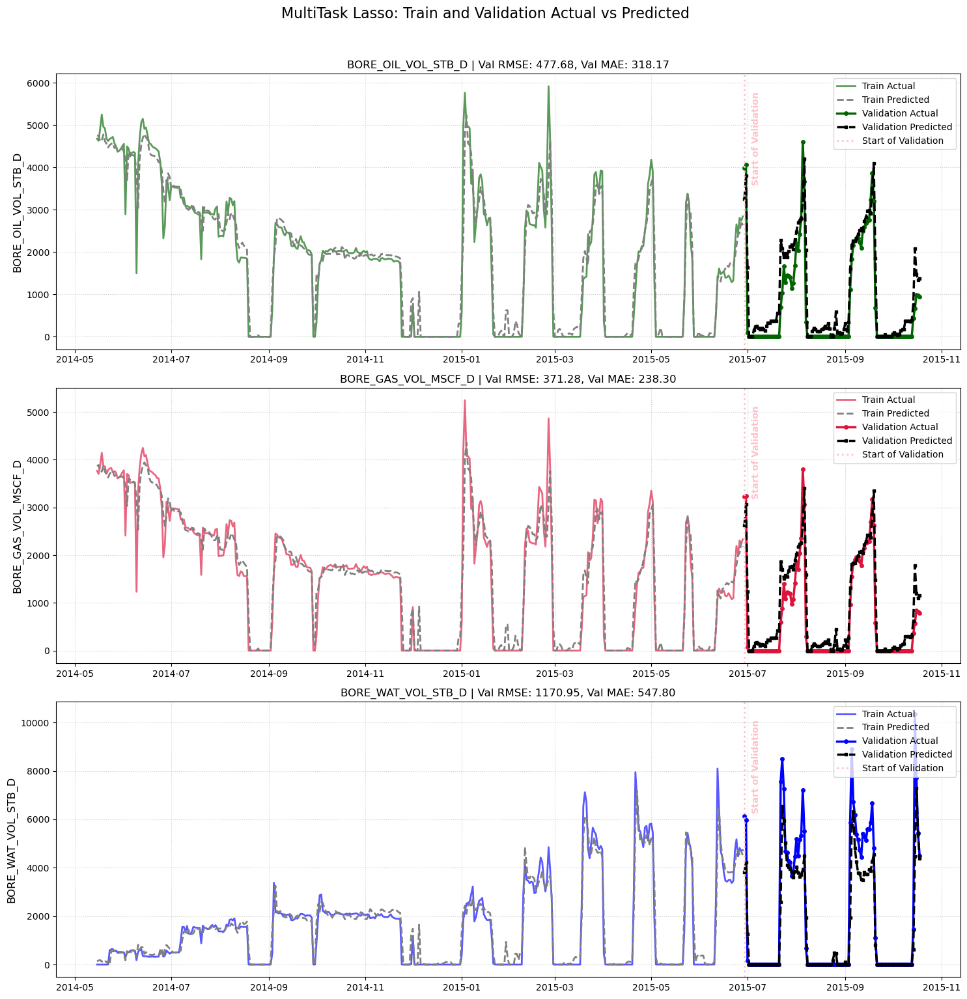

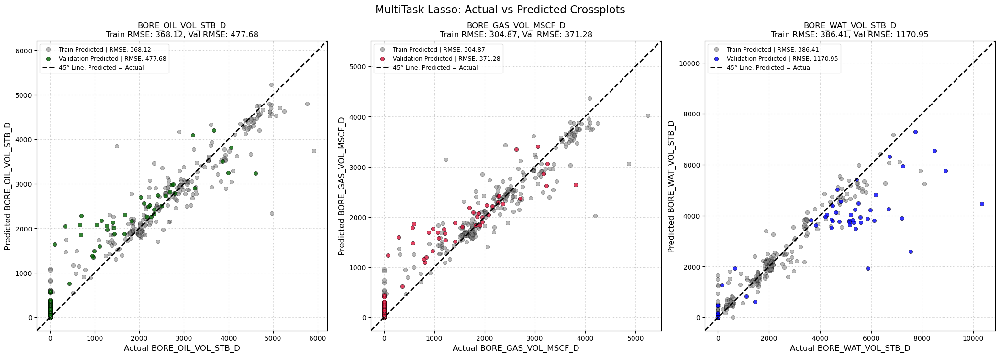

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiTask Lasso,BORE_OIL_VOL_STB_D,368.117259,200.176060,0.947855,477.684208,318.166036,0.834514
1,MultiTask Lasso,BORE_GAS_VOL_MSCF_D,304.874539,162.990146,0.947534,371.278992,238.303597,0.854475
2,MultiTask Lasso,BORE_WAT_VOL_STB_D,386.407352,214.921206,0.948861,1170.950518,547.799936,0.828058


In [65]:
#best_multitask_lasso_model = multitask_grid.best_estimator_

multitask_train_pred_df, multitask_val_pred_df, multitask_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        model=best_lasso_model,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Lasso",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
    )
)

Lasso_model_val_metric=multitask_metrics_df
Lasso_model_val_metric

### Random Forest

#### Train Model & Predict Val

In [66]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

In [67]:
def build_multitask_rf_model(params):
    rf_model = RandomForestRegressor(
        **params,
        random_state=42,
        n_jobs=-1,
    )

    random_forest_pipe = Pipeline(
        steps=[
            ("rf", rf_model),
        ]
    )

    multitask_rf_model = TransformedTargetRegressor(
        regressor=random_forest_pipe,
        transformer=StandardScaler(),
    )

    return multitask_rf_model

In [68]:
ts_cv = TimeSeriesSplit(n_splits=10)

In [69]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 1000, step=100),
        "max_depth": trial.suggest_categorical(
            "max_depth", [None, 3, 5, 7, 10, 15, 20]
        ),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "max_features": trial.suggest_categorical(
            "max_features", ["sqrt", "log2", 0.5, 0.7, 1.0]
        ),
        "bootstrap": trial.suggest_categorical("bootstrap", [True]),
    }

    fold_scores = []

    for train_idx, valid_idx in ts_cv.split(X_train):
        X_cv_train = X_train.iloc[train_idx]
        X_cv_valid = X_train.iloc[valid_idx]

        y_cv_train = y_train.iloc[train_idx]
        y_cv_valid = y_train.iloc[valid_idx]

        model = build_multitask_rf_model(params)

        model.fit(X_cv_train, y_cv_train)

        y_cv_pred = model.predict(X_cv_valid)

        raw_rmse = root_mean_squared_error(
            y_cv_valid,
            y_cv_pred,
            multioutput="raw_values",
        )

        target_std = y_cv_train.std().values

        normalized_rmse = raw_rmse / target_std

        fold_score = np.mean(normalized_rmse)

        fold_scores.append(fold_score)

    return np.mean(fold_scores)

In [70]:
study = optuna.create_study(
    direction="minimize",
    study_name="multitask_random_forest_oil_gas_water",
)

study.optimize(
    objective,
    n_trials=25,
    show_progress_bar=True,
)


print("Best CV RMSE:")
print(study.best_value)

print("\nBest hyperparameters:")
print(study.best_params)


best_rf_params = study.best_params

best_multitask_rf_model = build_multitask_rf_model(best_rf_params)

best_multitask_rf_model.fit(X_train, y_train)


val_pred = best_multitask_rf_model.predict(X_val)

val_pred_df = pd.DataFrame(
    val_pred,
    index=y_val.index,
    columns=target_cols,
)


[I 2026-07-06 23:57:18,161] A new study created in memory with name: multitask_random_forest_oil_gas_water


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-07-06 23:57:20,736] Trial 0 finished with value: 0.8796847840263041 and parameters: {'n_estimators': 600, 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 0.7, 'bootstrap': True}. Best is trial 0 with value: 0.8796847840263041.
[I 2026-07-06 23:57:24,659] Trial 1 finished with value: 0.857886357452837 and parameters: {'n_estimators': 1000, 'max_depth': None, 'min_samples_split': 17, 'min_samples_leaf': 3, 'max_features': 0.5, 'bootstrap': True}. Best is trial 1 with value: 0.857886357452837.
[I 2026-07-06 23:57:28,241] Trial 2 finished with value: 0.9599378139571572 and parameters: {'n_estimators': 1000, 'max_depth': 7, 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 'log2', 'bootstrap': True}. Best is trial 1 with value: 0.857886357452837.
[I 2026-07-06 23:57:29,669] Trial 3 finished with value: 0.9256979742614819 and parameters: {'n_estimators': 400, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': '

In [71]:
rf_metrics = []

for col in target_cols:
    rf_metrics.append(
        {
            "Phase": col,
            "Val_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            "Val_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            "Val_R2": r2_score(y_val[col], val_pred_df[col]),
        }
    )

rf_metrics_df = pd.DataFrame(rf_metrics)

rf_metrics_df

,Phase,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,411.070831,215.888829,0.877450
1,BORE_GAS_VOL_MSCF_D,339.874888,177.646629,0.878052
2,BORE_WAT_VOL_STB_D,1565.496890,907.512943,0.692667


#### Plot RF MODEL

In [72]:
best_multitask_rf_model

,regressor,Pipeline(step...m_state=42))])
,transformer,StandardScaler()
,func,None
,inverse_func,None
,check_inverse,True
,n_estimators,900
,criterion,'squared_error'
,max_depth,20
,min_samples_split,7
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0


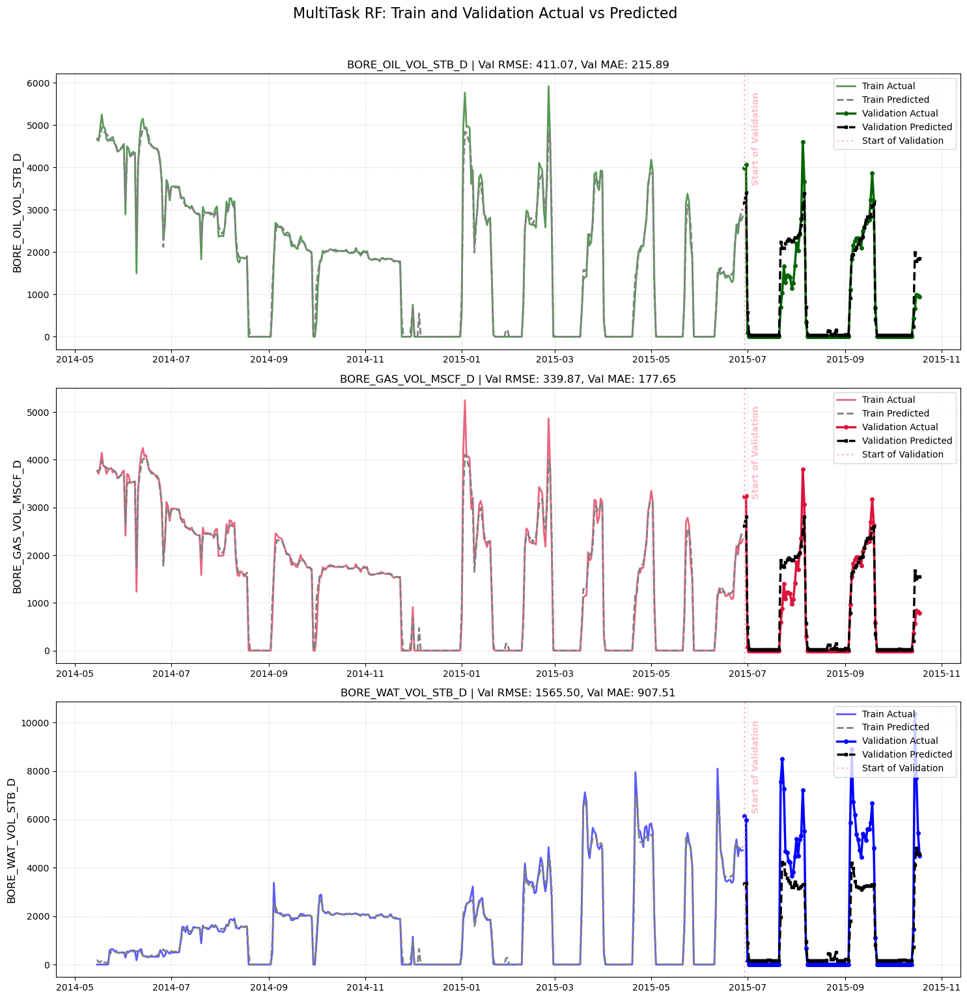

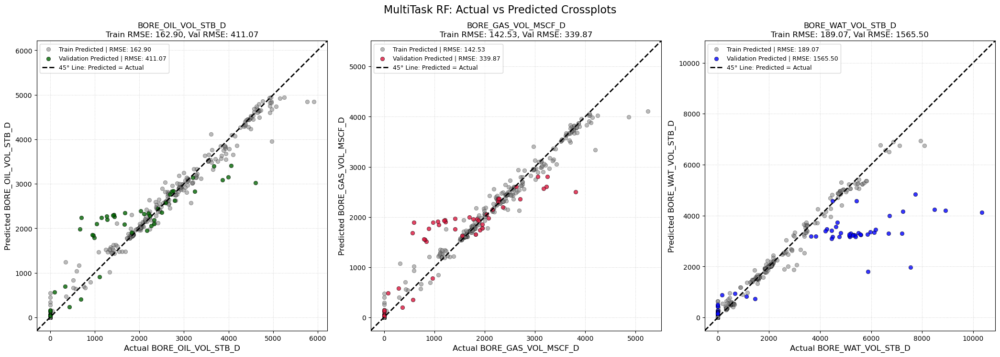

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiTask RF,BORE_OIL_VOL_STB_D,162.903807,80.420241,0.989788,411.070831,215.888829,0.877450
1,MultiTask RF,BORE_GAS_VOL_MSCF_D,142.526614,67.946366,0.988534,339.874888,177.646629,0.878052
2,MultiTask RF,BORE_WAT_VOL_STB_D,189.074491,91.330351,0.987756,1565.496890,907.512943,0.692667


In [73]:
#best_multitask_lasso_model = multitask_grid.best_estimator_

multitask_train_pred_df, multitask_val_pred_df, multitask_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        model=best_multitask_rf_model,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask RF",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
    )
)

Lasso_model_val_metric=multitask_metrics_df
Lasso_model_val_metric

### Gradient Boost 
GradientBoostingRegressor is not naturally **multi-output**, so for oil/gas/water model wrap it with **MultiOutputRegressor**, which fits one separate gradient boosting model per target

#### Train Model & Predict Val

In [64]:
def build_multitask_gb_model(params):
    gb_model = GradientBoostingRegressor(
        **params,
        random_state=42,
    )

    gb_pipe = Pipeline(
        steps=[
            ("gb", gb_model),
        ]
    )

    multioutput_gb_model = MultiOutputRegressor(
        estimator=gb_pipe,
        n_jobs=-1,
    )

    multitask_gb_model = TransformedTargetRegressor(
        regressor=multioutput_gb_model,
        transformer=StandardScaler(),
    )

    return multitask_gb_model

In [65]:
ts_cv = TimeSeriesSplit(n_splits=10)

In [66]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int "n_estimators",100, 1000, step=50,),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True,),
        "max_depth": trial.suggest_int("max_depth", 2,  6,),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20,),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf",  1, 20,),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0,),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", 0.5, 0.7, 1.0],),
        "loss": trial.suggest_categorical("loss", ["squared_error", "absolute_error", "huber"],),
    }

    fold_scores = []
    for train_idx, valid_idx in ts_cv.split(X_train):
        X_cv_train = X_train.iloc[train_idx]
        X_cv_valid = X_train.iloc[valid_idx]

        y_cv_train = y_train.iloc[train_idx]
        y_cv_valid = y_train.iloc[valid_idx]

        model = build_multitask_gb_model(params)

        model.fit(X_cv_train, y_cv_train)

        y_cv_pred = model.predict(X_cv_valid)

        raw_rmse = root_mean_squared_error(y_cv_valid,y_cv_pred,multioutput="raw_values",)

        target_std = y_cv_train.std().values
        normalized_rmse = raw_rmse / target_std
        fold_score = np.mean(normalized_rmse)
        fold_scores.append(fold_score)
    return np.mean(fold_scores)

In [83]:
study = optuna.create_study(
    direction="minimize",
    study_name="multitask_gradient_boosting_oil_gas_water",
)

study.optimize(
    objective,
    n_trials=100,
    show_progress_bar=True,
)

print("Best normalized CV RMSE:")
print(study.best_value)

print("\nBest hyperparameters:")
print(study.best_params)

[I 2026-07-07 08:18:02,849] A new study created in memory with name: multitask_gradient_boosting_oil_gas_water


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-07-07 08:18:10,348] Trial 0 finished with value: 0.9570428665422076 and parameters: {'n_estimators': 400, 'learning_rate': 0.0581257235199799, 'max_depth': 2, 'min_samples_split': 4, 'min_samples_leaf': 19, 'subsample': 0.739211658701403, 'max_features': 'log2', 'loss': 'absolute_error'}. Best is trial 0 with value: 0.9570428665422076.
[I 2026-07-07 08:18:13,523] Trial 1 finished with value: 0.7261900047856726 and parameters: {'n_estimators': 550, 'learning_rate': 0.19046328847171973, 'max_depth': 2, 'min_samples_split': 2, 'min_samples_leaf': 10, 'subsample': 0.6240597691227083, 'max_features': 0.5, 'loss': 'squared_error'}. Best is trial 1 with value: 0.7261900047856726.
[I 2026-07-07 08:18:22,696] Trial 2 finished with value: 0.8737177077722558 and parameters: {'n_estimators': 1000, 'learning_rate': 0.011794123455425942, 'max_depth': 5, 'min_samples_split': 19, 'min_samples_leaf': 11, 'subsample': 0.7045925603039793, 'max_features': 'sqrt', 'loss': 'huber'}. Best is trial 1 

In [84]:
best_gb_params = study.best_params

best_multitask_gb_model = build_multitask_gb_model(best_gb_params)

best_multitask_gb_model.fit(X_train, y_train)

,regressor,MultiOutputRe... n_jobs=-1)
,transformer,StandardScaler()
,func,None
,inverse_func,None
,check_inverse,True
,loss,'squared_error'
,learning_rate,0.021743632724256813
,n_estimators,900
,subsample,0.7812017183365462
,criterion,'friedman_mse'
,min_samples_split,6


In [85]:
val_pred_raw = best_multitask_gb_model.predict(X_val)

val_pred_df_raw = pd.DataFrame(
    val_pred_raw,
    index=y_val.index,
    columns=target_cols,
)

val_pred_df_raw.head()

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,
2015-06-29,3347.360062,2696.836374,4262.318473
2015-06-30,4227.008901,3333.745540,4282.751891
2015-07-01,432.314656,320.293757,296.848669
2015-07-02,6.898861,28.046855,-46.177666
2015-07-03,18.075769,24.156361,72.664157


In [86]:
(val_pred_df_raw < 0).sum()

BORE_OIL_VOL_STB_D     22
BORE_GAS_VOL_MSCF_D    21
BORE_WAT_VOL_STB_D      1
dtype: int64

In [87]:
# manual set any rate that is less than zero to be 0
val_pred = np.maximum(0, val_pred_raw)
val_pred_df = pd.DataFrame(
    val_pred,
    index=y_val.index,
    columns=target_cols,
)


In [88]:
(val_pred_df < 0).sum()

BORE_OIL_VOL_STB_D     0
BORE_GAS_VOL_MSCF_D    0
BORE_WAT_VOL_STB_D     0
dtype: int64

#### Plot Gradient Boost

In [89]:
gb_metrics = []

for col in target_cols:
    gb_metrics.append(
        {
            "Phase": col,
            "Val_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            "Val_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            "Val_R2": r2_score(y_val[col], val_pred_df[col]),
        }
    )

gb_metrics_df = pd.DataFrame(gb_metrics)

gb_metrics_df

,Phase,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,320.707443,169.941233,0.925407
1,BORE_GAS_VOL_MSCF_D,245.734284,129.860694,0.936252
2,BORE_WAT_VOL_STB_D,1037.934732,532.433190,0.864903


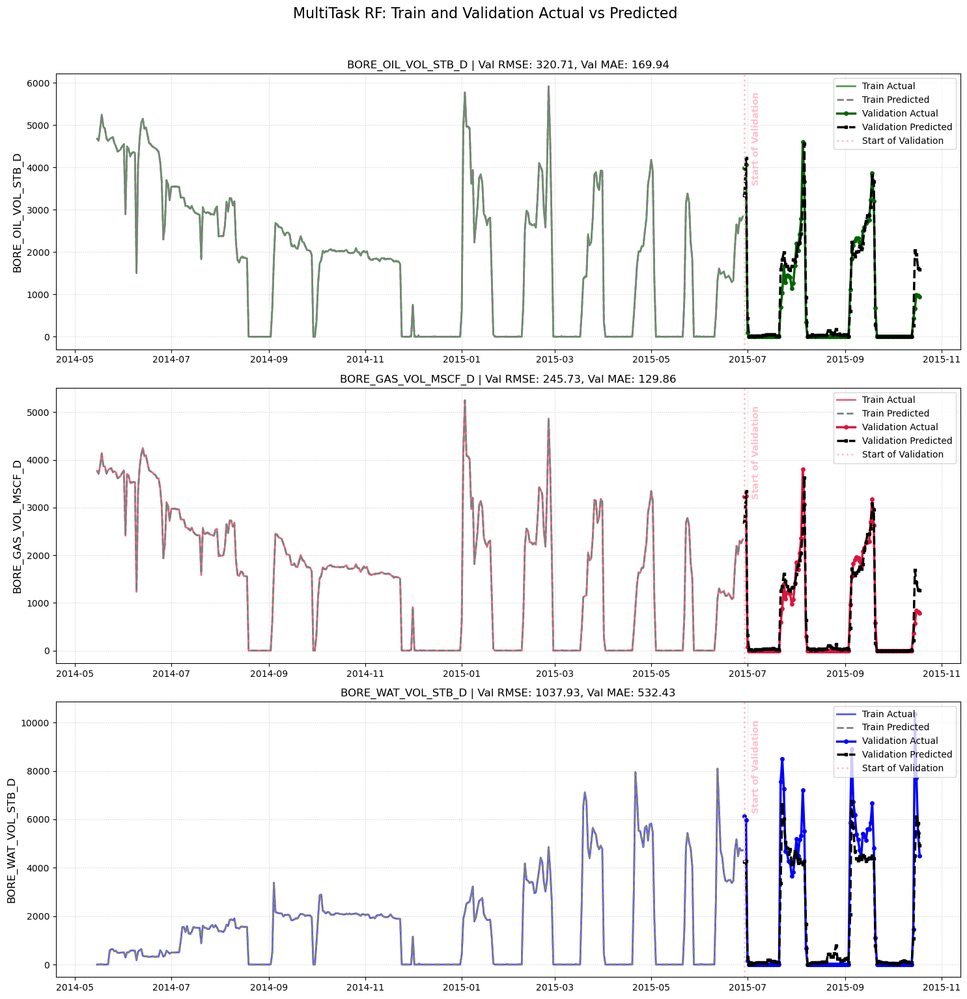

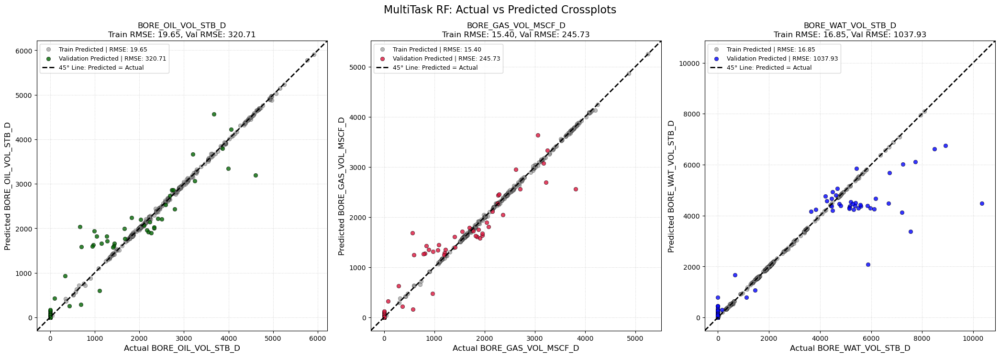

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiTask RF,BORE_OIL_VOL_STB_D,19.647724,12.886087,0.999851,320.707443,169.941233,0.925407
1,MultiTask RF,BORE_GAS_VOL_MSCF_D,15.399609,9.918282,0.999866,245.734284,129.860694,0.936252
2,MultiTask RF,BORE_WAT_VOL_STB_D,16.851631,11.383755,0.999903,1037.934732,532.433190,0.864903


In [90]:
multitask_train_pred_df, multitask_val_pred_df, multitask_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        model=best_multitask_gb_model,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Gradient Boost",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
    )
)

GB_model_val_metric=multitask_metrics_df
GB_model_val_metric

### Light GBM
LightGBM’s linear_tree=True makes each leaf fit a linear model instead of a constant value.<br>
Splits are still chosen normally, but each leaf becomes linear, and recommends rescaling features because the leaf models are linear.<br>
linear_tree=True increases memory use and works with CPU/GPU device types and serial tree learner.<br>

#### Train Model & Predict Val

In [82]:
def build_multitask_lgbm_model(params):
    lgbm_model = LGBMRegressor(
        **params,
        objective="regression",
        linear_tree=True,      # use False for normal LightGBM
        random_state=42,
        n_jobs=-1,
        verbose=-1,
    )

    lgbm_pipe = Pipeline(
        steps=[
            ("lgbm", lgbm_model),
        ]
    )

    multioutput_lgbm_model = MultiOutputRegressor(
        estimator=lgbm_pipe,
        n_jobs=1,
    )

    multitask_lgbm_model = TransformedTargetRegressor(
        regressor=multioutput_lgbm_model,
        transformer=StandardScaler(),
    )

    return multitask_lgbm_model

In [83]:
ts_cv = TimeSeriesSplit(n_splits=10)

In [84]:
#Optuna objective
def objective(trial):
    params = {"n_estimators": trial.suggest_int("n_estimators",100, 1500,step=100,),
              "learning_rate": trial.suggest_float("learning_rate", 0.005,0.15,log=True,),
              "num_leaves": trial.suggest_int("num_leaves",8,64,),
              "max_depth": trial.suggest_int("max_depth",2,8,),
              "min_child_samples": trial.suggest_int(
              "min_child_samples",5,50,),
              "subsample": trial.suggest_float("subsample",0.6,1.0,),
              "subsample_freq": trial.suggest_int("subsample_freq",1,7,),
              "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6,1.0,),
              "reg_alpha": trial.suggest_float("reg_alpha",1e-8,10.0,log=True,),
              "reg_lambda": trial.suggest_float( "reg_lambda",1e-8,10.0,log=True,),
             "min_split_gain": trial.suggest_float("min_split_gain",0.0,1.0,),
             }

# Keep num_leaves reasonable relative to max_depth
    max_allowed_leaves = 2 ** params["max_depth"]
    params["num_leaves"] = min(params["num_leaves"], max_allowed_leaves)

    fold_scores = []

    for train_idx, valid_idx in ts_cv.split(X_train):
        X_cv_train = X_train.iloc[train_idx]
        X_cv_valid = X_train.iloc[valid_idx]

        y_cv_train = y_train.iloc[train_idx]
        y_cv_valid = y_train.iloc[valid_idx]

        model = build_multitask_lgbm_model(params)

        model.fit(X_cv_train, y_cv_train)

        # Already inverse-transformed back to original units
        y_cv_pred_raw = model.predict(X_cv_valid)

        # Physical constraint
        y_cv_pred = np.maximum(0, y_cv_pred_raw)

        raw_rmse = root_mean_squared_error(
            y_cv_valid,
            y_cv_pred,
            multioutput="raw_values",
        )

        target_std = y_cv_train.std().values
        target_std = np.where(target_std == 0, 1.0, target_std)

        normalized_rmse = raw_rmse / target_std

        fold_score = np.mean(normalized_rmse)

        if not np.isfinite(fold_score):
            return np.inf

        fold_scores.append(fold_score)

    return np.mean(fold_scores)

In [85]:
study = optuna.create_study(
    direction="minimize",
    study_name="multitask_lightgbm_linear_tree_oil_gas_water",
)

study.optimize(
    objective,
    n_trials=50,
    show_progress_bar=True,
)

print("Best normalized CV RMSE:")
print(study.best_value)

print("\nBest hyperparameters:")
print(study.best_params)

[I 2026-07-07 14:01:21,240] A new study created in memory with name: multitask_lightgbm_linear_tree_oil_gas_water


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-07-07 14:01:26,368] Trial 0 finished with value: 0.8827110622355836 and parameters: {'n_estimators': 800, 'learning_rate': 0.061664951280710575, 'num_leaves': 22, 'max_depth': 6, 'min_child_samples': 44, 'subsample': 0.8349148563521949, 'subsample_freq': 1, 'colsample_bytree': 0.6229212154265076, 'reg_alpha': 0.7371004877361974, 'reg_lambda': 1.5035833037804751, 'min_split_gain': 0.5186139870001855}. Best is trial 0 with value: 0.8827110622355836.
[I 2026-07-07 14:01:29,004] Trial 1 finished with value: 0.9270812412375932 and parameters: {'n_estimators': 500, 'learning_rate': 0.04984398747551235, 'num_leaves': 50, 'max_depth': 3, 'min_child_samples': 34, 'subsample': 0.7173248019835552, 'subsample_freq': 1, 'colsample_bytree': 0.6386355500420998, 'reg_alpha': 2.4281811418686186, 'reg_lambda': 3.7724137886572506e-08, 'min_split_gain': 0.7567491551020729}. Best is trial 0 with value: 0.8827110622355836.
[I 2026-07-07 14:01:33,393] Trial 2 finished with value: 0.7054431112023156 a

In [70]:
# Train final LightGBM linear-tree model
best_lgbm_linear_tree_params = study.best_params

best_lgbm_linear_tree_params["num_leaves"] = min(
    best_lgbm_linear_tree_params["num_leaves"],
    2 ** best_lgbm_linear_tree_params["max_depth"],
)

best_multitask_lgbm_linear_tree_model = build_multitask_lgbm_model(best_lgbm_linear_tree_params)

best_multitask_lgbm_linear_tree_model.fit(X_train, y_train)

,regressor,MultiOutputRe... n_jobs=1)
,transformer,StandardScaler()
,func,None
,inverse_func,None
,check_inverse,True
,boosting_type,'gbdt'
,num_leaves,36
,max_depth,8
,learning_rate,0.04021080381319178
,n_estimators,900
,subsample_for_bin,200000


In [72]:
val_pred_raw = best_multitask_lgbm_linear_tree_model.predict(X_val)

val_pred_df_raw = pd.DataFrame(
    val_pred_raw,
    index=y_val.index,
    columns=target_cols,
)

val_pred_df_raw.head()

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,
2015-06-29,3161.807322,2547.797330,4450.861084
2015-06-30,4133.157401,3550.061070,4634.326617
2015-07-01,548.744074,389.869420,1002.633748
2015-07-02,76.275046,74.850044,174.912041
2015-07-03,73.037877,69.271810,32.828683


In [73]:
(val_pred_df_raw < 0).sum()

BORE_OIL_VOL_STB_D     0
BORE_GAS_VOL_MSCF_D    0
BORE_WAT_VOL_STB_D     0
dtype: int64

In [74]:
# manual set any rate that is less than zero to be 0
val_pred = np.maximum(0, val_pred_raw)
val_pred_df = pd.DataFrame(
    val_pred,
    index=y_val.index,
    columns=target_cols,
)


In [75]:
(val_pred_df < 0).sum()

BORE_OIL_VOL_STB_D     0
BORE_GAS_VOL_MSCF_D    0
BORE_WAT_VOL_STB_D     0
dtype: int64

#### Plot Light GBM

In [76]:
gb_metrics = []

for col in target_cols:
    gb_metrics.append(
        {
            "Phase": col,
            "Val_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            "Val_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            "Val_R2": r2_score(y_val[col], val_pred_df[col]),
        }
    )

gb_metrics_df = pd.DataFrame(gb_metrics)

gb_metrics_df

,Phase,Val_RMSE,Val_MAE,Val_R2
0,BORE_OIL_VOL_STB_D,279.605568,169.786703,0.943301
1,BORE_GAS_VOL_MSCF_D,236.551702,146.660916,0.940927
2,BORE_WAT_VOL_STB_D,1144.290227,533.116675,0.835798


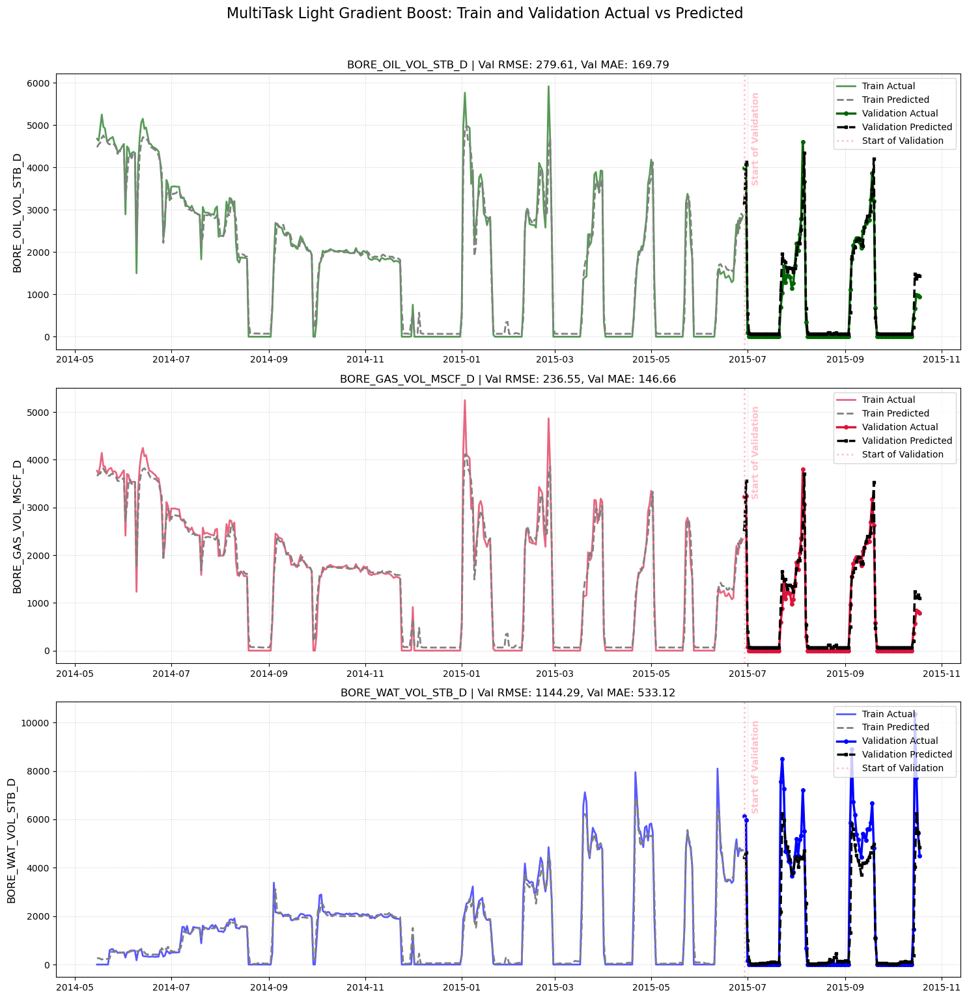

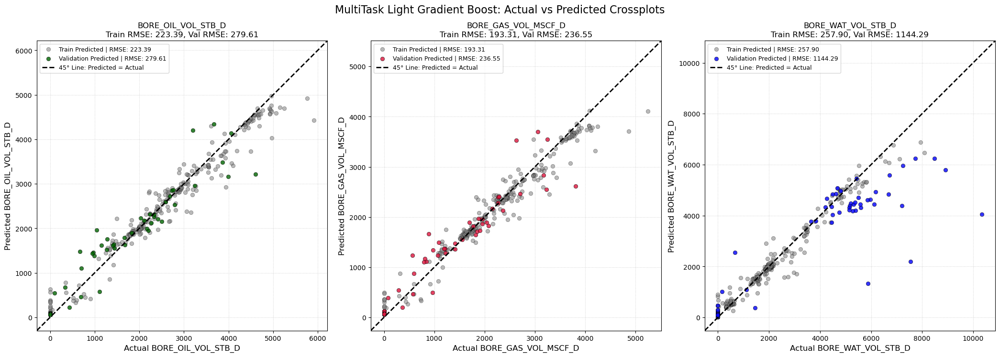

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiTask Light Gradient Boost,BORE_OIL_VOL_STB_D,223.387837,140.107392,0.980797,279.605568,169.786703,0.943301
1,MultiTask Light Gradient Boost,BORE_GAS_VOL_MSCF_D,193.307457,122.670676,0.978907,236.551702,146.660916,0.940927
2,MultiTask Light Gradient Boost,BORE_WAT_VOL_STB_D,257.904360,145.973443,0.977219,1144.290227,533.116675,0.835798


In [77]:
multitask_train_pred_df, multitask_val_pred_df, multitask_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        model=best_multitask_lgbm_linear_tree_model,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Light Gradient Boost",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
    )
)

GB_model_val_metric=multitask_metrics_df
GB_model_val_metric

## FINAL DATAFRAME RESULT For ONE STEP LOOK FOWARD

In [408]:
multitask_metrics_df

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiTask Lasso,BORE_OIL_VOL_STB_D,370.424163,201.126980,0.947199,558.219852,410.132305,0.774009
1,MultiTask Lasso,BORE_GAS_VOL_MSCF_D,306.498378,163.122822,0.946974,433.599478,308.381642,0.801521
2,MultiTask Lasso,BORE_WAT_VOL_STB_D,385.869456,214.568938,0.949003,1132.565894,524.771684,0.839146


# PIPELINE FEATURE ENGINEERING & MODELLING FOR RECURSIVE
There is a slight modiffcation in the pipleine for recursive compared to the one-step look ahead. I need to drop the targets in the pipeline over here in phase_column_dropper. <br>
The Recursive model is the final ones that will be deployed. It will take an horizon window as input. The recursive model will then forecast recusively for that time window at the end of that time horizon it will then reset and fetch the actual real data at that time. <br> As a check, if the horizon window is one day, the recursive model will be exactly like the one step look ahead. 


## PipeLine

In [88]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

In [89]:
specific_lag1_adder = AddSpecificLag1Features(
    variables=['ON_STREAM_HRS', 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
    freq="1D",

    verbose=True,
)

In [90]:
phase_column_dropper = DropFeatures(
    features_to_drop=[
        # raw same-day targets
        "BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",

        # raw same-day derived target features
        "GOR_MSCF_STB",
        "WCUT",

        # raw same-day uptime if not known in deployment
        #"ON_STREAM_HRS",
    ]
)

In [91]:

feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", GOR_WCUT_feat),
        
        ("added_phase_lag_features", phase_selected_lag_lasso_adder),
        ("added_rolling_window_features", phase_rolling_feat),
        ("added_expanding_window_features", expanding_feat),
        ("added_Time_features", trend_adder),

        #("added_phase_calendar_fourier_selector", phase_calendar_fourier_selector),        
        #("added_oil_calendar_fourier_selector", oil_calendar_fourier_selector),
        #("added_gas_calendar_fourier_selector", gas_calendar_fourier_selector),
        #("added_water_calendar_fourier_selector", water_calendar_fourier_selector),
        ("added_week_month_of_year_adder", week_month_of_year_adder),
        ("added_sin_cos_adder", sin_cos_adder),
        ("final_lagged_columns_by_1day", specific_lag1_adder),
        ("final_column_drop", phase_column_dropper), # drop GOR and WCUT & ON_STREAM_HRS at time t
        ("drop_missing_rows_once", final_nan_dropper),
        
    ]
)

In [92]:
train_feat = feature_pipe.fit_transform(train_data)
X_train = train_feat.copy()
y_train = train_data[target_cols].loc[X_train.index]

#grid.fit(X_train, y_train)
#best_lasso_model = grid.best_estimator_

MultiPhaseLassoSelectedLagFeatureAdder__Original columns after GOR/WCUT: 13
MultiPhaseLassoSelectedLagFeatureAdder__All lag features created: 572
MultiPhaseLassoSelectedLagFeatureAdder__Candidate lag features used by MultiTaskLasso: 572
MultiPhaseLassoSelectedLagFeatureAdder__Rows used internally for Lasso fit: 404
MultiPhaseLassoSelectedLagFeatureAdder__Best alpha: 0.14174741629268056
MultiPhaseLassoSelectedLagFeatureAdder__Lasso-selected lag features: 10
MultiPhaseLassoSelectedLagFeatureAdder__Force-kept lag features: 28
MultiPhaseLassoSelectedLagFeatureAdder__Final selected lag features: 35
MultiPhaseLassoSelectedLagFeatureAdder__Final dataframe columns returned: 48
Missing force-keep lag features:
['AVG_CHOKE_SIZE_P_lag_0D', 'AVG_WHT_P_lag_0D']
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__Requested variables: 6
AddSpecificLag1Features__Existing lag columns skipped: 5
AddSpecificLag1Features__New lag columns to add: 1
Skipped existing lag c

In [93]:
train_data

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,
2014-04-07,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014-04-08,0.0,1.003059,1125.408365,75.594150,1005.397107,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014-04-09,0.0,0.979008,2250.816730,119.188301,2010.794214,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014-04-10,0.0,0.545759,3376.225094,162.782451,3016.191321,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014-04-11,0.0,1.215987,4501.633459,206.376602,4021.588427,479.668948,480.045032,50.863856,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-24,24.0,56.584188,3320.924670,226.803437,2794.197366,125.110567,526.727304,166.484526,2655.683578,2195.201304,5174.941177,0.826605,0.660859
2015-06-25,24.0,56.562100,3280.979710,226.705080,2776.178105,103.514989,504.801604,163.821664,2440.005993,2017.348353,4470.230865,0.826780,0.646900
2015-06-26,24.0,58.214131,3251.842204,226.691844,2761.935340,86.426280,489.906864,162.178477,2809.154942,2308.021883,4814.535065,0.821607,0.631523


In [94]:
forecast_horizon = 30

last_date = train_data.index.max()

future_index = pd.date_range(
    start=last_date + pd.Timedelta(days=1),
    periods=forecast_horizon,
    freq="D",
)

In [95]:
# make fture exogenous df
future_exog_df = pd.DataFrame(index=future_index)

exog_cols = [
    "AVG_CHOKE_SIZE_P",
    "AVG_DOWNHOLE_PRESSURE_PSI",
    "AVG_DOWNHOLE_TEMPERATURE_F",
    "AVG_DP_TUBING_PSI",
    "DP_CHOKE_SIZE_PSI",
    "AVG_WHP_P_PSI",
    "AVG_WHT_P",
    "ON_STREAM_HRS",
]

forecast_horizon = 30

future_exog_df = val_data.iloc[:forecast_horizon].copy()

# Save actual validation targets before hiding them
y_val_recursive_actual = future_exog_df[target_cols].copy()

# Hide future target columns
future_exog_df[target_cols] = np.nan

# Also hide/drop future target-derived columns
future_exog_df[["GOR_MSCF_STB", "WCUT"]] = np.nan

In [96]:
#future_exog_df

In [97]:
#train_data

In [98]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

#for col in target_cols:
    #future_exog_df[col] = np.nan

In [99]:
#forecast_30d_df, recursive_history_df = recursive_forecast_multiphase(
    #model=best_lasso_model,
    #feature_pipe=feature_pipe,
    #history_df=train_data.copy(),
    #future_exog_df=future_exog_df.copy(),
    #target_cols=target_cols,
    #model_feature_cols=X_train.columns,
    #horizon=30,
    #clip_negative=True,
    #verbose=True,
#)

#forecast_30d_df

In [100]:
#recursive_metrics = []

#for col in target_cols:
   # y_true = y_val_recursive_actual.loc[forecast_30d_df.index, col]
    #y_pred = forecast_30d_df[col]

    #recursive_metrics.append(
        #{
            #"Phase": col,
            #"Recursive_Val_RMSE": root_mean_squared_error(y_true, y_pred),
            #"Recursive_Val_MAE": mean_absolute_error(y_true, y_pred),
           # "Recursive_Val_R2": r2_score(y_true, y_pred),
       # }
    #)

#recursive_metrics_df = pd.DataFrame(recursive_metrics)
#recursive_metrics_df

## Walk-forward recursive Models, Train and validation
plot_multi_phase_train_walkforward_val_diagnostics has a clipper function in it to make sure that if the gradient boosting models predict a negative rate, it will change it to zero. It is like val_pred = np.maximum(0, val_pred_raw) in the onestep look ahead workflow above

### Lasso

In [99]:
(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    model=best_lasso_model,
    feature_pipe=feature_pipe,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)


Block 1: forecasting rows 0 to 29 (30 steps)
Forecast start: 2015-06-29 00:00:00
Forecast end:   2015-07-28 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 1/30: forecasted 2015-06-29 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 2/30: forecasted 2015-06-30 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 3/30: forecasted 2015-07-01 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 4/30: forecasted 2015-07-02 00:00:00
Trend features

In [100]:
lasso_model=walk_forward_metrics_df
lasso_model

,Phase,WalkForward_Val_RMSE,WalkForward_Val_MAE,WalkForward_Val_R2,N_Validation_Points
0,BORE_OIL_VOL_STB_D,575.602241,281.696866,0.759716,112
1,BORE_GAS_VOL_MSCF_D,450.750971,222.038567,0.785509,112
2,BORE_WAT_VOL_STB_D,1968.080489,1669.027000,0.514274,112


In [101]:
block_summary_df

,block,start_row,end_row,n_forecast_steps,start_date,end_date
0,1,0,29,30,2015-06-29,2015-07-28
1,2,30,59,30,2015-07-29,2015-08-27
2,3,60,89,30,2015-08-28,2015-09-26
3,4,90,111,22,2015-09-27,2015-10-18


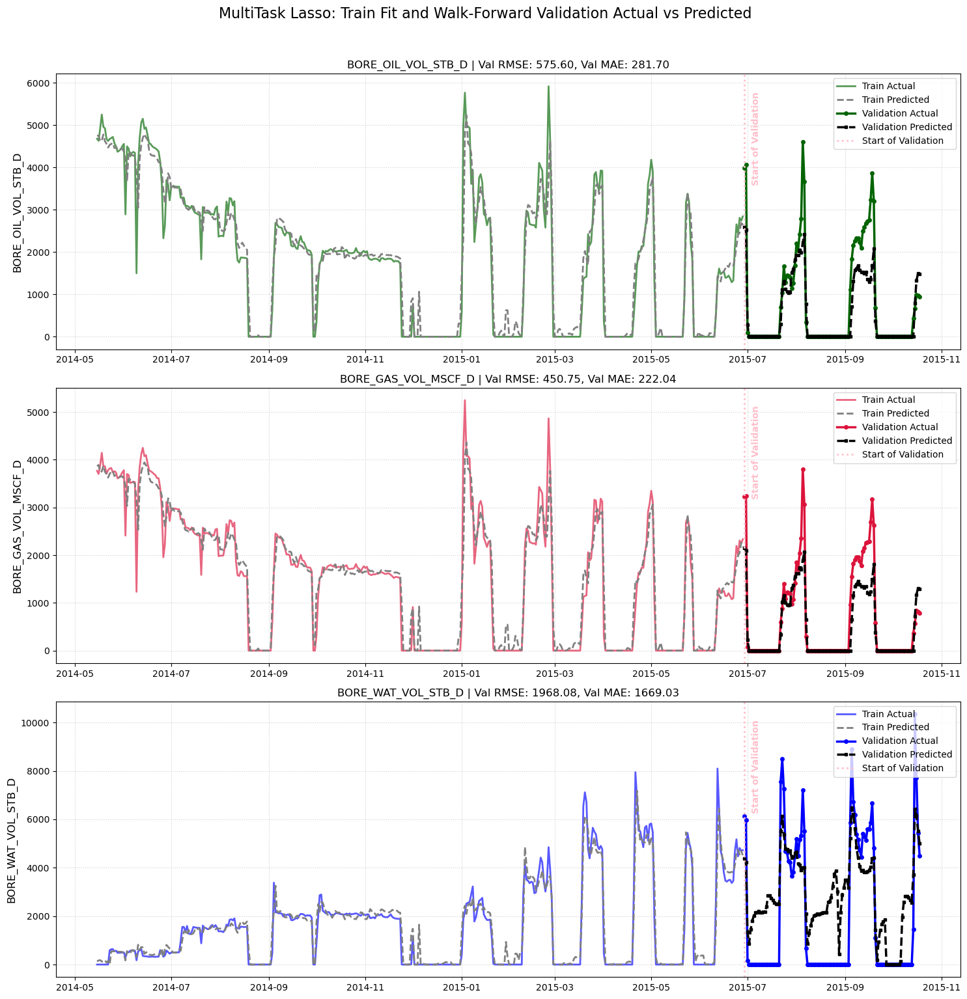

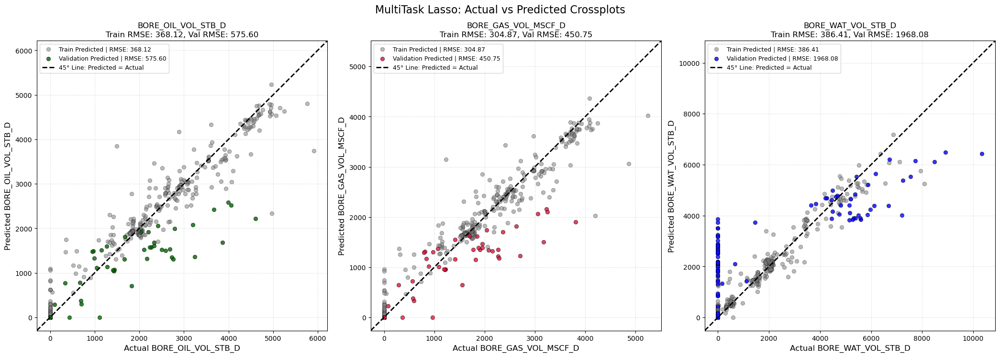

In [102]:
train_pred_df, val_pred_df, diagnostics_metrics_df = (
    plot_multi_phase_train_walkforward_val_diagnostics(
        model=best_lasso_model,
        X_train=X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Lasso",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

### Random Forest

In [103]:
(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    model=best_multitask_rf_model,
    feature_pipe=feature_pipe,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)


Block 1: forecasting rows 0 to 29 (30 steps)
Forecast start: 2015-06-29 00:00:00
Forecast end:   2015-07-28 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 1/30: forecasted 2015-06-29 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 2/30: forecasted 2015-06-30 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 3/30: forecasted 2015-07-01 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 4/30: forecasted 2015-07-02 00:00:00
Trend features

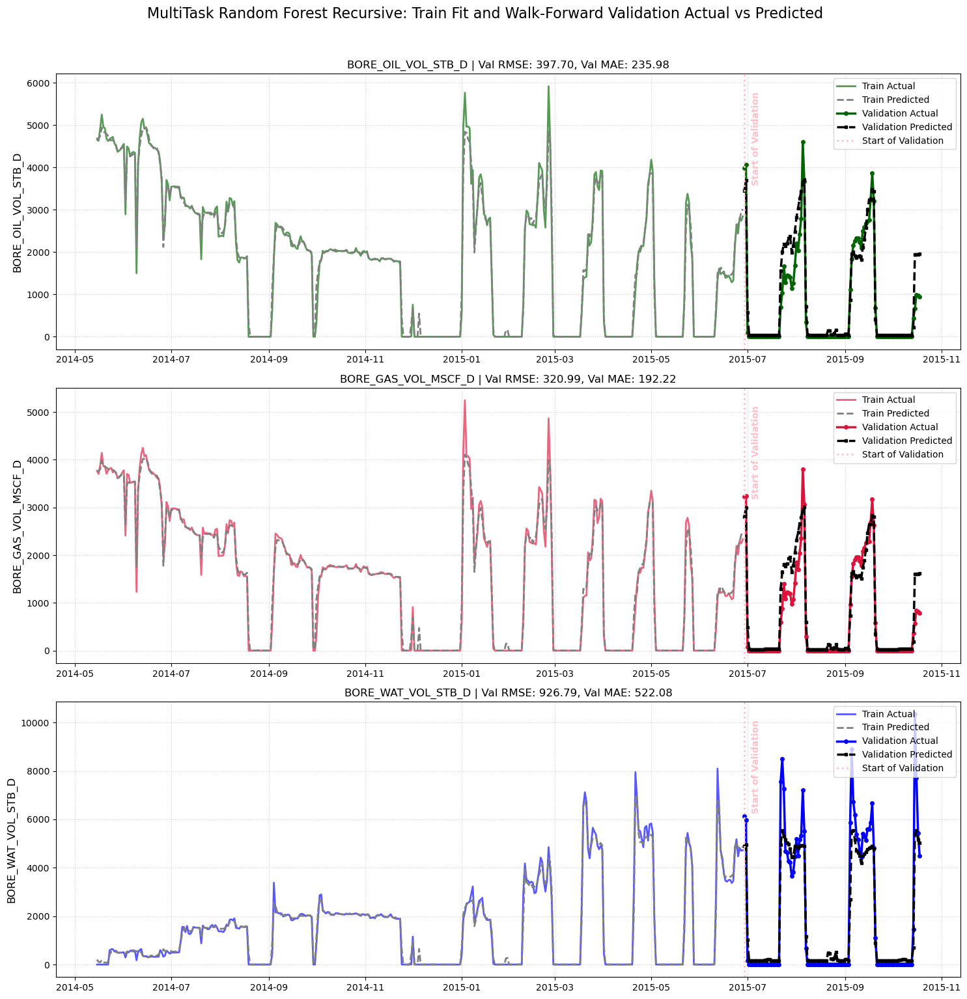

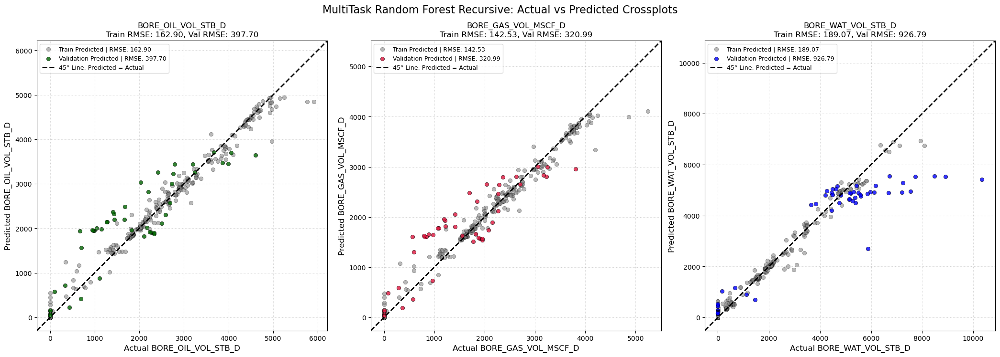

In [104]:
train_pred_df, val_pred_df, diagnostics_metrics_df = (
    plot_multi_phase_train_walkforward_val_diagnostics(
        model=best_multitask_rf_model,
        X_train=X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Random Forest Recursive",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

### Gradient Boost

In [110]:
(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    model=best_multitask_gb_model,
    feature_pipe=feature_pipe,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)


Block 1: forecasting rows 0 to 29 (30 steps)
Forecast start: 2015-06-29 00:00:00
Forecast end:   2015-07-28 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 1/30: forecasted 2015-06-29 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 2/30: forecasted 2015-06-30 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 3/30: forecasted 2015-07-01 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 4/30: forecasted 2015-07-02 00:00:00
Trend features

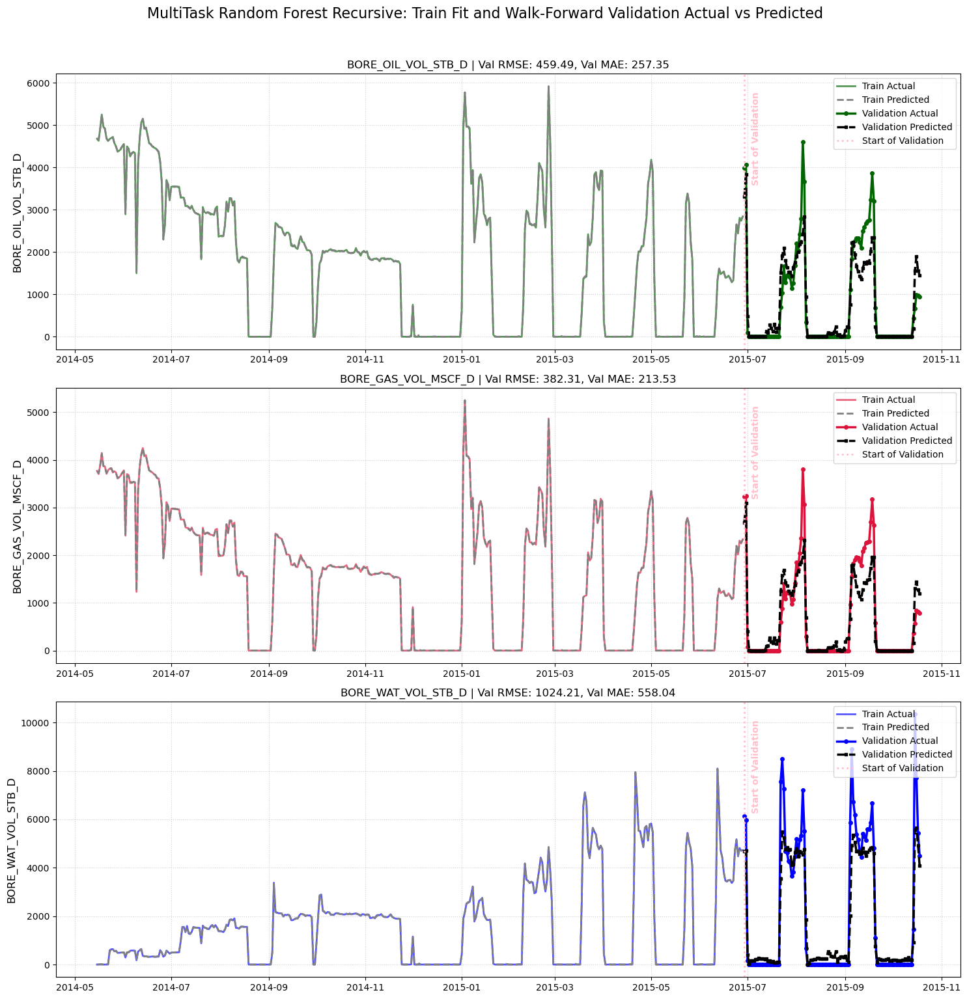

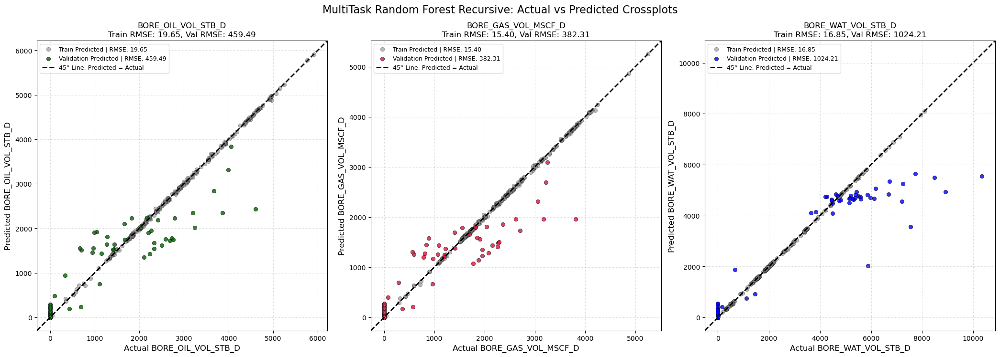

In [109]:
train_pred_df, val_pred_df, diagnostics_metrics_df = (
    plot_multi_phase_train_walkforward_val_diagnostics(
        model=best_multitask_gb_model,
        X_train=X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Random Forest Recursive",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

### Light GBM

In [106]:
(
    walk_forward_forecast_df,
    walk_forward_recursive_history_df,
    walk_forward_metrics_df,
    block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    model=best_multitask_lgbm_linear_tree_model,
    feature_pipe=feature_pipe,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)


Block 1: forecasting rows 0 to 29 (30 steps)
Forecast start: 2015-06-29 00:00:00
Forecast end:   2015-07-28 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 1/30: forecasted 2015-06-29 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 2/30: forecasted 2015-06-30 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 3/30: forecasted 2015-07-01 00:00:00
Trend features added: ['time_since_d', 'time_since_d_power_2']
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D']
after feature pipe line transformation
Step 4/30: forecasted 2015-07-02 00:00:00
Trend features

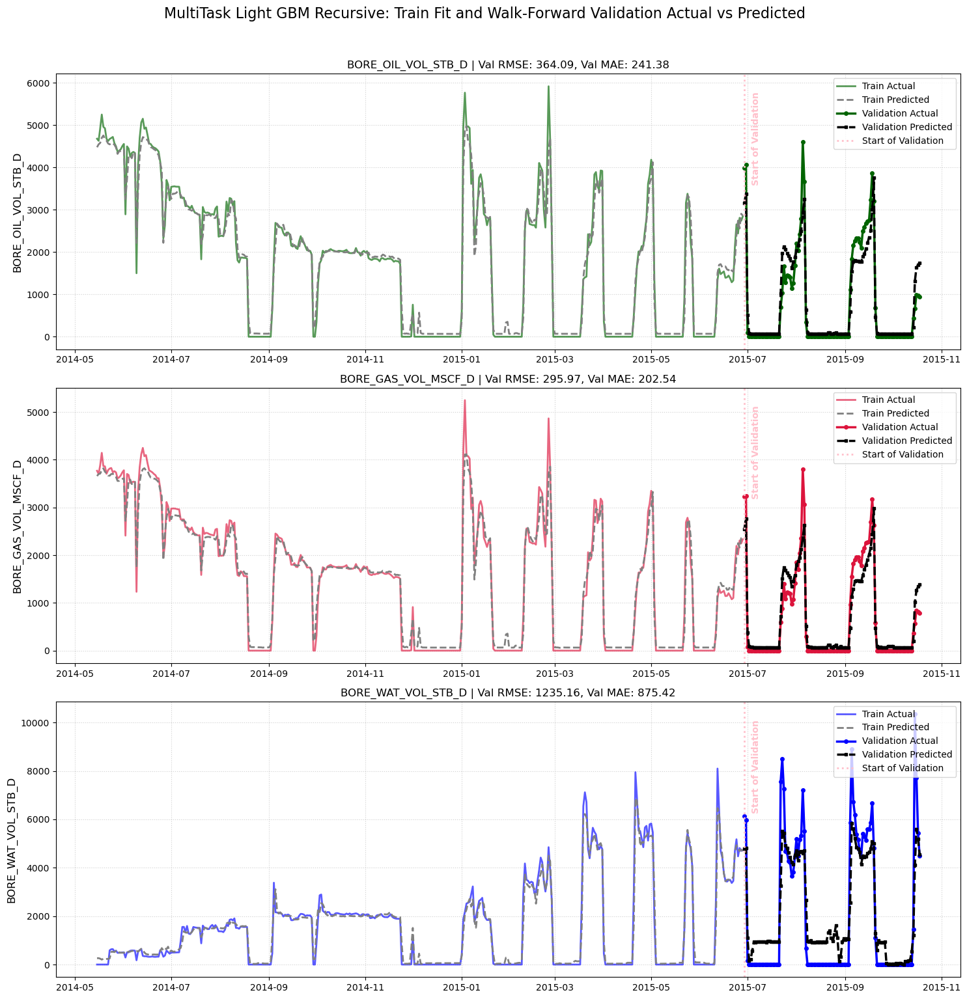

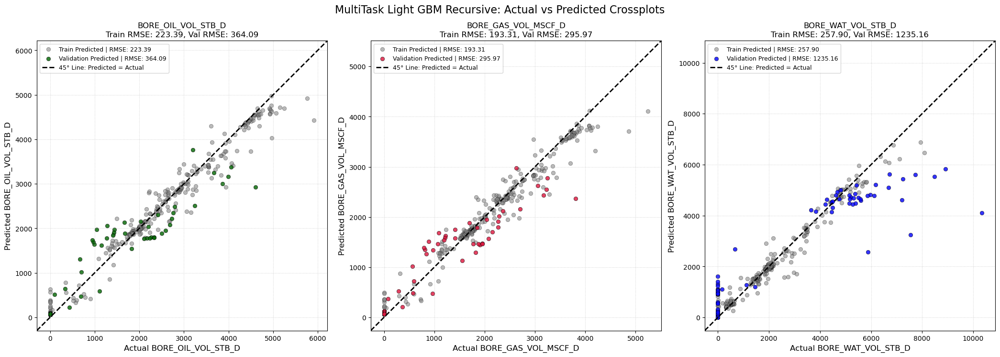

In [107]:
train_pred_df, val_pred_df, diagnostics_metrics_df = (
    plot_multi_phase_train_walkforward_val_diagnostics(
        model=best_multitask_lgbm_linear_tree_model,
        X_train=X_train,
        y_train=y_train,
        y_val=y_val,
        walk_forward_forecast_df=walk_forward_forecast_df,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiTask Light GBM Recursive",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        walk_forward_metrics_df=walk_forward_metrics_df,
    )
)

### FINAL DATAFRAME RESULT For RECUSIVE

In [281]:
# If "Model" exists, this overwrites it. If it doesn't, it creates it at the end.
walk_forward_metrics_df["Model"] = "Lasso"

# Optional: If you want to make sure it stays at the front of the table
cols = ["Model"] + [
    c for c in walk_forward_metrics_df.columns if c != "Model"
]
walk_forward_metrics_df = walk_forward_metrics_df[cols]
walk_forward_metrics_df

,Model,Phase,WalkForward_Val_RMSE,WalkForward_Val_MAE,WalkForward_Val_R2,N_Validation_Points
0,Lasso,BORE_OIL_VOL_STB_D,543.412171,285.451752,0.785839,112
1,Lasso,BORE_GAS_VOL_MSCF_D,424.290979,223.811541,0.809952,112
2,Lasso,BORE_WAT_VOL_STB_D,2708.874319,2332.508120,0.079798,112


In [282]:
# If "Model" exists, this overwrites it. If it doesn't, it creates it at the end.
walk_forward_metrics_df["Model"] = "test"

# Optional: If you want to make sure it stays at the front of the table
cols = ["Model"] + [
    c for c in walk_forward_metrics_df.columns if c != "Model"
]
walk_forward_metrics_df = walk_forward_metrics_df[cols]
walk_forward_metrics_df

,Model,Phase,WalkForward_Val_RMSE,WalkForward_Val_MAE,WalkForward_Val_R2,N_Validation_Points
0,test,BORE_OIL_VOL_STB_D,543.412171,285.451752,0.785839,112
1,test,BORE_GAS_VOL_MSCF_D,424.290979,223.811541,0.809952,112
2,test,BORE_WAT_VOL_STB_D,2708.874319,2332.508120,0.079798,112


In [247]:
multioutput_lasso_pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        (
            "model",
            MultiOutputRegressor(
                Lasso(
                    max_iter=500000,
                    tol=1e-5,
                    random_state=42,
                )
            ),
        ),
    ]
)

multioutput_lasso_model = TransformedTargetRegressor(
    regressor=multioutput_lasso_pipe,
    transformer=StandardScaler(),
)

param_grid = {
    "regressor__model__estimator__alpha": np.logspace(-3, -1, 100)
}

grid = GridSearchCV(
    estimator=multioutput_lasso_model,
    param_grid=param_grid,
    cv=ts_cv,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)

grid.fit(X_train, y_train)

,estimator,TransformedTa...ndardScaler())
,param_grid,"{'regressor__model__estimator__alpha': array([0.001 ..., 0.1 ])}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,TimeSeriesSpl...est_size=None)
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,copy,True


In [248]:
# -----------------------------
# The predictions are back to the original units,
# but the coefficients are scaled
# -----------------------------


# -----------------------------
# 1. Get final fitted estimator from grid search
# -----------------------------
best_model = grid.best_estimator_

# If you used TransformedTargetRegressor,
# the fitted internal pipeline is here
best_pipeline = best_model.regressor_


# -----------------------------
# 2. Extract fitted MultiOutputRegressor model
# -----------------------------
multioutput_lasso_model = best_pipeline.named_steps["model"]


# -----------------------------
# 3. Get feature names
# -----------------------------
scaler = best_pipeline.named_steps["scaler"]

if hasattr(scaler, "feature_names_in_"):
    feature_names = scaler.feature_names_in_
else:
    feature_names = X_train.columns.to_numpy()


# -----------------------------
# 4. Extract coefficients
# MultiOutputRegressor has one fitted Lasso per target
# Each estimator has coef_ shape = n_features
# -----------------------------
coef_matrix = np.vstack(
    [
        estimator.coef_
        for estimator in multioutput_lasso_model.estimators_
    ]
)

print("Coefficient matrix shape:", coef_matrix.shape)
print("Number of feature names:", len(feature_names))


# -----------------------------
# 5. Create coefficient dataframe
# Assumes y_train columns are oil, gas, water in this order
# -----------------------------
target_cols = y_train.columns.tolist()

coef_df = pd.DataFrame({"Feature": feature_names})

for i, target in enumerate(target_cols):
    coef_df[f"{target}_Coefficient"] = coef_matrix[i, :]


# -----------------------------
# 6. Compute overall importance across all targets
# -----------------------------
coef_cols = [f"{target}_Coefficient" for target in target_cols]

coef_df["Importance"] = np.sqrt(
    np.sum(coef_df[coef_cols].values ** 2, axis=1)
)


# -----------------------------
# 7. Keep selected features
# Selected means non-zero for at least one phase
# -----------------------------
MultiOutput_Lasso_selected_features = (
    coef_df[coef_df["Importance"] != 0]
    .sort_values("Importance", ascending=False)
    .reset_index(drop=True)
)


# -----------------------------
# 8. Print result
# -----------------------------
print(
    f"MultiOutput Lasso selected "
    f"{len(MultiOutput_Lasso_selected_features)} out of {len(feature_names)} features:\n"
)

print(MultiOutput_Lasso_selected_features.to_string(index=False))

print("Best alpha:", grid.best_params_["regressor__model__estimator__alpha"])
print("Best CV RMSE:", -grid.best_score_)

Coefficient matrix shape: (3, 76)
Number of feature names: 76
MultiOutput Lasso selected 55 out of 76 features:

                         Feature  BORE_OIL_VOL_STB_D_Coefficient  BORE_GAS_VOL_MSCF_D_Coefficient  BORE_WAT_VOL_STB_D_Coefficient   Importance
                AVG_CHOKE_SIZE_P                    4.441438e-01                     4.548231e-01                        0.415252 7.593169e-01
      BORE_GAS_VOL_MSCF_D_lag_1D                    1.990763e-01                     4.570184e-01                       -0.000000 4.984949e-01
       BORE_WAT_VOL_STB_D_lag_1D                   -0.000000e+00                    -0.000000e+00                        0.452856 4.528559e-01
                       AVG_WHT_P                    1.435209e-01                     1.252719e-01                        0.358119 4.056361e-01
         AVG_CHOKE_SIZE_P_lag_1D                   -0.000000e+00                    -0.000000e+00                       -0.366137 3.661372e-01
                     WCUT_lag

In [249]:
for target in target_cols:
    coef_col = f"{target}_Coefficient"

    selected_for_target = (
        coef_df[coef_df[coef_col] != 0]
        [["Feature", coef_col]]
        .sort_values(coef_col, key=abs, ascending=False)
        .reset_index(drop=True)
    )

    print(f"\n{target}: selected {len(selected_for_target)} features")
    print(selected_for_target.to_string(index=False))


BORE_OIL_VOL_STB_D: selected 35 features
                         Feature  BORE_OIL_VOL_STB_D_Coefficient
                AVG_CHOKE_SIZE_P                    4.441438e-01
       BORE_OIL_VOL_STB_D_lag_1D                    2.617812e-01
      BORE_GAS_VOL_MSCF_D_lag_1D                    1.990763e-01
                     WCUT_lag_1D                   -1.451903e-01
                       AVG_WHT_P                    1.435209e-01
BORE_OIL_VOL_STB_D_expanding_sum                   -1.270722e-01
               water_month_sin_1                    1.081097e-01
             GOR_MSCF_STB_lag_1D                    7.944267e-02
               DP_CHOKE_SIZE_PSI                    7.221756e-02
       AVG_DOWNHOLE_PRESSURE_PSI                    7.022906e-02
 BORE_WAT_VOL_STB_D_window_7_std                   -6.293144e-02
                    WCUT_lag_18D                   -4.487301e-02
 BORE_OIL_VOL_STB_D_window_7_std                    4.324234e-02
      BORE_WAT_VOL_STB_D_lag_14D                

#### Lasso Model Prediction on TRAIN

In [250]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

best_lasso_model = grid.best_estimator_

train_pred = best_lasso_model.predict(X_train)

train_pred_df = pd.DataFrame(
    train_pred,
    index=X_train.index,
    columns=target_cols,
)

train_metrics = []

for col in target_cols:
    train_metrics.append(
        {
            "Phase": col,
            "Train_RMSE": root_mean_squared_error(y_train[col], train_pred_df[col]),
            "Train_MAE": mean_absolute_error(y_train[col], train_pred_df[col]),
            "Train_R2": r2_score(y_train[col], train_pred_df[col]),
        }
    )

train_metrics_df = pd.DataFrame(train_metrics)
train_metrics_df

,Phase,Train_RMSE,Train_MAE,Train_R2
0,BORE_OIL_VOL_STB_D,374.308539,224.573568,0.946086
1,BORE_GAS_VOL_MSCF_D,307.406073,183.903356,0.946659
2,BORE_WAT_VOL_STB_D,382.245525,240.408445,0.949956


#### Lasso Model Prediction on Val

In [251]:

val_pred = best_lasso_model.predict(X_val)

val_pred_df = pd.DataFrame(
    val_pred,
    index=X_val.index,
    columns=target_cols,
)

val_metrics = []

for col in target_cols:
    val_metrics.append(
        {
            "Phase": col,
            "Train_RMSE": root_mean_squared_error(y_val[col], val_pred_df[col]),
            "Train_MAE": mean_absolute_error(y_val[col], val_pred_df[col]),
            "Train_R2": r2_score(y_val[col], val_pred_df[col]),
        }
    )

val_metrics_df = pd.DataFrame(val_metrics)
val_metrics_df

,Phase,Train_RMSE,Train_MAE,Train_R2
0,BORE_OIL_VOL_STB_D,643.011985,512.415323,0.700140
1,BORE_GAS_VOL_MSCF_D,487.688382,379.499471,0.748915
2,BORE_WAT_VOL_STB_D,995.523662,741.655815,0.875718


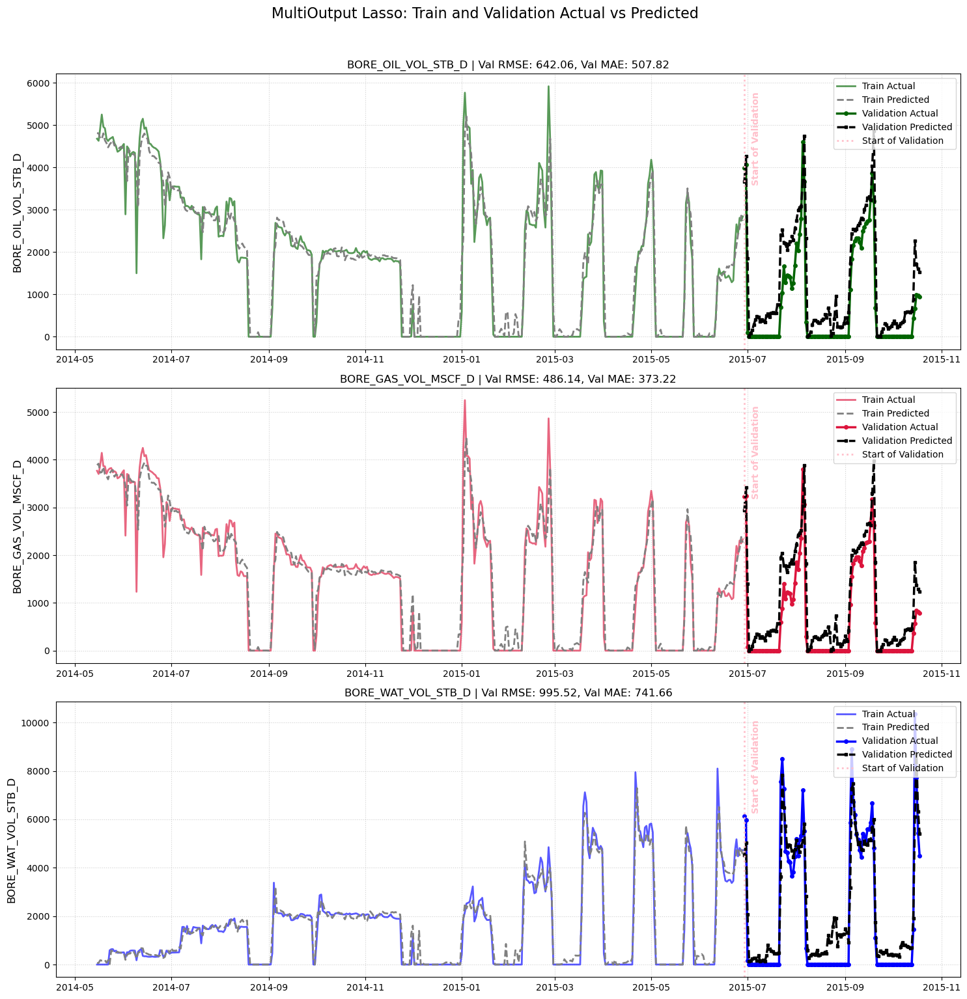

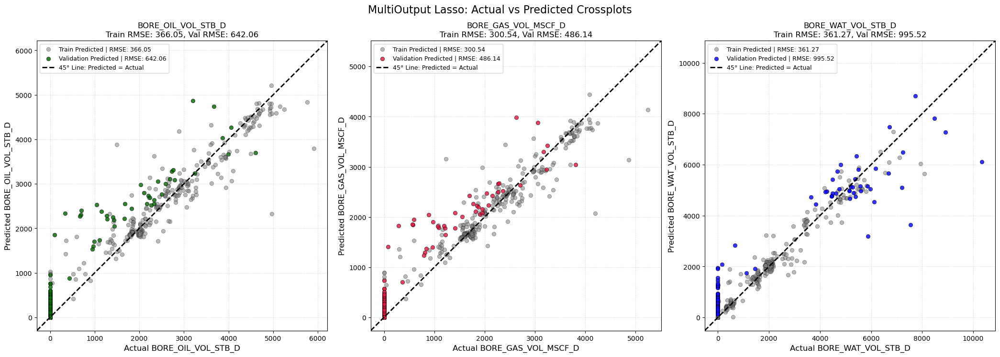

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,MultiOutput Lasso,BORE_OIL_VOL_STB_D,366.048507,197.186297,0.948439,642.059348,507.817681,0.701028
1,MultiOutput Lasso,BORE_GAS_VOL_MSCF_D,300.538604,161.334279,0.949016,486.140585,373.224786,0.750506
2,MultiOutput Lasso,BORE_WAT_VOL_STB_D,361.268052,204.292559,0.955298,995.523662,741.655815,0.875718


In [252]:

multioutput_train_pred_df, multioutput_val_pred_df, multioutput_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        model=best_lasso_model,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        model_name="MultiOutput Lasso",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
    )
)

multioutput_metrics_df

In [125]:
best_lasso_model_oil = grid.best_estimator_

LASSO_train_PRED_oil = best_lasso_model_oil.predict(X_train_oil)


train_rmse_lasso_oil = root_mean_squared_error(y_train_oil, LASSO_train_PRED_oil)
train_mae_lasso_oil = mean_absolute_error(y_train_oil, LASSO_train_PRED_oil)
train_r2_lasso_oil = r2_score(y_train_oil, LASSO_train_PRED_oil)

print("Validation RMSE:", train_rmse_lasso_oil)
print("Validation MAE:", train_mae_lasso_oil)
print("Validation R2:", train_r2_lasso_oil)

Validation RMSE: 543.5383716056938
Validation MAE: 314.9715639798182
Validation R2: 0.8912517651832021


In [130]:
best_lasso_model_gas = grid.best_estimator_

LASSO_train_PRED_gas = best_lasso_model_gas.predict(X_train_gas)


train_rmse_lasso_gas = root_mean_squared_error(y_train_gas, LASSO_train_PRED_gas)
train_mae_lasso_gas = mean_absolute_error(y_train_gas, LASSO_train_PRED_gas)
train_r2_lasso_gas = r2_score(y_train_gas, LASSO_train_PRED_gas)

print("Validation RMSE:", train_rmse_lasso_gas)
print("Validation MAE:", train_mae_lasso_gas)
print("Validation R2:", train_r2_lasso_gas)

Validation RMSE: 440.54129706965017
Validation MAE: 259.73048966195165
Validation R2: 0.8943632575233765
